# Análisis de Centros de Salud y Farmacias en Chile

### Contexto y motivación
Dentro de una sociedad y de la organizacion de un Estado, se necesita la existen-
cia de servicios básicos  que cubran las distintas necesidades de los habitantes.
Por lo tanto, es fundamental una organizacion territorial coherente con la densi-
dad poblacional de cada sector dentro del país. Debido a la constante demanda
dentro de los servicios de salud, es que se busca hacer una recolección y análisis
de las instituciones que los componen y su distribución a través de Chile.
Según ”El Diario El Mostrador” en 2022 había  50 zonas rurales dentro de
Chile que no contaban con farmacias en sus localidades. Teniendo que viajar
horas para conseguir medicamentos. Dejando a más de 300.000 personas afec-
tadas.

Sucede algo similar con aquellos poblados alejados de las ciudades, donde se
debe viajar para obtener una atencion médica que incluso no se asegura, tenga
el centro especializado. Por ejemplo, segun un reportaje de 24hrs en plena pandemia.
Por esta distribucion territorial de los servicios, habitantes como los de
la isla Tenglo deb ́ıan cruzar a Puerto montt para lograr acceso.
Con el trasfondo de conocer sus ubicaciones actuales y cuánta centralización
hay en acceso a estas dentro de cada zona,es que se busca hacer un panorama
general de la distribución de los servicios de salud a lo largo del país.

Finalmente, este proyecto está dirigido a aquellas autoridades o personas
involucradas en elaboración de políticas públicas y dirección general de la contrucción
de establecimientos médicos. Considerando así también a las municipalidades de cada localidad y aquellos sujetos pertinenetes en la toma de decisiones de construcción dentro del Ministerio de Salud. Aunque incluso, tiene
su relavancia para el público general y la adquisición de conocimiento respecto
a la situación país de la distribución de aquellos centros y farmacias que ellos
mismos pueden necesitar.


### Evolucion de las preguntas

1. Cambio de la pregunta de 2 de servicio especialisado a complejidad y tipo emergencia, puesto que esas son las columnas de dataframe
2. Se borro lo pregunta de ¿si hay comunas sin farmacias? pues era redundate pues que la pregunda ¿Cuál es la distribución numérica y territorial de las farmacias actualmente a lo largo de Chile? la respondia tambien
3. Se cambio la pregunta ¿Distancia promedio de los centros de salud a zonas pobladas? a ¿Al agrupar los hospitales por coordenadas, todos estos grupos tienen cada tipo de servicio según complejidad?, se cambio pues la dificultad de calcular la distancia de tadas las areas pobladas a los centros de salud, ademas para esto se hubiera ocupado la herramiento de google maps API y eso cuesta dinero.
4. Surgió la pregunta ¿Cuál es la distribución de servicios médicos privados y públicos en Chile?

### Preguntas
1. ¿En qué región  y comuna se encuentra la mayor y la menor concentración
de servicios médicos?
2. ¿Hay alguna comuna y/o región que no tenga un establecimientos de todos
los tipos de complejidad y tipo de emergencia?
3. ¿Cuál es la distribución numérica y territorial de las farmacias actualmente a lo largo de Chile?
4. ¿Cuál es la distribución de servicios médicos privados y públicos en Chile?
5. ¿Al agrupar los hospitales por coordenadas todos estos grupos tienen cada tipo de servicio según complejidad? 

### Objetivos
1. Analizar la distribución de servicios médicos que se encuentran a lo largo
del territorio chileno.
2. Visualizar las localidades donde se pueden maximizar los beneficios a la
población según la distribución.





### Datos

Los presentes datos son públicos y de libre acceso, fueron extraídos de los portales del Instituto de Salud Pública, Ministerio de Salud, página online del CENSO 2017 y Biblioteca del Congreso Nacional. Cabe destacar que la información sobre columnas, entradas totales y tipos de datos dentro de cada archivo son provistas aquí en las siguientes celdas, previo a cualquier exploración que se vaya a aplicar.

Los datos de la página del CENSO 2017 son utilizados para conocer información sobre la distribución poblacional a lo largo de Chile, desde el censo 2017. Tienen formato XLSX y son descargados directamente de su base de datos online.

Los datos del Minsal, son usados para conocer el listado de establecimientos de salud a lo largo de todo Chile. Tienen formato XLS y son descargados directamente de sus registros virtuales

Los datos del ISP, permiten obtener un catastro de todas las farmacias existentes en Chile. Tienen formato XLSX y son descargados directamente de su base de datos online.

Los datos del BCN, son empleados para tener los mapas del territorio chileno con divisiones por región y comuna. Es un archivo ZIP que contiene los mapas en formato shapefile.Son descargados directamente de su base de datos de mapas vectoriales. 


### Cargando librerías

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from sklearn.preprocessing import StandardScaler, MinMaxScaler


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Cargando datos

In [3]:
df_censo = pd.read_csv("./database/Cantidad_de_Personas_por_Sexo_y_Edad.csv", sep=";")
df_farmacias = pd.read_csv("./database/farmacias_chile.csv", sep=";", encoding="utf-8")
df_hospitales = pd.read_excel("./database/Establecimientos_DEIS_MINSAL_03_11_2023.xlsx", sheet_name="Establecimientos Vigentes")


### Qué tipo de datos traen las base de datos descargadas

A continuación utilizando el método .info es que se ouede visualizar las columnas existentes en cada base de datos (variables), sus nombres originales y el tipo de dato que representan. 

In [4]:
#Base de datos del Censo 2017 
df_censo.info() #Hay estan los tipos de datos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7634 entries, 0 to 7633
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ORDEN             7634 non-null   int64 
 1   NOMBRE REGIÓN     7634 non-null   object
 2   Código Región     7634 non-null   object
 3   NOMBRE PROVINCIA  7634 non-null   object
 4   Código Provincia  7634 non-null   object
 5   NOMBRE COMUNA     7634 non-null   object
 6   Código Comuna     7634 non-null   object
 7   Edad              7634 non-null   object
 8   Hombres           7634 non-null   object
 9   Mujeres           7634 non-null   object
 10  TOTAL             7634 non-null   object
dtypes: int64(1), object(10)
memory usage: 656.2+ KB


In [5]:
#Información sobre la base de datos de las farmacias en Chile
df_farmacias.info() #Hay estan los tipos de datos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5293 entries, 0 to 5292
Data columns (total 16 columns):
 #   Column                                           Non-Null Count  Dtype 
---  ------                                           --------------  ----- 
 0   Nombre Local                                     5293 non-null   object
 1   Empresa Farmacéutica                             5293 non-null   object
 2   Empresa RUT                                      5293 non-null   object
 3   Empresa Razón Social                             5293 non-null   object
 4   Número                                           5273 non-null   object
 5   Tipo                                             5293 non-null   object
 6   Dirección                                        5293 non-null   object
 7   Región                                           5293 non-null   object
 8   Comuna                                           5291 non-null   object
 9   Nro Resolución Apertura                  

In [7]:
#Información sobre la base de datos de los centros de salud a lo largo de Chile
df_hospitales.info() #Hay estan los tipos de datos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4527 entries, 0 to 4526
Data columns (total 32 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Versión 20231103  4489 non-null   object
 1   Unnamed: 1        4527 non-null   object
 2   Unnamed: 2        907 non-null    object
 3   Unnamed: 3        892 non-null    object
 4   Unnamed: 4        4527 non-null   object
 5   Unnamed: 5        4527 non-null   object
 6   Unnamed: 6        4484 non-null   object
 7   Unnamed: 7        4527 non-null   object
 8   Unnamed: 8        4527 non-null   object
 9   Unnamed: 9        4527 non-null   object
 10  Unnamed: 10       4527 non-null   object
 11  Unnamed: 11       4527 non-null   object
 12  Unnamed: 12       4527 non-null   object
 13  Unnamed: 13       4527 non-null   object
 14  Unnamed: 14       4527 non-null   object
 15  Unnamed: 15       4527 non-null   object
 16  Unnamed: 16       4527 non-null   object
 17  Unnamed: 17   

### Limpieza de Datos

Para realizar un análisis adecuado de los datos y una visualizaciones lo más correcta, es que se comienza con la limpieza de los datos. Donde se cambiarán los tipos de datos de algunas variables, se revisan columnas con nulos/símbolos no estándares, entre otras cosas.

In [6]:

def modificar_nombre_columna(nombre: str):
    nombre = nombre.strip()  
    nombre = nombre.lower() 
    nombre = nombre.replace(" ", "_")
    nombre = nombre.replace("\xa0", "_")
    return nombre

nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_censo.columns}
df_censo.rename(columns=nuevos_nombres, inplace=True) # Renombrar columnas del dataframe del censo

df_censo["código_región"] = pd.to_numeric(df_censo["código_región"], errors="coerce")  # Poner el tipo de dato correcto a cada columna
df_censo["código_provincia"] = pd.to_numeric(df_censo["código_provincia"], errors="coerce")
df_censo["código_comuna"] = pd.to_numeric(df_censo["código_comuna"], errors="coerce")
df_censo["edad"] = df_censo["edad"].astype("category")
df_censo["hombres"] = df_censo["hombres"].str.replace(".", "").astype("int")
df_censo["mujeres"] = df_censo["mujeres"].str.replace(".", "").astype("int")
df_censo["total"] = df_censo["total"].str.replace(".", "").astype("int")

df_hospitales.columns = df_hospitales.loc[0,:] # La primera fila tenai los nombres de las columnas
df_hospitales.drop(0, inplace=True)
df_hospitales.drop(columns=["Código Antiguo ", "Código  Madre Antiguo", "Código Madre Nuevo", "Código  Madre Antiguo", "Fecha de Incorporación a la base o cambios", "Teléfono", "Fecha Inicio Funcionamiento", "Vía", "Certificación ", "Número", "Dirección", "Clasificcion Tipo de SAPU", "Dependencia Administrativa"], inplace=True)
# Borro las columnas que no necesitamos

In [7]:
df_hospitales.loc[:,"Tipo de Urgencia "] = df_hospitales.loc[:,"Tipo de Urgencia "].str.replace("ambulatoria", "Ambulatoria") #normlaizamos el nombre de ambulatoria

df_hospitales.replace(["No Aplica", "Pendiente", "Completar", "No Aplica", "Por confirmar", "no Aplica", "Pendiente", "no aplica", "No Aplica"], np.NaN, inplace=True) # Todos las expresions de que no hay informacion lo llevamos a NaN

df_hospitales["Código Vigente"] = df_hospitales["Código Vigente"].astype("int") #Ponemos el tipo de datos correcto
df_hospitales["Código Región"] = df_hospitales["Código Región"].astype("int")

df_hospitales["Código Dependencia Jerárquica (SEREMI / Servicio de Salud)"] = df_hospitales["Código Dependencia Jerárquica (SEREMI / Servicio de Salud)"].astype("float")

df_hospitales["Pertenencia al SNSS"] = df_hospitales["Pertenencia al SNSS"].map(lambda x: x == 'Perteneciente' or x == True) #Cambiamos el dato a bool
df_hospitales["Pertenencia al SNSS"] = df_hospitales["Pertenencia al SNSS"].astype("bool")


df_hospitales["Tiene Servicio de Urgencia"] = df_hospitales["Tiene Servicio de Urgencia"].map(lambda x: x == 'SI' or x == True) # Cambiamos el dato a bool
df_hospitales["Tiene Servicio de Urgencia"] = df_hospitales["Tiene Servicio de Urgencia"].astype("bool")

df_hospitales["Nivel de Atención"] = df_hospitales["Nivel de Atención"].astype("category") # las columnas con datos categoricos las convertimos a category
df_hospitales["Tipo de Urgencia "] = df_hospitales["Tipo de Urgencia "].astype("category")
df_hospitales["Tipo de Prestador Sistema de Salud"] = df_hospitales["Tipo de Prestador Sistema de Salud"].astype("category")
df_hospitales["Nivel de Complejidad"] = df_hospitales["Nivel de Complejidad"].astype("category")
df_hospitales["Tipo de Atención "] = df_hospitales["Tipo de Atención "].astype("category")

df_hospitales = df_hospitales[df_hospitales['Estado de Funcionamiento'].str.contains("Vigente", case=False, na=False)] #Cambiamos el funcionamiento a bool
df_hospitales.drop(columns="Estado de Funcionamiento", inplace=True) # Los centros de salud que ya no esten en funcionamiento los borramos

In [8]:

nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_hospitales.columns}
df_hospitales.rename(columns=nuevos_nombres, inplace=True)
df_hospitales.rename(columns={"latitud______[grados_decimales]": "latitud", "longitud_[grados_decimales]":"longitud"}, inplace=True) #Renombramos columnas

df_hospitales["código_región"] = df_hospitales["código_región"].astype("int") # Cambiamos el tipo de dato
df_hospitales["código_comuna"] = df_hospitales["código_comuna"].astype("int")
df_hospitales["nombre_comuna"] = df_hospitales["nombre_comuna"].str.upper()
df_hospitales["tipo_establecimiento_(unidad)"] = df_hospitales["tipo_establecimiento_(unidad)"].str.strip()

df_hospitales.loc[df_hospitales["nombre_región"] == "Región De los Ríos", "nombre_región"] = "Región De Los Ríos" # Las comunas con datos erronios los cambiamos
df_hospitales.loc[df_hospitales["nombre_comuna"] == "CHILLÁN ", "nombre_comuna"] = "CHILLÁN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LICANTEN", "nombre_comuna"] = "LICANTÉN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "VICHUQUEN", "nombre_comuna"] = "VICHUQUÉN"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "CALERA","nombre_comuna"] = "LA CALERA"
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LAS CONDES", "código_comuna"] = 13114
df_hospitales.loc[df_hospitales["nombre_comuna"] == "LA FLORIDA", "código_comuna"] = 13110



In [9]:
# El censo no tiene el Ñuble por lo que lo vamos agregar nosotros

comunas_ñuble = {16109: 'YUNGAY',
 16105: 'PEMUCO',
 16104: 'EL CARMEN',
 16107: 'QUILLÓN',
 16108: 'SAN IGNACIO',
 16106: 'PINTO',
 16102: 'BULNES',
 16302: 'COIHUECO',
 16103: 'CHILLÁN VIEJO',
 16206: 'RÁNQUIL',
 16304: 'SAN FABIÁN',
 16101: 'CHILLÁN',
 16205: 'PORTEZUELO',
 16203: 'COELEMU',
 16305: 'SAN NICOLÁS',
 16301: 'SAN CARLOS',
 16207: 'TREGUACO',
 16204: 'NINHUE',
 16303: 'ÑIQUÉN',
 16201: 'QUIRIHUE',
 16202: 'COBQUECURA'}

comunas_ñuble = {v: k for k, v in comunas_ñuble.items()}


provincias_ñuble = {
    161: "DIGUILLÍN",
    162: "ITATA",
    163: "PUNILLA"
}


In [10]:
# Obtenemos los datos que sean de Ñuble y se cambian sus códigos
d = df_censo[df_censo["nombre_provincia"].str.contains("ÑUBLE")]
d.loc[:, "nombre_comuna"] = d["nombre_comuna"].str.replace(" *", "") #reemplazo de carácteres 
d.loc[:, "código_comuna"] = d["nombre_comuna"].map(comunas_ñuble).astype("string") 
d.loc[:, "nombre_región"] = "ÑUBLE"
d.loc[:, "código_región"] = 16
d.loc[:, "código_provincia"] = d["código_comuna"].str.slice(0,3)
d.loc[:, "código_provincia"] = d["código_provincia"].astype("int") #Cambio tipo de dato
d.loc[:, "nombre_provincia"] = d["código_provincia"].map(provincias_ñuble)

In [11]:
# Se borra la parte de las comunas del Ñuble y se agrega el Nuevo dataframe que tiene los datos de Ñuble correctos
df_censo.drop(df_censo[df_censo["nombre_provincia"].str.contains("ÑUBLE")].index, inplace=True)
df_censo = pd.concat([df_censo, d], ignore_index=True) #Se concatenan los dataframes
df_censo.sort_values(by="orden", inplace=True)
df_censo["código_comuna"] = df_censo["código_comuna"].astype("float")


# Se agrega el código provincia a los hospitales
codigo_comuna_a_provincia = dict(zip(df_censo['código_comuna'], df_censo['código_provincia']))
codigo_comuna_a_provincia = {int(comuna): int(provincia) for comuna, provincia in codigo_comuna_a_provincia.items() if not pd.isna(comuna)}
df_hospitales.loc[:, "código_provincia"] = df_hospitales["código_comuna"].map(codigo_comuna_a_provincia)
df_hospitales["código_provincia"] = df_hospitales["código_provincia"].astype("int")

# Se agrega el nombre de la provincia a los hospitales
codigo_comuna_a_nombre_provincia = dict(zip(df_censo['código_comuna'], df_censo['nombre_provincia']))
codigo_comuna_a_nombre_provincia = {int(comuna): str(provincia) for comuna, provincia in codigo_comuna_a_nombre_provincia.items() if not pd.isna(comuna)}
df_hospitales.loc[:, "nombre_provincia"] = df_hospitales["código_comuna"].map(codigo_comuna_a_nombre_provincia)


# Se crea un diccionario de código comuna a código región
codigo_comuna_a_codigo_region = dict(zip(df_censo['código_comuna'], df_censo['código_región']))
codigo_comuna_a_codigo_region = {int(comuna): int(provincia) for comuna, provincia in codigo_comuna_a_codigo_region.items() if not pd.isna(comuna)}


Los nombres de los comunas no coinciden con los del censo por lo que se establecen correctamente de forma manual con un diccionario

In [12]:
nombre_comuna_a_codigo_comuna = {'ARICA': 15101, 'CAMARONES': 15102, 'PUTRE': 15201, 'GENERAL LAGOS': 15202, 'IQUIQUE': 1101, 'ALTO HOSPICIO': 1107, 'POZO ALMONTE': 1401, 'CAMIÑA': 1402, 'CAMINA': 1402, 'COLCHANE': 1403, 'HUARA': 1404, 'PICA': 1405, 'ANTOFAGASTA': 2101, 'MEJILLONES': 2102, 'SIERRA GORDA': 2103, 'TALTAL': 2104, 'CALAMA': 2201, 'OLLAGÜE': 2202, 'OLLAGUE': 2202, 'SAN PEDRO DE ATACAMA': 2203, 'TOCOPILLA': 2301, 'MARÍA ELENA': 2302, 'MARIA ELENA': 2302, 'COPIAPÓ': 3101, 'COPIAPO': 3101, 'CALDERA': 3102, 'TIERRA AMARILLA': 3103, 'CHAÑARAL': 3201, 'CHANARAL': 3201, 'DIEGO DE ALMAGRO': 3202, 'VALLENAR': 3301, 'ALTO DEL CARMEN': 3302, 'FREIRINA': 3303, 'HUASCO': 3304, 'LA SERENA': 4101, 'COQUIMBO': 4102, 'ANDACOLLO': 4103, 'LA HIGUERA': 4104, 'PAIGUANO': 4105, 'VICUÑA': 4106, 'VICUNA': 4106, 'ILLAPEL': 4201, 'CANELA': 4202, 'LOS VILOS': 4203, 'SALAMANCA': 4204, 'OVALLE': 4301, 'COMBARBALÁ': 4302, 'COMBARBALA': 4302, 'MONTE PATRIA': 4303, 'PUNITAQUI': 4304, 'RÍO HURTADO': 4305, 'RIO HURTADO': 4305, 'VALPARAÍSO': 5101, 'VALPARAISO': 5101, 'CASABLANCA': 5102, 'CONCÓN': 5103, 'CONCON': 5103, 'JUAN FERNÁNDEZ': 5104, 'JUAN FERNANDEZ': 5104, 'PUCHUNCAVÍ': 5105, 'PUCHUNCAVI': 5105, 'QUINTERO': 5107, 'VIÑA DEL MAR': 5109, 'VINA DEL MAR': 5109, 'ISLA DE PASCUA': 5201, 'LOS ANDES': 5301, 'CALLE LARGA': 5302, 'RINCONADA': 5303, 'SAN ESTEBAN': 5304, 'LA LIGUA': 5401, 'CABILDO': 5402, 'PAPUDO': 5403, 'PETORCA': 5404, 'ZAPALLAR': 5405, 'QUILLOTA': 5501, 'CALERA': 5502, 'LA CALERA': 5502, 'HIJUELAS': 5503, 'LA CRUZ': 5504, 'NOGALES': 5506, 'SAN ANTONIO': 5601, 'ALGARROBO': 5602, 'CARTAGENA': 5603, 'EL QUISCO': 5604, 'EL TABO': 5605, 'SANTO DOMINGO': 5606, 'SAN FELIPE': 5701, 'CATEMU': 5702, 'LLAILLAY': 5703, 'PANQUEHUE': 5704, 'PUTAENDO': 5705, 'SANTA MARÍA': 5706, 'SANTA MARIA': 5706, 'QUILPUÉ': 5801, 'QUILPUE': 5801, 'LIMACHE': 5802, 'OLMUÉ': 5803, 'OLMUE': 5803, 'VILLA ALEMANA': 5804, 'SANTIAGO': 13101, 'CERRILLOS': 13102, 'CERRO NAVIA': 13103, 'CONCHALÍ': 13104, 'CONCHALI': 13104, 'EL BOSQUE': 13105, 'ESTACIÓN CENTRAL': 13106, 'ESTACION CENTRAL': 13106, 'HUECHURABA': 13107, 'INDEPENDENCIA': 13108, 'LA CISTERNA': 13109, 'LA FLORIDA': 13110, 'LA GRANJA': 13111, 'LA PINTANA': 13112, 'LA REINA': 13113, 'LAS CONDES': 13114, 'LO BARNECHEA': 13115, 'LO ESPEJO': 13116, 'LO PRADO': 13117, 'MACUL': 13118, 'MAIPÚ': 13119, 'MAIPU': 13119, 'ÑUÑOA': 13120, 'NUNOA': 13120, 'PEDRO AGUIRRE CERDA': 13121, 'PEÑALOLÉN': 13122, 'PENALOLEN': 13122, 'PROVIDENCIA': 13123, 'PUDAHUEL': 13124, 'QUILICURA': 13125, 'QUINTA NORMAL': 13126, 'RECOLETA': 13127, 'RENCA': 13128, 'SAN JOAQUÍN': 13129, 'SAN JOAQUIN': 13129, 'SAN MIGUEL': 13130, 'SAN RAMÓN': 13131, 'SAN RAMON': 13131, 'VITACURA': 13132, 'PUENTE ALTO': 13201, 'PIRQUE': 13202, 'SAN JOSÉ DE MAIPO': 13203, 'SAN JOSE DE MAIPO': 13203, 'COLINA': 13301, 'LAMPA': 13302, 'TILTIL': 13303, 'TIL-TIL': 13303, 'SAN BERNARDO': 13401, 'BUIN': 13402, 'CALERA DE TANGO': 13403, 'PAINE': 13404, 'MELIPILLA': 13501, 'ALHUÉ': 13502, 'ALHUE': 13502, 'CURACAVÍ': 13503, 'CURACAVI': 13503, 'MARÍA PINTO': 13504, 'MARIA PINTO': 13504, 'SAN PEDRO': 13505, 'TALAGANTE': 13601, 'EL MONTE': 13602, 'ISLA DE MAIPO': 13603, 'PADRE HURTADO': 13604, 'PEÑAFLOR': 13605, 'PENAFLOR': 13605, 'RANCAGUA': 6101, 'CODEGUA': 6102, 'COINCO': 6103, 'COLTAUCO': 6104, 'DOÑIHUE': 6105, 'DONIHUE': 6105, 'GRANEROS': 6106, 'LAS CABRAS': 6107, 'MACHALÍ': 6108, 'MACHALI': 6108, 'MALLOA': 6109, 'MOSTAZAL': 6110, 'OLIVAR': 6111, 'PEUMO': 6112, 'PICHIDEGUA': 6113, 'QUINTA DE TILCOCO': 6114, 'RENGO': 6115, 'REQUÍNOA': 6116, 'REQUINOA': 6116, 'SAN VICENTE': 6117, 'PICHILEMU': 6201, 'LA ESTRELLA': 6202, 'LITUECHE': 6203, 'MARCHIHUE': 6204, 'NAVIDAD': 6205, 'PAREDONES': 6206, 'SAN FERNANDO': 6301, 'CHÉPICA': 6302, 'CHEPICA': 6302, 'CHIMBARONGO': 6303, 'LOLOL': 6304, 'NANCAGUA': 6305, 'PALMILLA': 6306, 'PERALILLO': 6307, 'PLACILLA': 6308, 'PUMANQUE': 6309, 'SANTA CRUZ': 6310, 'TALCA': 7101, 'CONSTITUCIÓN': 7102, 'CONSTITUCION': 7102, 'CUREPTO': 7103, 'EMPEDRADO': 7104, 'MAULE': 7105, 'PELARCO': 7106, 'PENCAHUE': 7107, 'RÍO CLARO': 7108, 'RIO CLARO': 7108, 'SAN CLEMENTE': 7109, 'SAN RAFAEL': 7110, 'CAUQUENES': 7201, 'CHANCO': 7202, 'PELLUHUE': 7203, 'CURICÓ': 7301, 'CURICO': 7301, 'HUALAÑÉ': 7302, 'HUALANE': 7302, 'LICANTÉN': 7303, 'LICANTEN': 7303, 'MOLINA': 7304, 'RAUCO': 7305, 'ROMERAL': 7306, 'SAGRADA FAMILIA': 7307, 'TENO': 7308, 'VICHUQUÉN': 7309, 'VICHUQUEN': 7309, 'LINARES': 7401, 'COLBÚN': 7402, 'COLBUN': 7402, 'LONGAVÍ': 7403, 'LONGAVI': 7403, 'PARRAL': 7404, 'RETIRO': 7405, 'SAN JAVIER': 7406, 'VILLA ALEGRE': 7407, 'YERBAS BUENAS': 7408, 'CONCEPCIÓN': 8101, 'CONCEPCION': 8101, 'CORONEL': 8102, 'CHIGUAYANTE': 8103, 'FLORIDA': 8104, 'HUALQUI': 8105, 'LOTA': 8106, 'PENCO': 8107, 'SAN PEDRO DE LA PAZ': 8108, 'SANTA JUANA': 8109, 'TALCAHUANO': 8110, 'TOMÉ': 8111, 'TOME': 8111, 'HUALPÉN': 8112, 'HUALPEN': 8112, 'LEBU': 8201, 'ARAUCO': 8202, 'CAÑETE': 8203, 'CANETE': 8203, 'CONTULMO': 8204, 'CURANILAHUE': 8205, 'LOS ÁLAMOS': 8206, 'LOS ALAMOS': 8206, 'TIRÚA': 8207, 'TIRUA': 8207, 'LOS ÁNGELES': 8301, 'LOS ANGELES': 8301, 'ANTUCO': 8302, 'CABRERO': 8303, 'LAJA': 8304, 'MULCHÉN': 8305, 'MULCHEN': 8305, 'NACIMIENTO': 8306, 'NEGRETE': 8307, 'QUILACO': 8308, 'QUILLECO': 8309, 'SAN ROSENDO': 8310, 'SANTA BÁRBARA': 8311, 'SANTA BARBARA': 8311, 'TUCAPEL': 8312, 'YUMBEL': 8313, 'ALTO BIOBÍO': 8314, 'ALTO BIOBIO': 8314, 'CHILLÁN': 16101, 'CHILLAN': 16101, 'BULNES': 16102, 'COBQUECURA': 16202, 'COELEMU': 16203, 'COIHUECO': 16302, 'CHILLÁN VIEJO': 16103, 'CHILLAN VIEJO': 16103, 'EL CARMEN': 16104, 'NINHUE': 16204, 'ÑIQUÉN': 16303, 'NIQUEN': 16303, 'PEMUCO': 16105, 'PINTO': 16106, 'PORTEZUELO': 16205, 'QUILLÓN': 16107, 'QUILLON': 16107, 'QUIRIHUE': 16201, 'RÁNQUIL': 16206, 'RANQUIL': 16206, 'SAN CARLOS': 16301, 'SAN FABIÁN': 16304, 'SAN FABIAN': 16304, 'SAN IGNACIO': 16108, 'SAN NICOLÁS': 16305, 'SAN NICOLAS': 16305, 'TREGUACO': 16207, 'YUNGAY': 16109, 'TEMUCO': 9101, 'CARAHUE': 9102, 'CUNCO': 9103, 'CURARREHUE': 9104, 'FREIRE': 9105, 'GALVARINO': 9106, 'GORBEA': 9107, 'LAUTARO': 9108, 'LONCOCHE': 9109, 'MELIPEUCO': 9110, 'NUEVA IMPERIAL': 9111, 'PADRE LAS CASAS': 9112, 'PERQUENCO': 9113, 'PITRUFQUÉN': 9114, 'PITRUFQUEN': 9114, 'PUCÓN': 9115, 'PUCON': 9115, 'SAAVEDRA': 9116, 'TEODORO SCHMIDT': 9117, 'TOLTÉN': 9118, 'TOLTEN': 9118, 'VILCÚN': 9119, 'VILCUN': 9119, 'VILLARRICA': 9120, 'CHOLCHOL': 9121, 'ANGOL': 9201, 'COLLIPULLI': 9202, 'CURACAUTÍN': 9203, 'CURACAUTIN': 9203, 'ERCILLA': 9204, 'LONQUIMAY': 9205, 'LOS SAUCES': 9206, 'LUMACO': 9207, 'PURÉN': 9208, 'PUREN': 9208, 'RENAICO': 9209, 'TRAIGUÉN': 9210, 'TRAIGUEN': 9210, 'VICTORIA': 9211, 'VALDIVIA': 14101, 'CORRAL': 14102, 'LANCO': 14103, 'LOS LAGOS': 14104, 'MÁFIL': 14105, 'MAFIL': 14105, 'MARIQUINA': 14106, 'PAILLACO': 14107, 'PANGUIPULLI': 14108, 'LA UNIÓN': 14201, 'LA UNION': 14201, 'FUTRONO': 14202, 'LAGO RANCO': 14203, 'RÍO BUENO': 14204, 'RIO BUENO': 14204, 'PUERTO MONTT': 10101, 'CALBUCO': 10102, 'COCHAMÓ': 10103, 'COCHAMO': 10103, 'FRESIA': 10104, 'FRUTILLAR': 10105, 'LOS MUERMOS': 10106, 'LLANQUIHUE': 10107, 'MAULLÍN': 10108, 'MAULLIN': 10108, 'PUERTO VARAS': 10109, 'CASTRO': 10201, 'ANCUD': 10202, 'CHONCHI': 10203, 'CURACO DE VÉLEZ': 10204, 'CURACO DE VELEZ': 10204, 'DALCAHUE': 10205, 'PUQUELDÓN': 10206, 'PUQUELDON': 10206, 'QUEILÉN': 10207, 'QUEILEN': 10207, 'QUELLÓN': 10208, 'QUELLON': 10208, 'QUEMCHI': 10209, 'QUINCHAO': 10210, 'OSORNO': 10301, 'PUERTO OCTAY': 10302, 'PURRANQUE': 10303, 'PUYEHUE': 10304, 'RÍO NEGRO': 10305, 'RIO NEGRO': 10305, 'SAN JUAN DE LA COSTA': 10306, 'SAN PABLO': 10307, 'CHAITÉN': 10401, 'CHAITEN': 10401, 'FUTALEUFÚ': 10402, 'FUTALEUFU': 10402, 'HUALAIHUÉ': 10403, 'HUALAIHUE': 10403, 'PALENA': 10404, 'COYHAIQUE': 11101, 'LAGO VERDE': 11102, 'AYSÉN': 11201, 'AYSEN': 11201, 'CISNES': 11202, 'GUAITECAS': 11203, 'COCHRANE': 11301, "O'HIGGINS": 11302, 'TORTEL': 11303, 'CHILE CHICO': 11401, 'RÍO IBÁÑEZ': 11402, 'RIO IBANEZ': 11402, 'PUNTA ARENAS': 12101, 'LAGUNA BLANCA': 12102, 'RÍO VERDE': 12103, 'RIO VERDE': 12103, 'SAN GREGORIO': 12104, 'CABO DE HORNOS': 12201, 'ANTÁRTICA': 12202, 'ANTARTICA': 12202, 'PORVENIR': 12301, 'PRIMAVERA': 12302, 'TIMAUKEL': 12303, 'NATALES': 12401, 'TORRES DEL PAINE': 12402, 'SAN FRANCISCO DE MOSTAZAL': 6110, 'ALTO BIO BIO': 8314, 'PUERTO NATALES': 12401, 'LLAY LLAY': 5703, 'MARCHIGUE': 6204, 'CHOL CHOL': 9121, 'PAIHUANO': 4105}

In [13]:
#Se agrega el código comuna
df_farmacias.loc[:,"código_comuna"] = df_farmacias.loc[:,"Comuna"].str.replace("Ñ", "N").map(nombre_comuna_a_codigo_comuna) 
#Con los diccionarios anteriores de los códigos comunas,se pasa a los códigos de provincia y región
df_farmacias.loc[:,"código_provincia"] = df_farmacias.loc[:,"código_comuna"].map(codigo_comuna_a_provincia)
df_farmacias.loc[:,"código_región"] = df_farmacias.loc[:,"código_comuna"].map(codigo_comuna_a_codigo_region)


df_farmacias.dropna(subset="Comuna", inplace=True) 
# Hay dos farmacias que no tenian comuna pues faltaban en la base de datos, como estan en santigo la parte con mas farmacias no provocaría ningun cambio en el análisis por lo que lo borramos

#Se cambia el nombre de las columnas de df de las farmacias
nuevos_nombres = {columna: modificar_nombre_columna(columna) for columna in df_farmacias.columns}
df_farmacias.rename(columns=nuevos_nombres, inplace=True)

#Se cambia el tipo de dato al correcto para un análisis numérico 
df_farmacias["código_comuna"] = df_farmacias["código_comuna"].astype("int")
df_farmacias["latitud"] = pd.to_numeric(df_farmacias['latitud'], errors='coerce')
df_farmacias["longitud"] = pd.to_numeric(df_farmacias['longitud'], errors='coerce')

### Tipo de datos finales

In [14]:
df_censo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7634 entries, 0 to 7171
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   orden             7634 non-null   int64   
 1   nombre_región     7634 non-null   object  
 2   código_región     7612 non-null   float64 
 3   nombre_provincia  7634 non-null   object  
 4   código_provincia  7612 non-null   float64 
 5   nombre_comuna     7634 non-null   object  
 6   código_comuna     7612 non-null   float64 
 7   edad              7634 non-null   category
 8   hombres           7634 non-null   int64   
 9   mujeres           7634 non-null   int64   
 10  total             7634 non-null   int64   
dtypes: category(1), float64(3), int64(4), object(3)
memory usage: 664.2+ KB


In [15]:
df_farmacias.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5291 entries, 0 to 5292
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   nombre_local             5291 non-null   object 
 1   empresa_farmacéutica     5291 non-null   object 
 2   empresa_rut              5291 non-null   object 
 3   empresa_razón_social     5291 non-null   object 
 4   número                   5271 non-null   object 
 5   tipo                     5291 non-null   object 
 6   dirección                5291 non-null   object 
 7   región                   5291 non-null   object 
 8   comuna                   5291 non-null   object 
 9   nro_resolución_apertura  5291 non-null   int64  
 10  fecha_res.               5291 non-null   object 
 11  latitud                  7 non-null      float64
 12  longitud                 8 non-null      float64
 13  tipo_recetario           5235 non-null   object 
 14  alopática                5291

In [16]:
df_hospitales.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4525 entries, 1 to 4526
Data columns (total 21 columns):
 #   Column                                                      Non-Null Count  Dtype   
---  ------                                                      --------------  -----   
 0   código_vigente                                              4525 non-null   int64   
 1   código_región                                               4525 non-null   int64   
 2   nombre_región                                               4525 non-null   object  
 3   código_dependencia_jerárquica_(seremi_/_servicio_de_salud)  4482 non-null   float64 
 4   nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)  4483 non-null   object  
 5   pertenencia_al_snss                                         4525 non-null   bool    
 6   tipo_establecimiento_(unidad)                               4523 non-null   object  
 7   ámbito_de_funcionamiento                                    4525 non-null   object 

### Análisis exploratorio de datos
Enfoque en las preguntas, visualizacion y resultados preliminares.

#### Pregunta-01 ¿En qué región y comuna se encuentra la mayor y la menor concentración de servicios ḿedicos?


In [17]:

df_hospitales_1 = df_hospitales[(~df_hospitales["tipo_de_prestador_sistema_de_salud"].isin(['Fuerzas Armadas y de Orden', 'Institución Medicina Legal']))]
df_hospitales_1 = df_hospitales_1[~df_hospitales_1["tipo_de_prestador_sistema_de_salud"].isna()]
df_hospitales_1 = df_hospitales_1[(~df_hospitales_1["ámbito_de_funcionamiento"].isin(['Hospital',
 'Posta de Salud Rural (PSR)',
 'Centro Comunitario de Salud Familiar (CECOSF)',
 'Servicio de Atención Primaria de Urgencia de Alta Resolutividad (SAR)',
 'Centro de Salud Familiar (CESFAM)',
 'Centro de Salud Privado',
 'Unidad de Salud Funcionarios',
 'Dirección Servicio de Salud',
 'Servicio de Atención Primaria de Urgencia (SAPU)',
 'Clínica',
 'Consultorio General Urbano  (CGU)',
 'Unidad de Procedimientos Móvil',
 'Servicio de Urgencia Rural (SUR)',
 'Centro de Diagnóstico y Terapeútico (CDT)',
 'Hospital de Día Infanto Adolescente',
 'Consultorio General Rural (CGR)',
 'Centro de Referencia de Salud (CRS)',
 'Centro Corporación para la Nutrición Infantil (CONIN)',
 'Hospital de Dia Adulto',
 'Puesto de Atención Médica Especializado (PAME) Incorporado por Crisis Sanitaria',
 'Centro de Especialidad',
 'Centros Exclusivos de Atención Respiratoria (CEAR)',
 'Especialidades  Primarias',
 'Centro de Regulación Médica de las Urgencias (SAMU)',
 'Centros de Diagnóstico y Tratamiento Privados',
 'Policlínico Funcionarios (Minería)',
 'Centro de Especialidades Primarias',
 'Centro Radiológico',
 'Centro de Salud']))]
df_hospitales_1["tipo_de_prestador_sistema_de_salud"] = df_hospitales_1["tipo_de_prestador_sistema_de_salud"].astype("str") # Para resetear las categorias
df_hospitales_1["tipo_de_prestador_sistema_de_salud"] = df_hospitales_1["tipo_de_prestador_sistema_de_salud"].astype("category")


En la celda anterior se seleccionan solo los hospitales, ignorando los laboratorios y los centros de salud de la fuerzas armadas y legales, puesto que un ciudadano no afiliado a estas intituciones no asiste a ellas estrictamente hablando. Además los servicios legales de salud son para fines fiscales y no son relevantes en este análisis particular, centrado en los servicios "genéricos".

Ahora se crea los dataframes de población por cada comuna, provincia y región de chile, para un análisis focalizado

In [18]:
df_poblacion = df_censo[df_censo["nombre_comuna"] != "PAÍS"]
df_poblacion_por_comuna = df_poblacion[df_poblacion["edad"] == "Total Comunal"]
df_poblacion_por_provincia = pd.pivot_table(df_poblacion_por_comuna, index="código_provincia", values=["hombres", "mujeres", "total"], aggfunc=np.sum)
df_poblacion_por_region = pd.pivot_table(df_poblacion_por_comuna, index=["código_región", "nombre_región"], values=["hombres", "mujeres", "total"], aggfunc=np.sum)


#### ¿Existen comunas sin servicios de salud?

Para encontrar las comunas sin servicio de salud se seleccionan todos los códigos de comunas del censo y todos los códigos de comunas del la lista de hospitales y se hace una resta de conjuntos para que queden solo los códigos que no esten en la lista de códigos de los hospitales.

In [19]:
comunas_con_centros_de_salud = df_hospitales_1["código_comuna"].unique() #Solo contiene comunas con centros de salud
todas_las_comunas = df_poblacion_por_comuna["código_comuna"].unique() #Contiene todas las comunas

#Se restan todas las comunas, a las comunas con centros de salud
resultado = np.setdiff1d(todas_las_comunas, comunas_con_centros_de_salud)
df_poblacion_por_comuna[df_poblacion_por_comuna["código_comuna"].isin(resultado)]



,orden,nombre_región,código_región,nombre_provincia,código_provincia,nombre_comuna,código_comuna,edad,hombres,mujeres,total
7040,7502,MAGALLANES Y DE LA ANTÁRTICA CHILENA,12.0,ANTÁRTICA CHILENA,122.0,ANTÁRTICA,12202.0,Total Comunal,126,12,138


El análisis anterior da como resultado que solo existe una comuna sin servicio de salud que es la Antartica. Sin embargo es una situación particular considerando que quienes residen allí son militares u otros cargos más específicos que cuentan con servicios manejados por las bases establecidas. Pero si cuentan con un hospital
https://www.bbc.com/mundo/noticias/2013/07/130423_sociedad_villa_estrellas_aa

In [2]:
len(df_hospitales_1)

NameError: name 'df_hospitales_1' is not defined

Se hace el len para saber la cantidad total de centros de salud en chile que son 4382

#### ¿Cómo se distribuye la cantidad de servicios?

Se realiza un gráfico sobre la cantidad de centros de salud por región. Se utiliza el gráfico de barras puesto que permite la comparacion clara entre regiones y la visualización exacta de las cantidades.

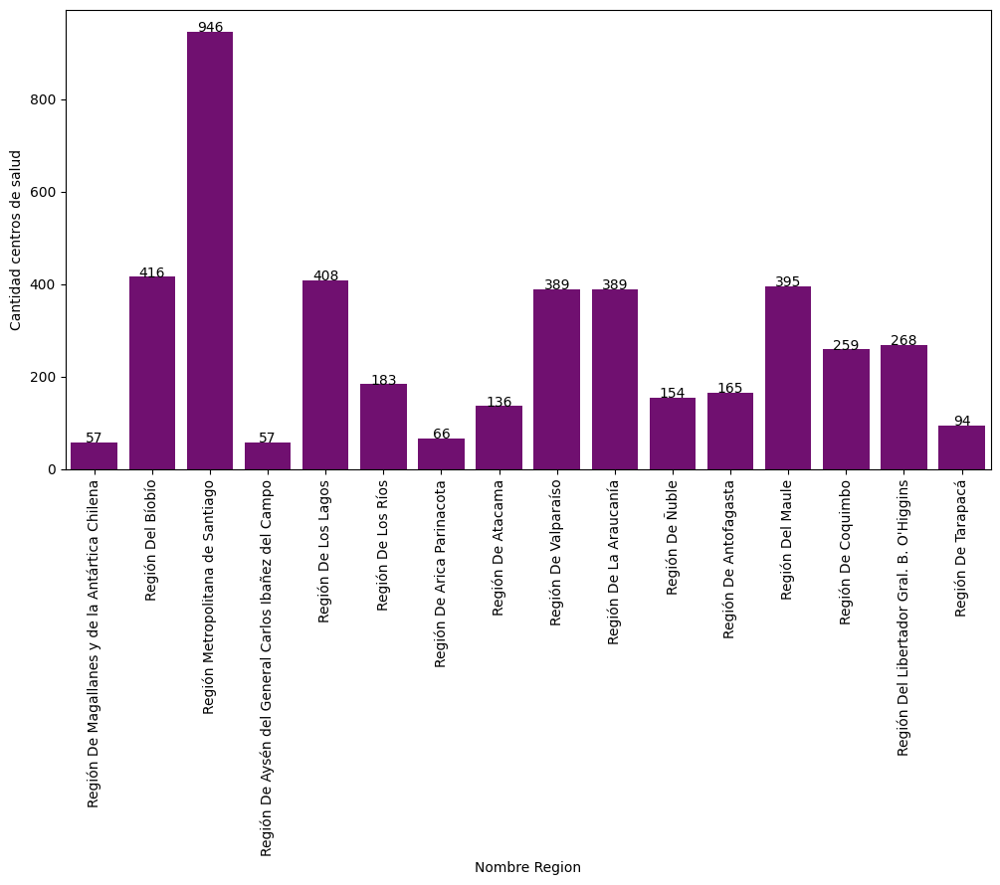

In [21]:

plt.figure(figsize=(12, 6))
ax = sns.countplot(x="nombre_región", data=df_hospitales_1, color = "purple")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.xlabel("Nombre Región")
plt.ylabel("Cantidad Centros de Salud")
plt.title("Centros de Salud por Región")
plt.show()

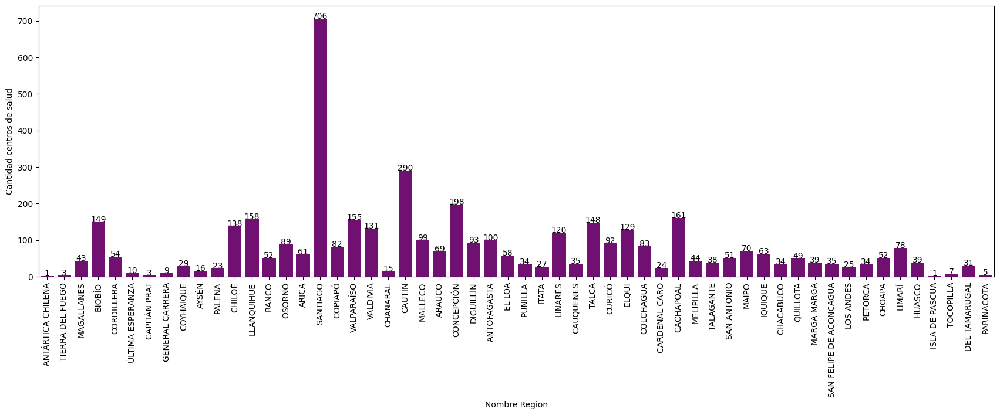

In [22]:
plt.figure(figsize=(21, 6))
ax = sns.countplot(x="nombre_provincia", data=df_hospitales_1, color = "purple")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.xlabel("Nombre Provincia")
plt.ylabel("Cantidad centros de salud")
plt.title("Centros de Salud por Provincia")
plt.show()

La imagen anterior es un gráfico de la cantidad de centros de salud por provincia, se escoge el gráfico de barras puesto que permite la comparacion clara entre cada localidad.

Para realizar una visualización particular de la cantidad de centros por cada comuna en su región respectiva se escoge el grafico de barras puesto que permite la comparacion clara entre regiones en diferentes imágenes

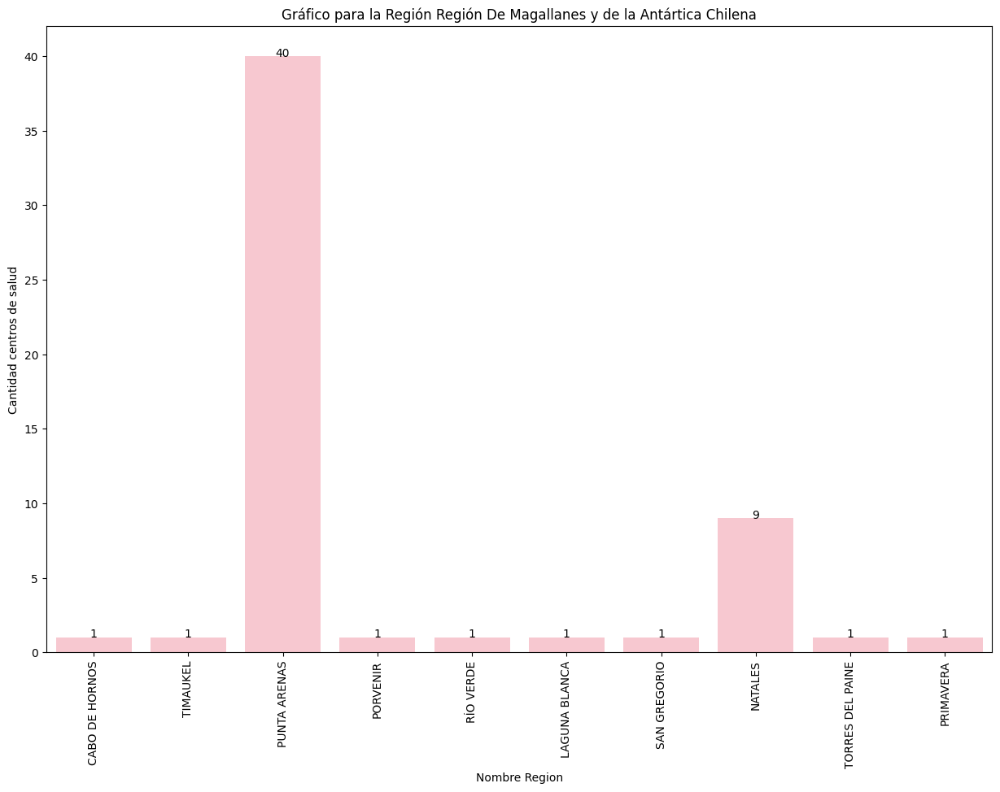

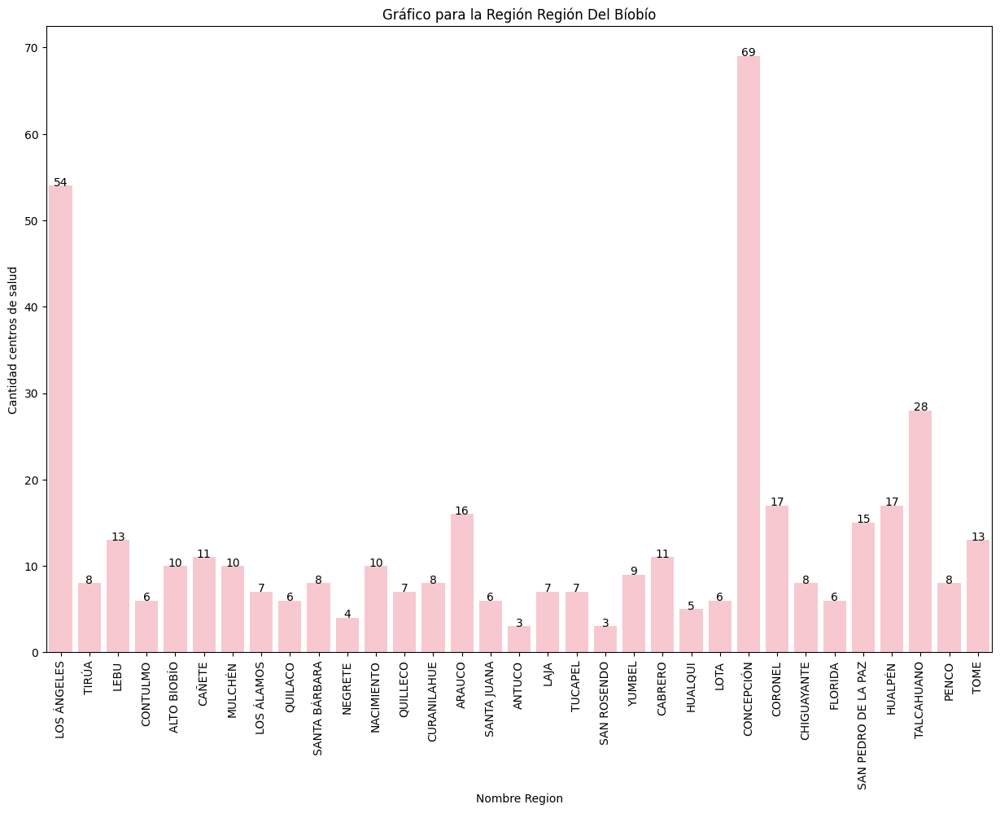

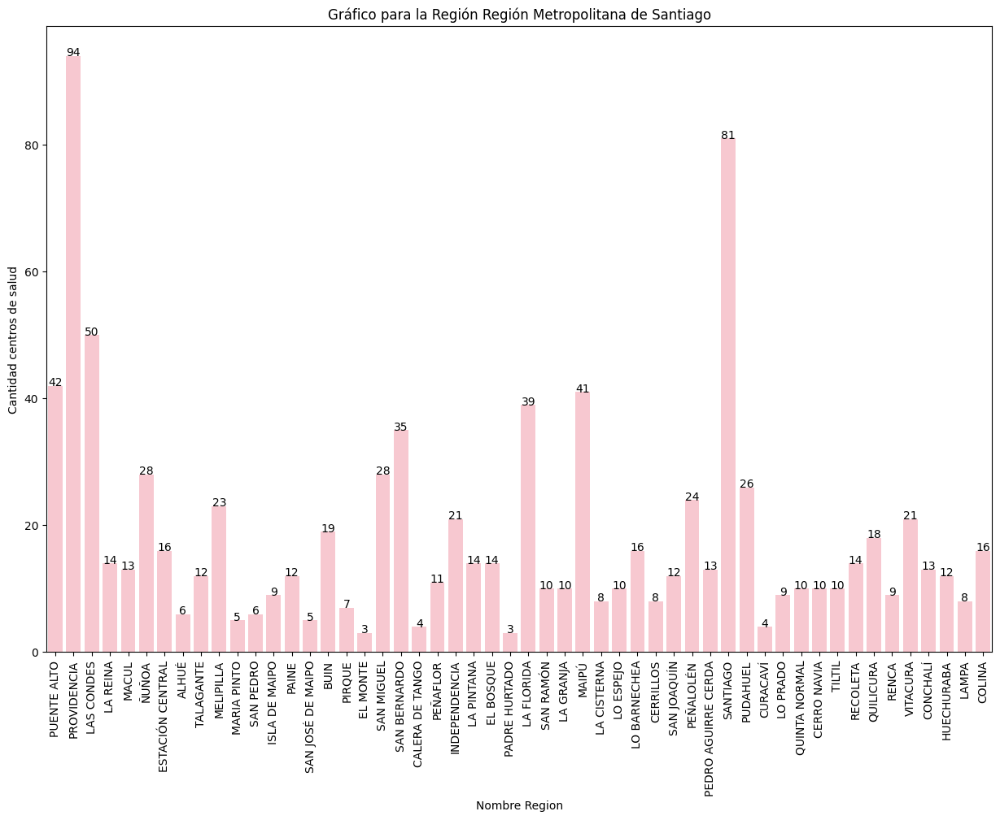

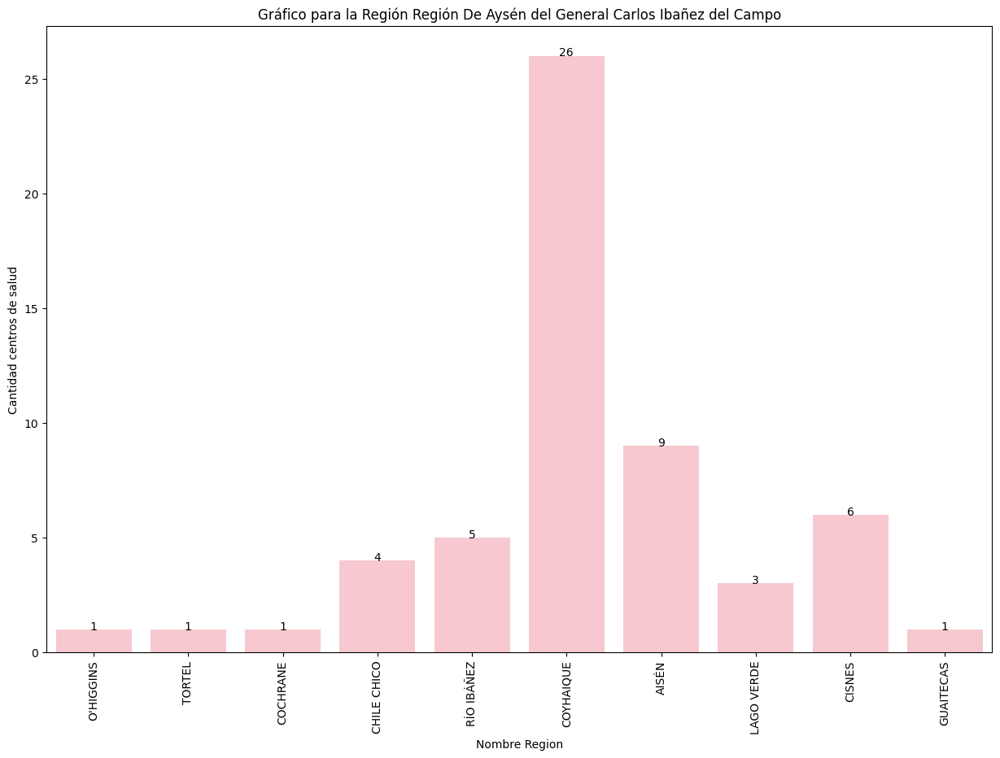

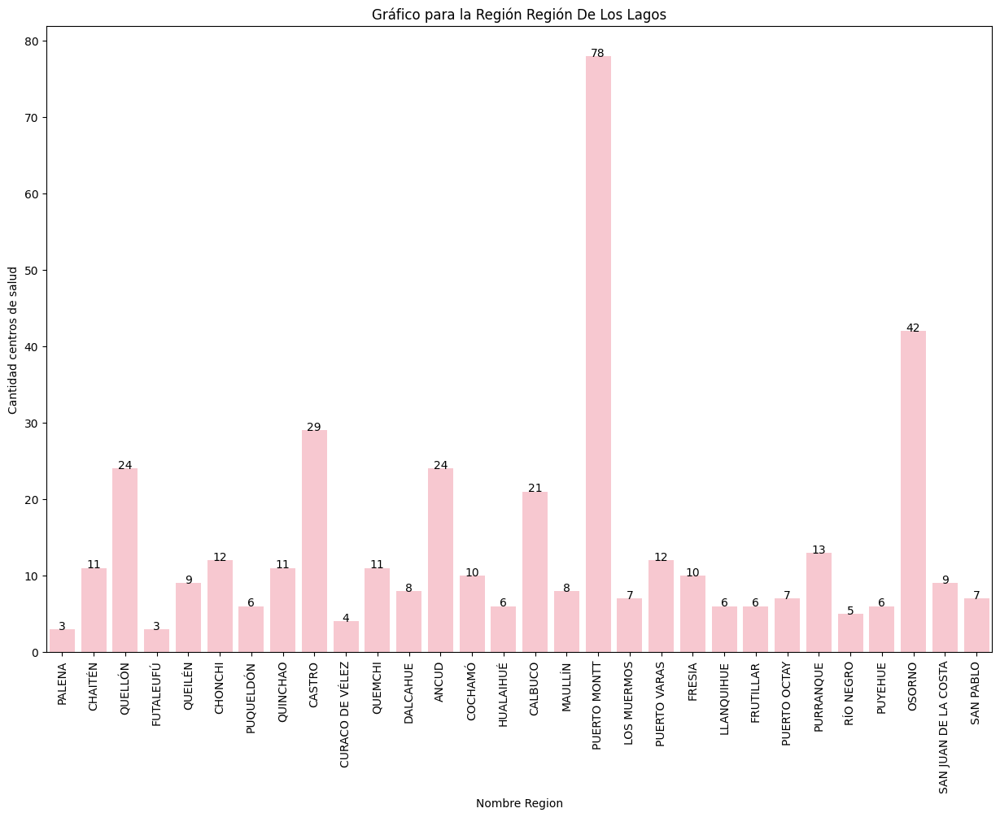

...

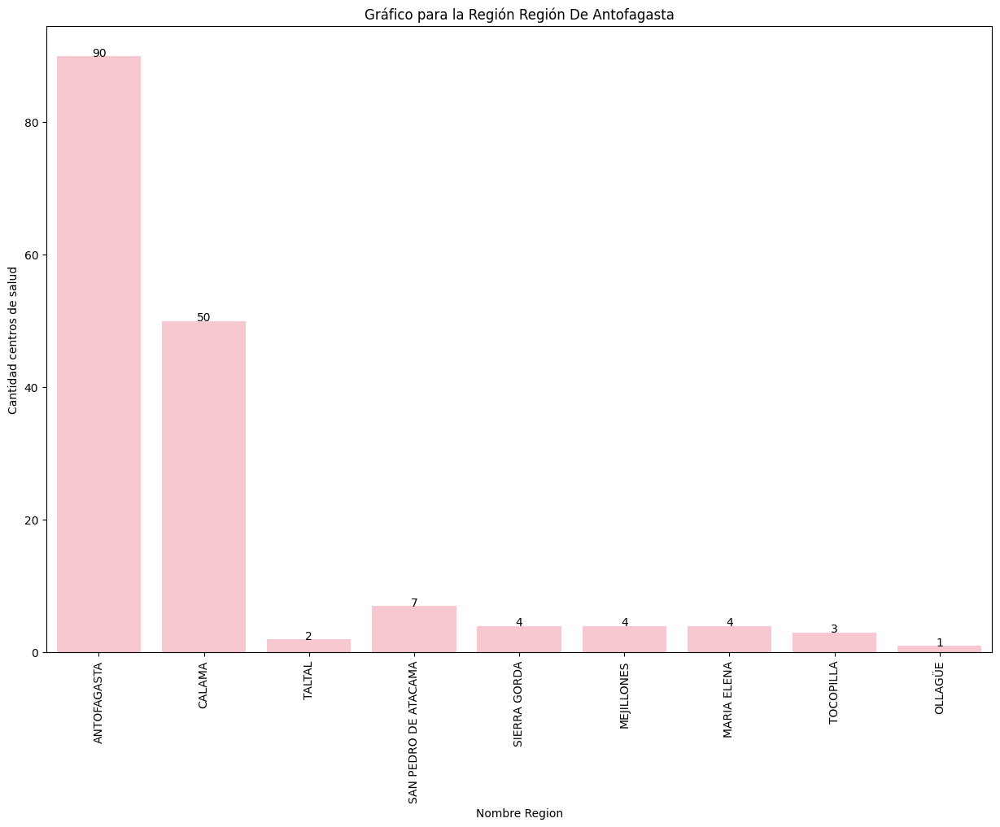

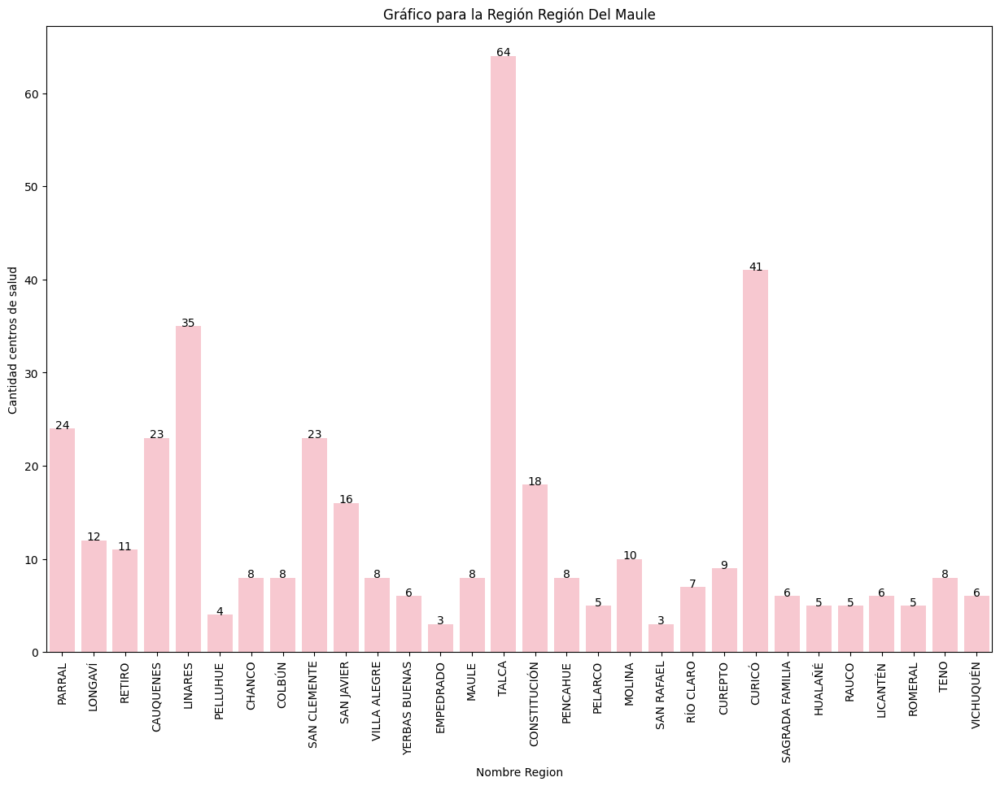

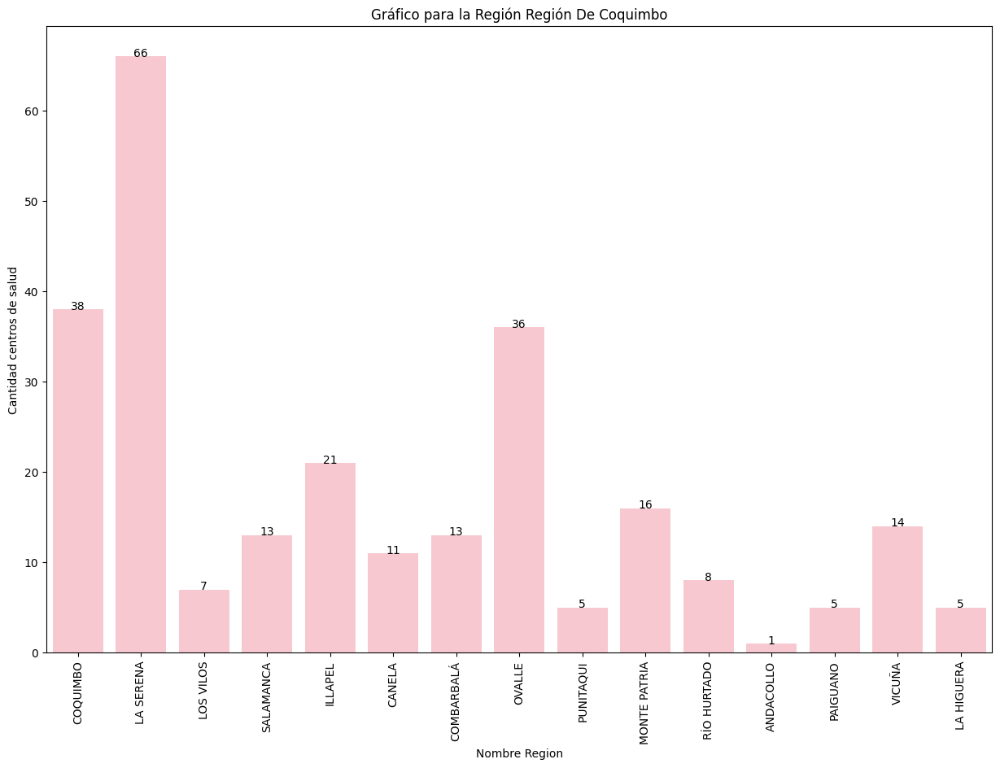

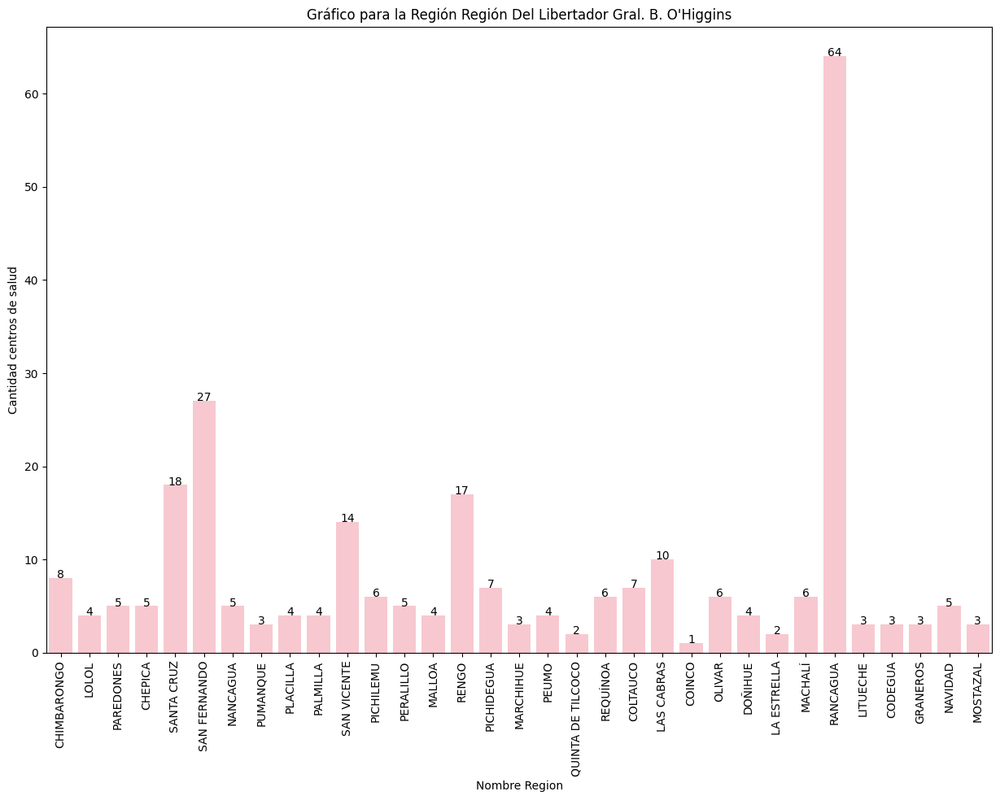

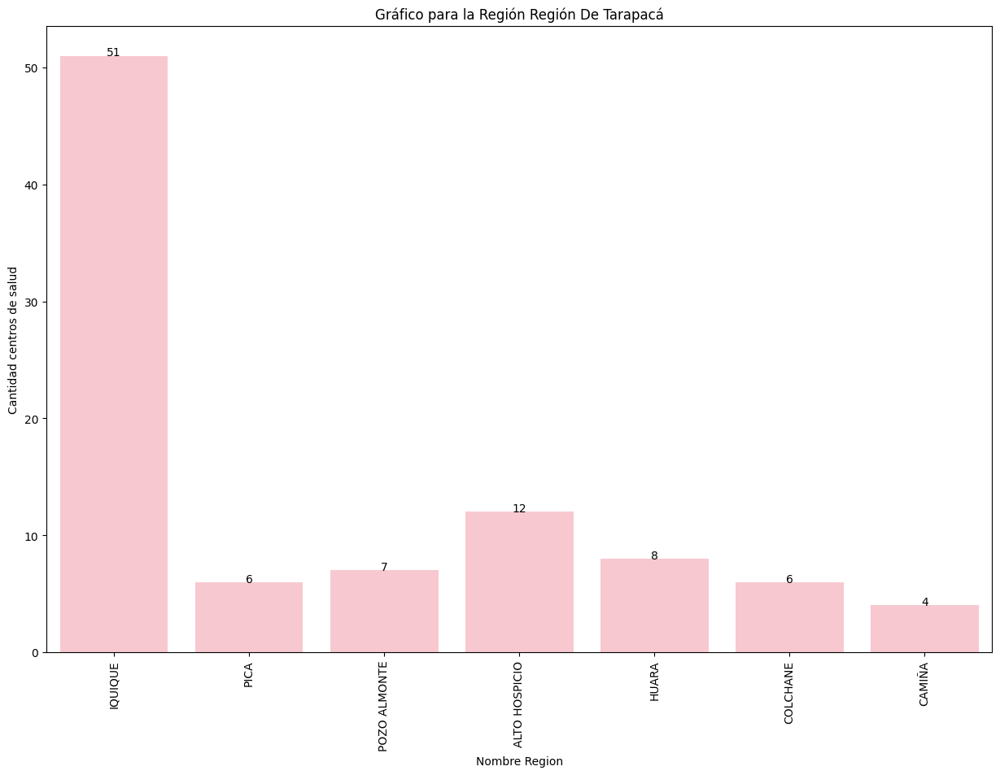

In [23]:
regiones_unicas = df_hospitales_1['nombre_región'].unique() # Todas la regiones de chile sin repetición 



for i, region in enumerate(regiones_unicas, 1): # for por cada region
    plt.figure(figsize=(15, 10))
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales_1[df_hospitales_1['nombre_región'] == region],color = "pink") # Gráfico
    
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline') 
        # Agrega la cantidad en el punto medio de la barra
    plt.title(f'Gráfico para la {region}')
    plt.xticks(rotation=90)
    plt.xlabel("Nombre Region")
    plt.ylabel("Cantidad centros de salud")
    plt.show()


#### Relacion entre poblacion y cantidad de hospitales

In [24]:
df_hospitales_poblacion_comuna = pd.merge(on="código_comuna", left=df_hospitales_1, right=df_poblacion_por_comuna[["código_comuna", "total"]], how="right")
conteo = df_hospitales_poblacion_comuna['código_comuna'].value_counts()
df_hospitales_poblacion_comuna['hospitales_x_comuna'] = df_hospitales_poblacion_comuna['código_comuna'].map(conteo)
df_hospitales_poblacion_comuna.drop_duplicates(subset="código_comuna", inplace=True)


Juntamos el dataframe de los hospitales y la poblacion por comuna segun el codigo comuna, ademas se hace el value count para ver cuantas veces se repite el codigo comuna en el dataframe, puesto que cada vez que se repite es un centro de salud, luego esta informacion se agrega en "Hospitales_x_comuna", y borro los duplicados pues solo quiero que el dataframe tengan la cantidad de poblacion y cantidad de centros de salud por comuna

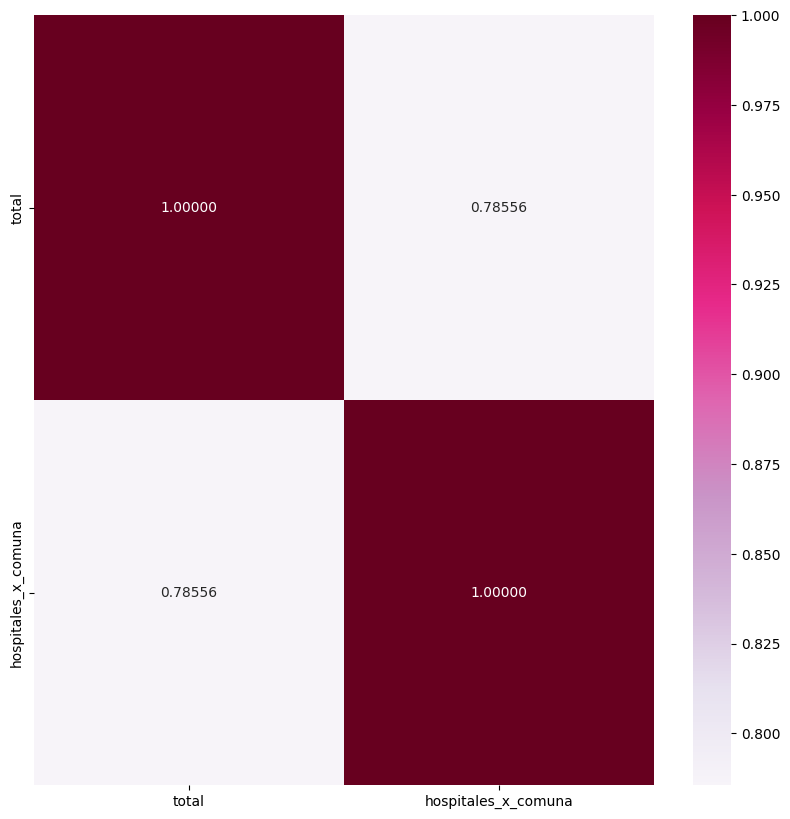

In [25]:
plt.figure(figsize=(10, 10))

correlation_matrix = df_hospitales_poblacion_comuna[["total", "hospitales_x_comuna"]].corr().round(5)

sns.heatmap(correlation_matrix, annot=True,  fmt=".5f", cmap="PuRd")

plt.show()

Se hace la matriz de correlacion entre el total de habitantes y la cantidad de centros de salud, y se ve una relacion importante entre estas dos variables puesto que es del 0.78. Esto permite elaborar de forma general que la cantidad de centros tendería a aumentar con el total de habitantes. Por lo que, debería de analizarse la existencia de más centros en pro de cubrir una mayor demanda de salud por parte de más ciudadanos. También podría realizarse un aumento en la capacidad de los establecimientos de las localidades.
Es relevante destacar que si bien esta operación permite dar luces de cómo funciona esta relación y cuán alta es , no significa que haya una causalidad necesaria entre ambas.

#### Análisis de Regresión

De forma consiguiente a los resultados de la matriz de correlación se realizará una regresion lineal simple puesto que solo son dos variables y queremos ver la relacion entre ellas, la variable independiente es el total de habitantes y la variable dependiente es la cantidad de centros de salud.

Esta regresión se realiza con sklearn, por lo que primeramente se debe cargar desde la libreria los métodos específicos. Luego se debe hacer un "reshape" de los datos, para que estén en el formato correcto del modelo. 

In [26]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df_hospitales_poblacion_comuna, test_size=0.25, random_state=2)
y_train = np.array(train['hospitales_x_comuna'])
y_test = np.array(test['hospitales_x_comuna'])

X_train = np.array(train['total'])
X_train = X_train.reshape(X_train.shape[0], 1)

X_test = np.array(test['total'])
X_test = X_test.reshape(X_test.shape[0], 1)

# realizar modelo
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

Se ven las metricas de evaluación del modelo, siendo ellos r^2 y el error cuadrático medio

In [27]:
y_pred_train = linreg.predict(X_train)
r2_lineal_train = linreg.score(X_train, y_train)
rmse_train = mean_squared_error(y_train, y_pred_train)

print('\nMétricas de Entrenamiento')
print(f'r^2 : {r2_lineal_train}')
print(f'RMSE {rmse_train}')
print(f'Coeficientes: {linreg.coef_[0], linreg.intercept_}')

#predecir valores de y para el set de prueba
y_pred_test = linreg.predict(X_test)
r2_lineal_test = linreg.score(X_test, y_test)
rmse_test = mean_squared_error(y_test, y_pred_test)

print('\nMétricas de Prueba')
print(f'r^2 : {r2_lineal_test}')
print(f'RMSE {rmse_test}')


Métricas de Entrenamiento
r^2 : 0.639641285766418
RMSE 91.7316069668962
Coeficientes: (0.0001607904136724008, 4.481244062907976)

Métricas de Prueba
r^2 : 0.5177551943968883
RMSE 88.83409328126801



- El r^2 es el coeficiente de correlacion y mientras más alto mejor
- El RMSE mide el error cuadratico medio de la prediccion y mientras más bajo mejor

Por lo tanto, en el caso de las métricas en el entrenamiento se puede decir que el r^2 no es el ideal pero no está bajo de 0.5 por lo que no es realmente un tan mal ajuste.
En la métrica de prueba, este valor valor disminuye. Mostrando que la relación lineal entre ambos no tendería a tener un ajuste bueno.

In [ ]:
# REVISAR Por otro lado, baja el error cuadrático médio en los datos de prueba respecto de los de entrenamiento

Se grafican puntos que representan cada comuna de Chile, la x es la población e y es la cantidad de centros de salud. Además se grafica la línea de la regresión antes calculada, los puntos que estan muy por debajo, se les muestra el nombre pues son comunas que se desvían en una gran medida y es una manera de detectar si una comuna puede tener falta de centros de salud.

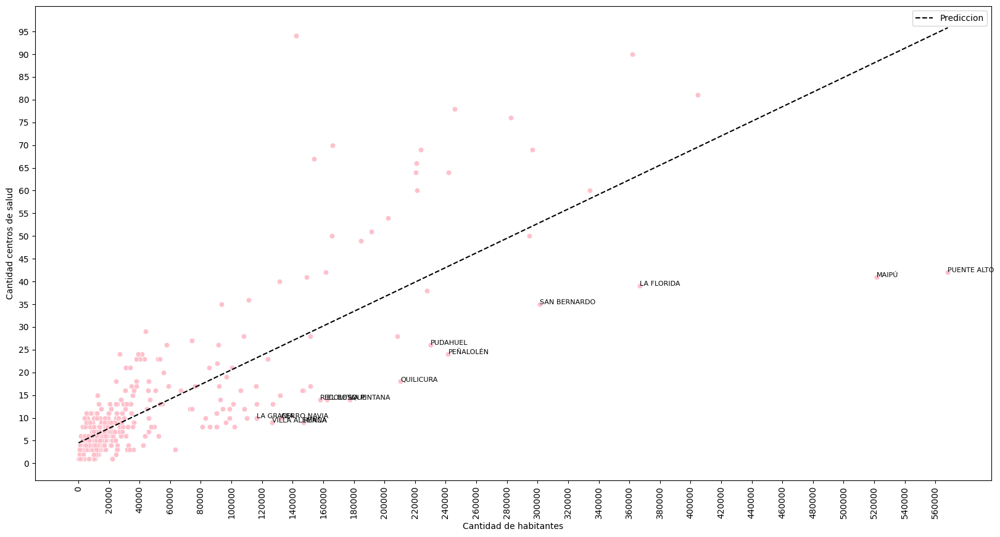

In [28]:
plt.figure(figsize=(20, 10))
ax = sns.scatterplot(x=df_hospitales_poblacion_comuna["total"], y=df_hospitales_poblacion_comuna["hospitales_x_comuna"])

sns.scatterplot(x = "total", y = "hospitales_x_comuna", data=df_hospitales_poblacion_comuna,color = "pink")
xgrid = np.linspace(np.min(train['total']), np.max(train['total']), 100)
ax.plot(xgrid, linreg.predict(xgrid.reshape(100, 1)), label='Prediccion', color='k', ls='--')
distancia = 13

for i, txt in enumerate(df_hospitales_poblacion_comuna["nombre_comuna"].unique()):
    m = linreg.coef_[0]
    b = linreg.intercept_

    d = -1*(-m * df_hospitales_poblacion_comuna["total"].iloc[i] + 1 * df_hospitales_poblacion_comuna["hospitales_x_comuna"].iloc[i] - b) / np.sqrt((-m)**2 + 1**2)

    if d > distancia:
        ax.annotate(txt, (df_hospitales_poblacion_comuna["total"].iloc[i], df_hospitales_poblacion_comuna["hospitales_x_comuna"].iloc[i]), fontsize=8)


plt.yticks(range(0, max(df_hospitales_poblacion_comuna["hospitales_x_comuna"]) + 5, 5))
plt.xticks(range(0, max(df_hospitales_poblacion_comuna["total"]) + 10_000, 20_000), rotation=90)

plt.xticks(rotation=90)
plt.xlabel("Cantidad de habitantes")
plt.ylabel("Cantidad centros de salud")
plt.title("Cantidad de centros de salud en función de los habitantes")
plt.legend() 
plt.show()


Se crea un dataframe de densidad que tiene la densidad de centros de salud por el total de habitantes

In [29]:
densidad = df_hospitales_poblacion_comuna
densidad["densidad_hospital_x_poblacion"] = densidad["hospitales_x_comuna"] / densidad["total"]


Se grafica la distribucion de la densidad centros de salud por cantidad de habitantes en cada region, se escoge el diagrama de cajon pues es un buen metodo para mostrar la distibucion de valores, muestra la media, cuartiles, minimos y maximos.

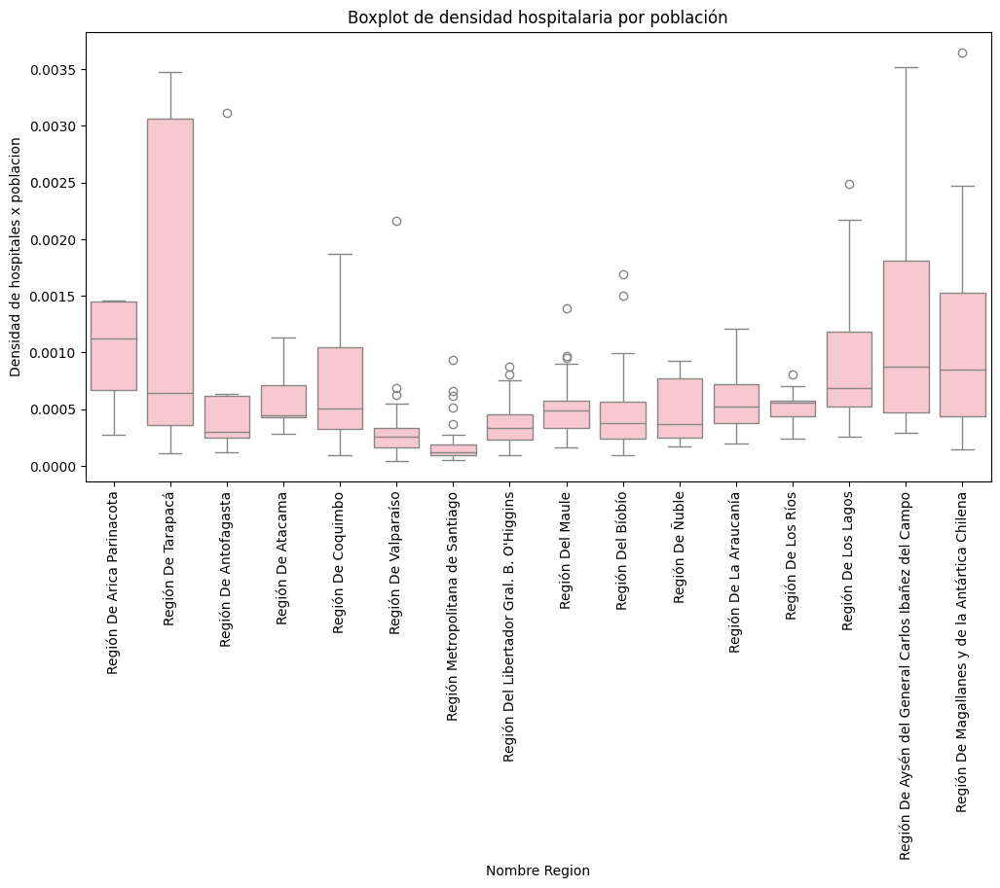

In [30]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="nombre_región", y="densidad_hospital_x_poblacion", data=densidad, color = "pink")
plt.title("Boxplot de densidad hospitalaria por población")
plt.xticks(rotation=90)
plt.xlabel("Nombre Región")
plt.ylabel("Densidad de hospitales x población")
plt.show()

Se puede observar que esta densidad no es una medida representativa pues hay comunas grandes como en la region de Tarapaca que aunque tengan 1000 habitantes tienen 6 centros de salud. Debido a que estos habitantes estan muy dispersos, lo que hace que la medida no sea confiable.

Se carga el mapa de las comunas de Chile y se hace un merge (juntar) entre densidad y el mapa, luego se normaliza la cantidad de habitantes y los centros de salud por comuna. Esto con el fin de graficar los mapas mostrando con un mapa calor cómo se distribuye la población y la cantidad de centros de salud por región, así visualizar la relación entre población y cantidad de habitantes con mapasw.

In [31]:
gdf = gpd.read_file('./maps/Comunas.zip')
gdf = pd.merge(left=gdf, right=densidad, left_on="cod_comuna", right_on="código_comuna")
gdf = gdf[(gdf["cod_comuna"] != 5201) & (gdf["cod_comuna"] != 5104)]

scaler = MinMaxScaler()
gdf["total_n"] = scaler.fit_transform(gdf[['total']])
gdf["hospitales_x_comuna_n"] = scaler.fit_transform(gdf[['hospitales_x_comuna']])


In [76]:
gdf = gpd.read_file('./maps/Comunas.zip') # Geodataframe de los mapas

In [77]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 346 entries, 0 to 345
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   objectid    346 non-null    int64   
 1   shape_leng  346 non-null    float64 
 2   dis_elec    346 non-null    int64   
 3   cir_sena    346 non-null    int64   
 4   cod_comuna  346 non-null    int64   
 5   codregion   346 non-null    int64   
 6   st_area_sh  346 non-null    float64 
 7   st_length_  346 non-null    float64 
 8   Region      346 non-null    object  
 9   Comuna      346 non-null    object  
 10  Provincia   346 non-null    object  
 11  geometry    346 non-null    geometry
dtypes: float64(3), geometry(1), int64(5), object(3)
memory usage: 32.6+ KB


In [78]:
gdf.columns

Index(['objectid', 'shape_leng', 'dis_elec', 'cir_sena', 'cod_comuna',
       'codregion', 'st_area_sh', 'st_length_', 'Region', 'Comuna',
       'Provincia', 'geometry'],
      dtype='object')

In [32]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 343 entries, 0 to 344
Data columns (total 38 columns):
 #   Column                                                      Non-Null Count  Dtype   
---  ------                                                      --------------  -----   
 0   objectid                                                    343 non-null    int64   
 1   shape_leng                                                  343 non-null    float64 
 2   dis_elec                                                    343 non-null    int64   
 3   cir_sena                                                    343 non-null    int64   
 4   cod_comuna                                                  343 non-null    int64   
 5   codregion                                                   343 non-null    int64   
 6   st_area_sh                                                  343 non-null    float64 
 7   st_length_                                                  343 non-null    f

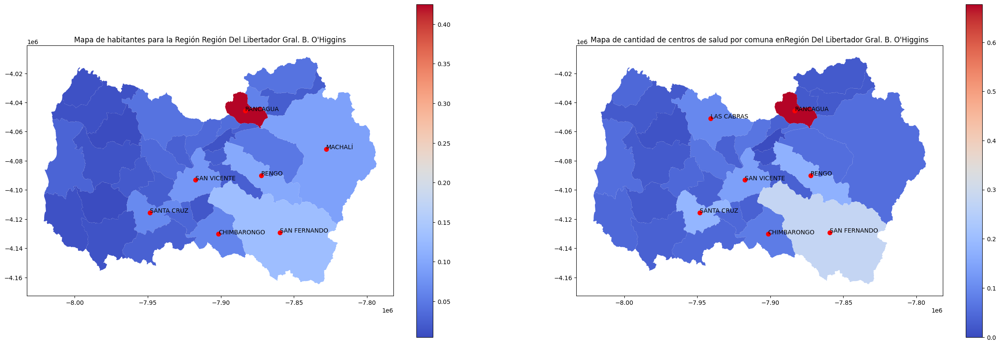

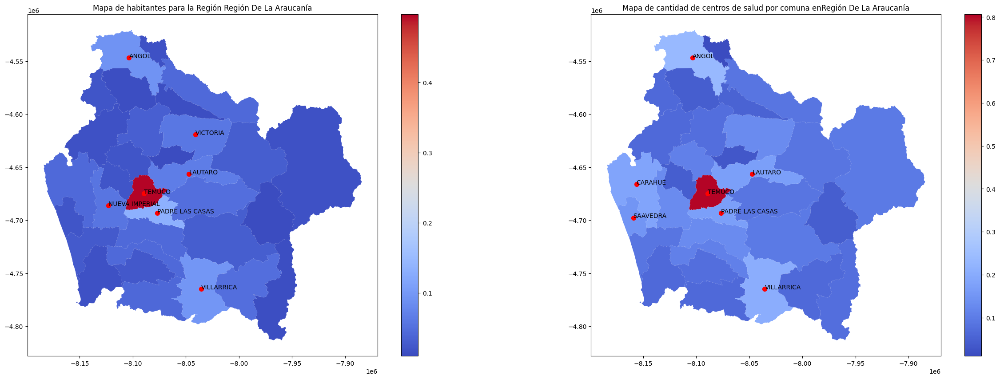

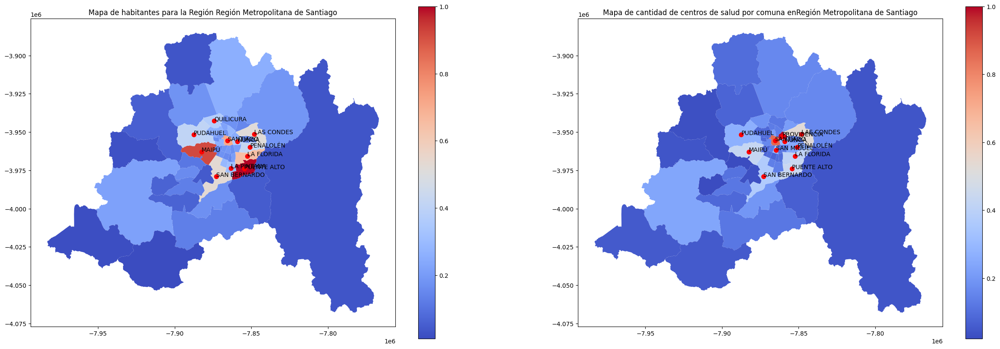

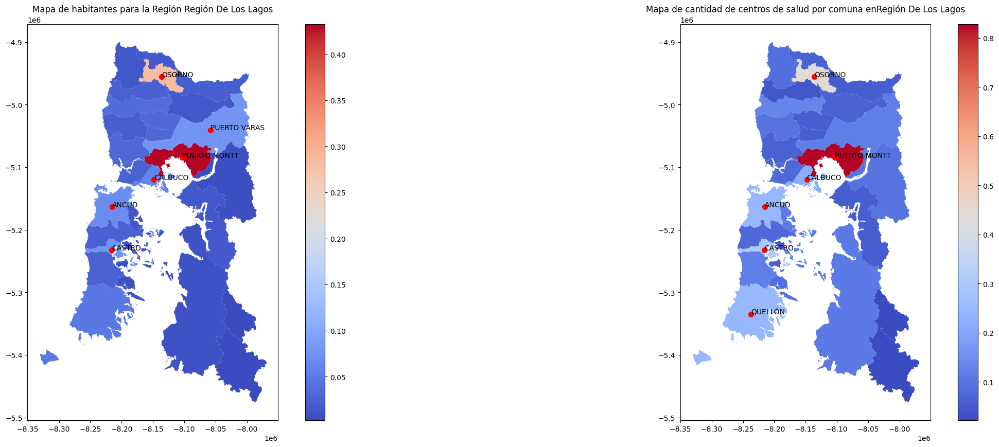

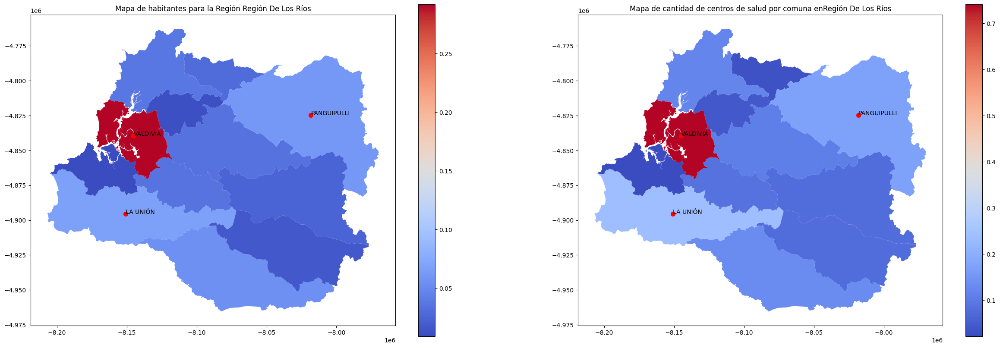

...

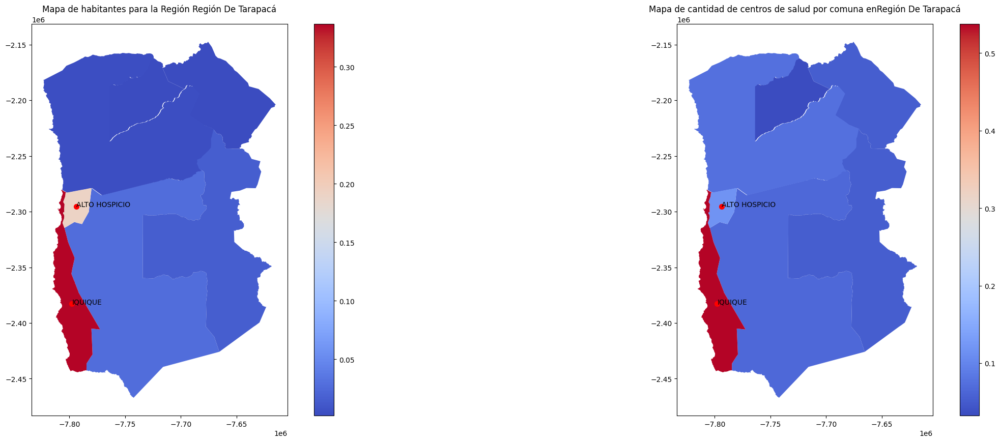

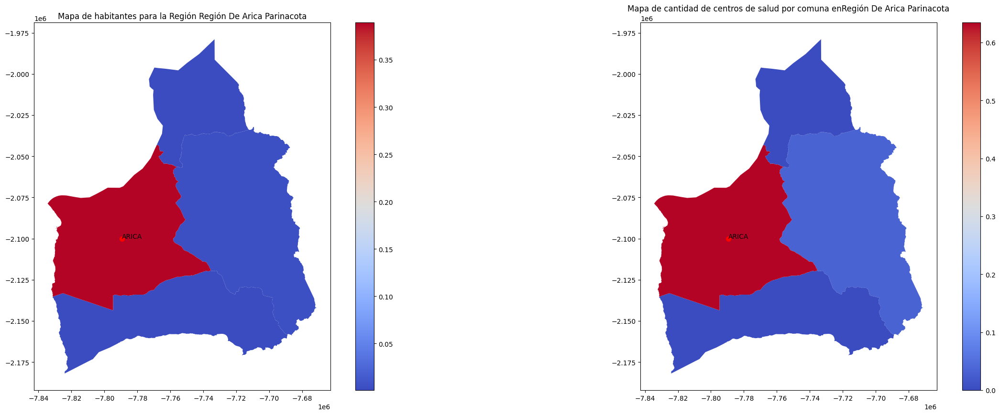

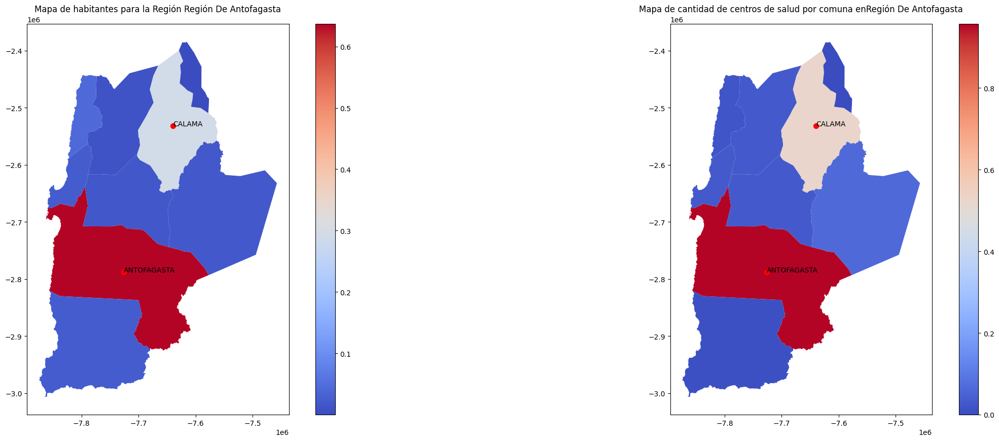

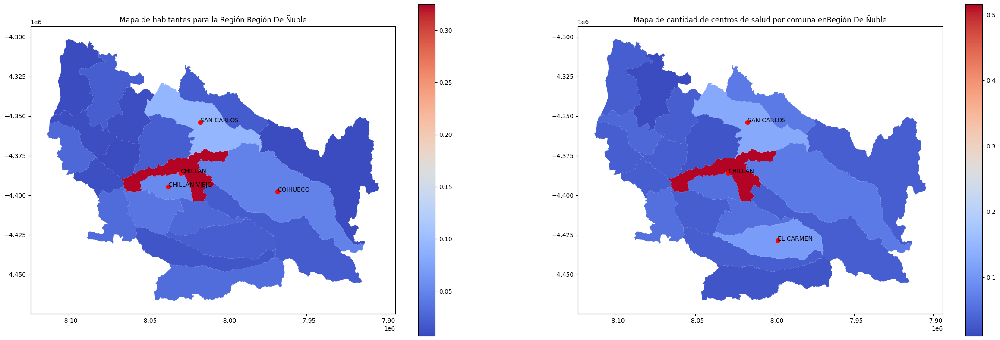

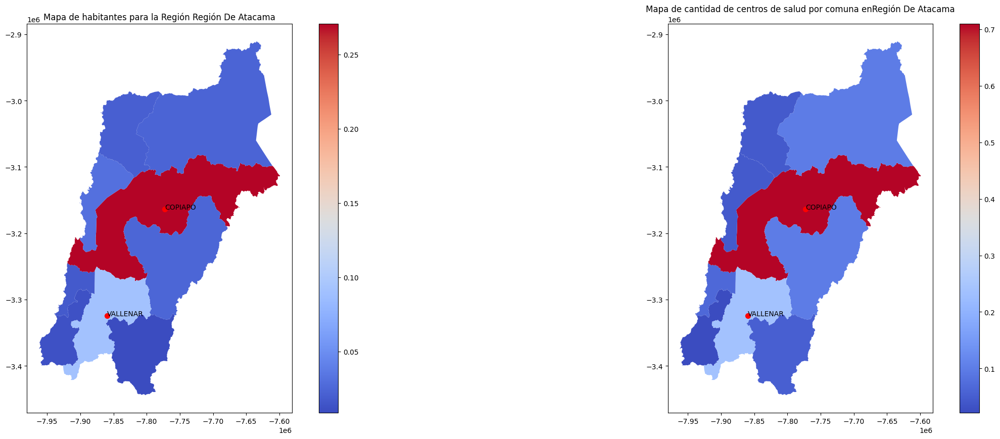

In [33]:
regiones = gdf["nombre_región"].unique()
var_habitantes_totales = "total_n"
var_hospitales_por_comuna = "hospitales_x_comuna_n"
for region in regiones:
    gdf_region = gdf[gdf["nombre_región"] == region]
    
    fig, axs = plt.subplots(1, 2, figsize=(30, 10))

    gdf_region.plot(column=var_habitantes_totales, cmap='coolwarm', legend=True, ax=axs[0])
    
    q_densidad_poblacion = gdf_region[var_habitantes_totales].quantile(0.8)
    gdf_region_filtrada_densidad = gdf_region[gdf_region[var_habitantes_totales] > q_densidad_poblacion]

    #################################################################################################
    #Se usa chatgpt para poner los nombres de las comunas
    for idx, row in gdf_region_filtrada_densidad.iterrows():
        axs[0].scatter(row.geometry.centroid.x, row.geometry.centroid.y, color='red', s=50) 
        axs[0].annotate(text=row["nombre_comuna"], xy=(row.geometry.centroid.x, row.geometry.centroid.y), color='black')

    axs[0].set_title(f'Mapa de habitantes para la Región {region}')


    ####################################################################################################
    
    gdf_region.plot(column=var_hospitales_por_comuna, cmap='coolwarm', legend=True, ax=axs[1])
    
    q_densidad_hospitales = gdf_region[var_hospitales_por_comuna].quantile(0.8)
    gdf_region_filtrada_hospitales = gdf_region[gdf_region[var_hospitales_por_comuna] > q_densidad_hospitales]

    for idx, row in gdf_region_filtrada_hospitales.iterrows():
        axs[1].scatter(row.geometry.centroid.x, row.geometry.centroid.y, color='red', s=50) 
        axs[1].annotate(text=row["nombre_comuna"], xy=(row.geometry.centroid.x, row.geometry.centroid.y), color='black')

    axs[1].set_title(f'Mapa de cantidad de centros de salud por comuna en{region}')

    plt.show()

En la exploracion de datos se observa que en Chile existen 4382 centros de salud, de los cuales la mayor parte se concentran en la región metropolitana y que solo existe un comuna en todo Chile sin centros de salud que es la Antártica (dentro de los filtros aplicados).

En los mapas de cantidad de hospitales y cantidad de habitantes se puede ver que existe un relacion fuerte entre estas dos variables, siendo esta de 0.79, aunque es importante destacar que si se hace la relacion por densidad como hospitales por habitantes, se dan numeros anómalos pues hay comunas con 6 centros de salud y 1000 habitantes. Lo anterior sucede debido a que en el presente proyecto no se está tomando en consideración el número de camas.Por lo que, cada centro de salud vale por igual.
También se puede visualizar una especie de concentración de los centros de salud en comunas específicas en cada región.

### Pregunta 02: ¿Hay alguna comuna y/o región que no tenga un establecimientos de todos los tipos de complejidad y tipo de urgencia?

Dentro del análisis de los datos es que se hace relevante tener en cuenta las siguientes definiciones y clasificaciones de los centros médicos.UEH)
   

1. Niveles de complejidad : "Complejidad depende de la actividad de una unidad asistencial, en térmono del número de  procedimiento complejos, grado de desarrollo alcanzado por la misma,  disponibilidad de recurso humano y grado de especialización, equipamiento y horario de atención" (Definición extraída desde el mismo archivo excel original).

2. Tipos de urgencia: Es dato que especifica el tipo de servicio de urgencia en la Red Asistencial

   -  Ambulatoria (SAPU)
   -  Ambulatoria (SAR)
   -  Ambulatoria (SUR)
   -  Ambulatoria (CEAR)
   -  Urgencia Ambulatoria Privada
   -  Urgencia Ambulatoria Especializada
   -  Urgencia Hospitalaria Especializada
   -  Hospitalaria  (UEH)
   

Para mostrar la distribución de servicios de salud según su categorización en nivel de complejidad, es que se utiliza un gráfico de barras. Debido a que permite visualizar de forma individual cada categoría y su cantidad respectiva asociada al eje y. De la misma forma, facilita el trabajo al utilizar el parámetro hue y separar cada nivel con un color diferente.

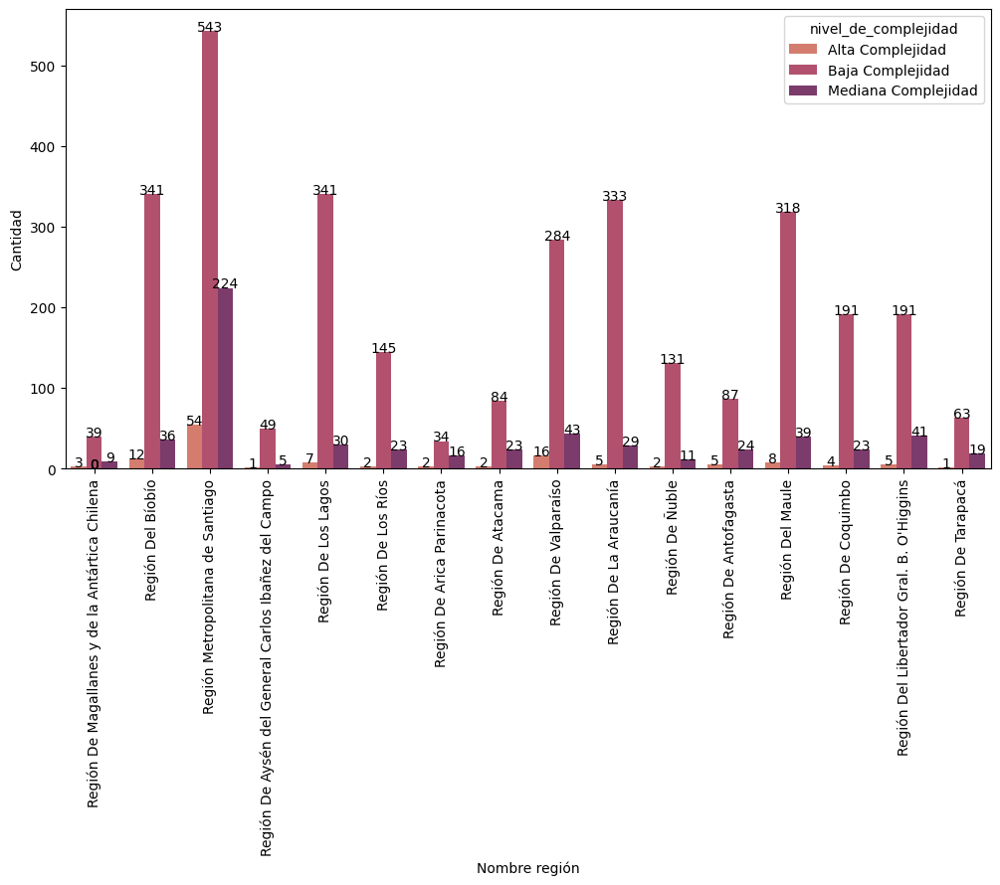

In [35]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(x="nombre_región", data=df_hospitales, hue="nivel_de_complejidad", palette="flare")
for p in ax.patches:  #Iteración para anotar la cantidad en cada barra individual
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90) #Rotación de las etiquetas en el eje x 
plt.xlabel("Nombre región")
plt.ylabel ("Cantidad")
plt.show()

In [36]:
df_hospitales_1.columns #Se visualizan las columnas

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia'],
      dtype='object', name=0)

Se crea un dataframe, por medio de un groupby para tener de forma compacta y sintética los valores de existencia de urgencias en cada comuna. 
La columna de "false" contabiliza aquellos centros que no tienen ningún tipo de urgencia y la de "true" los que sí. Sin embargo, se filtró para dejar solo los que tenían el valor en la variable true como 0. Para así sumar de forma más fácil.

In [540]:
urgencia_cantidad = df_hospitales_1.groupby("nombre_comuna")["tiene_servicio_de_urgencia"].value_counts().unstack(fill_value=0).reset_index()
nuevos_nombres = {columna: modificar_nombre_columna(str(columna)) for columna in urgencia_cantidad.columns} 
urgencia_cantidad.rename(columns=nuevos_nombres, inplace=True)
urgencia_cantidad[urgencia_cantidad["true"] == 0] #Filtro 


tiene_servicio_de_urgencia,nombre_comuna,false,true
23,CAMARONES,1,0
87,ERCILLA,6,0
97,GENERAL LAGOS,1,0
100,GUAITECAS,1,0
117,LA CRUZ,1,0
128,LAGO VERDE,3,0
129,LAGUNA BLANCA,1,0
153,LOS SAUCES,5,0
158,LUMACO,7,0
185,O'HIGGINS,1,0


Para saber el total de aquellos centros que no tienen urgencia es que se aplica la función de len (longitud) en la columna de true. 

In [537]:
len(urgencia_cantidad[urgencia_cantidad["true"] == 0]) # si agregamos la Antartica son 26

25

Lo anterior significa que hay 25 comunas sin ningún tipo de urgencia en sus centros de salud. Considerando que en el dataframe, no se consideraba la comuna de la Antártica, es que se contabiliza y analiza por separado. En esta tampoco habían urgencias por lo que en total son 26. 

Ahora se realizan un gráfico para conocer la distribución de los tipos de urgencia en las regiones de Chile. Se selecciona el gráfico de barra con líneas de división por región, para ver claramente cuál el la cantidad por cada uno. Además esta herramienta permite con el hue ver cada categoría con un color separado.

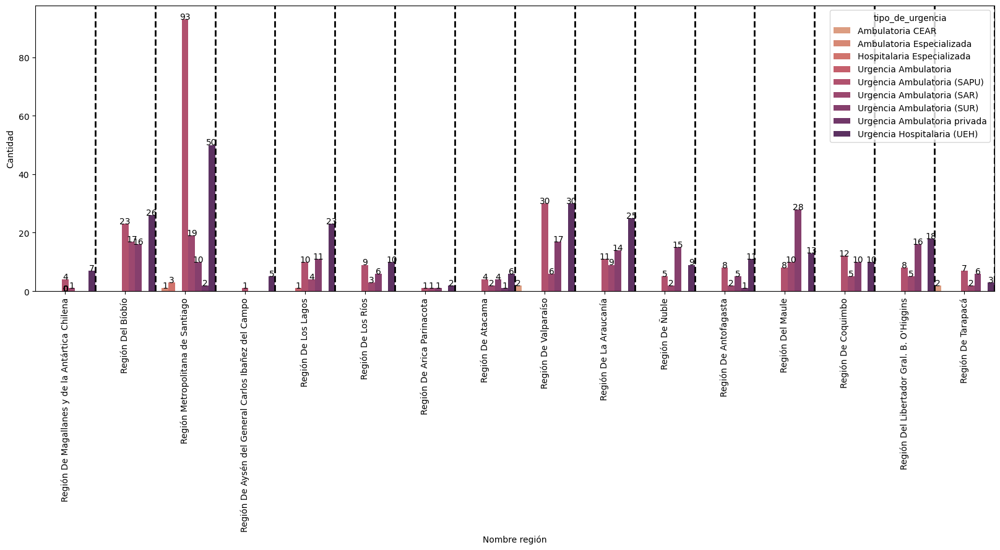

In [37]:
# Supongamos que tu DataFrame se llama 'df_hospitales'
plt.figure(figsize=(20, 6))

# Crear el gráfico de barras
ax = sns.countplot(x="nombre_región", data=df_hospitales, hue="tipo_de_urgencia", palette="flare", width=1)

for p in ax.patches: #Anotaciones por cada barra 
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
for x in range(len(df_hospitales['nombre_región'].unique())):
    plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2) # Líneas que dividen cada región
plt.xticks(rotation=90, ha="center")
plt.xlabel("Nombre región")
plt.ylabel ("Cantidad")
plt.show()

A continuación para visualizar de mejor forma la distirbución de los distintos tipos por comuna de cada región, es que se elaboran distintos gráficos de barra con una iteración permitiendo un análisis focalizado por cada uno , no dejando fuera ninguna localidad. Nuevamente se elije esta herramienta bajo la misma justificación pero también porque en este caso facilita separar las localidad anotando tanto región como comunas. 

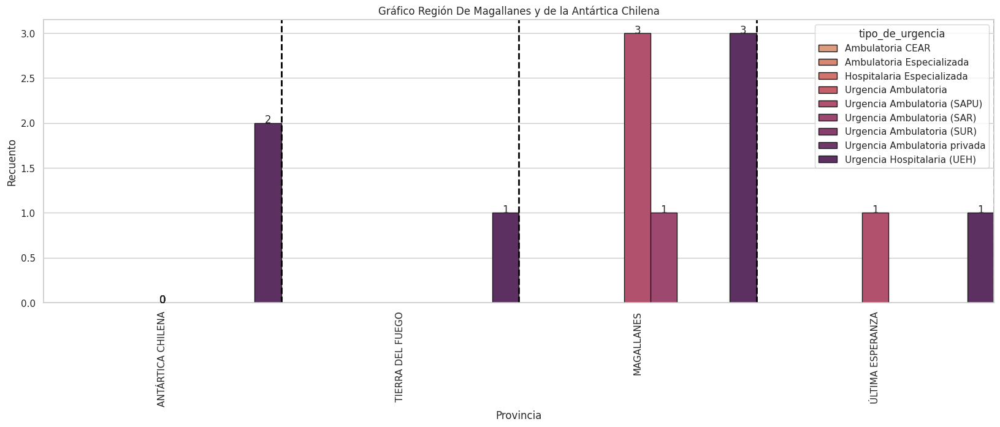

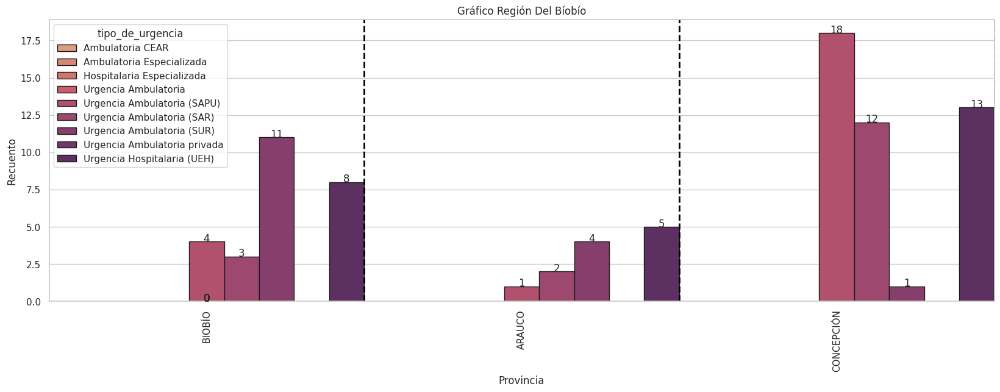

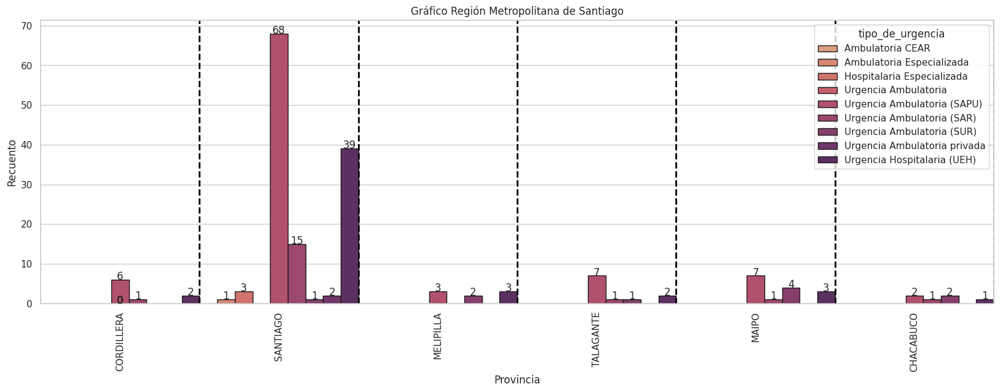

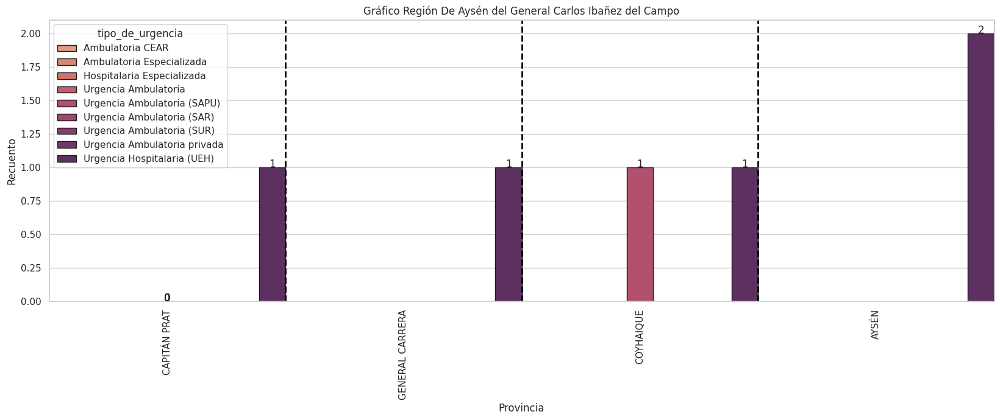

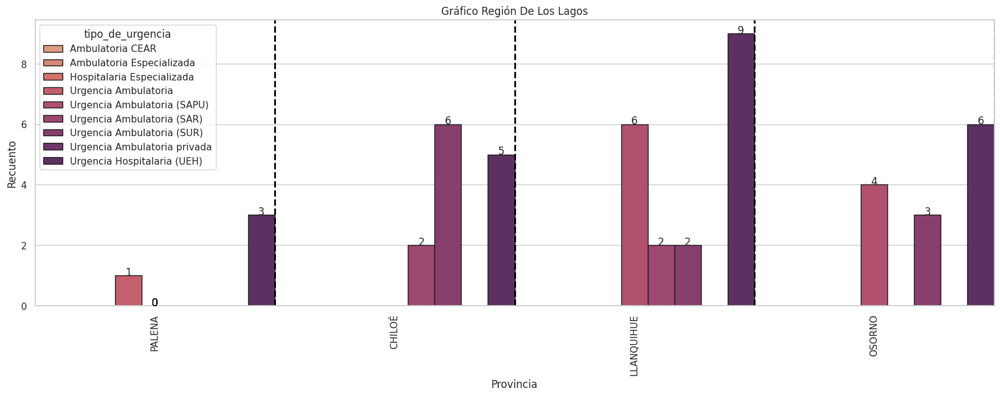

...

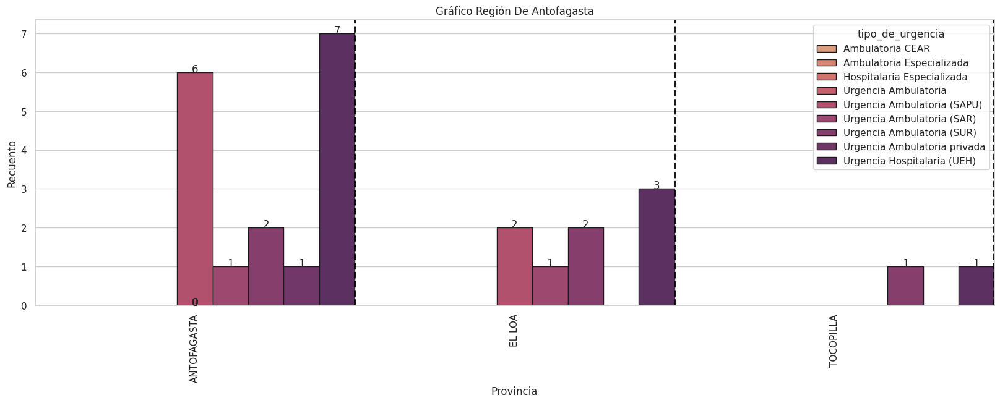

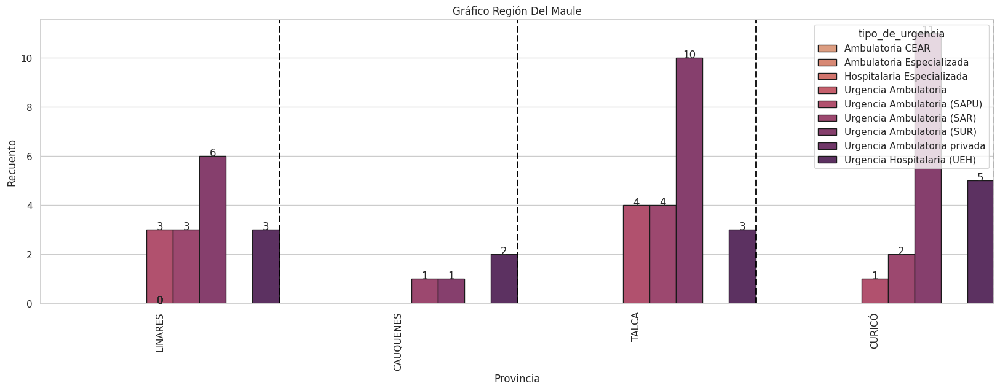

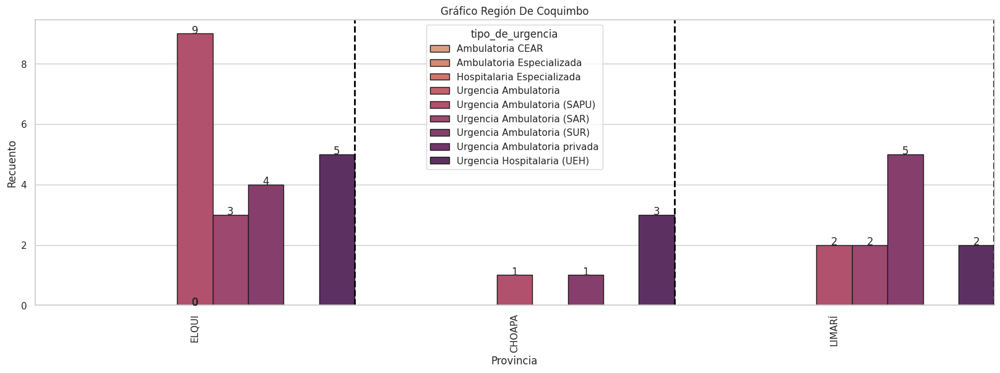

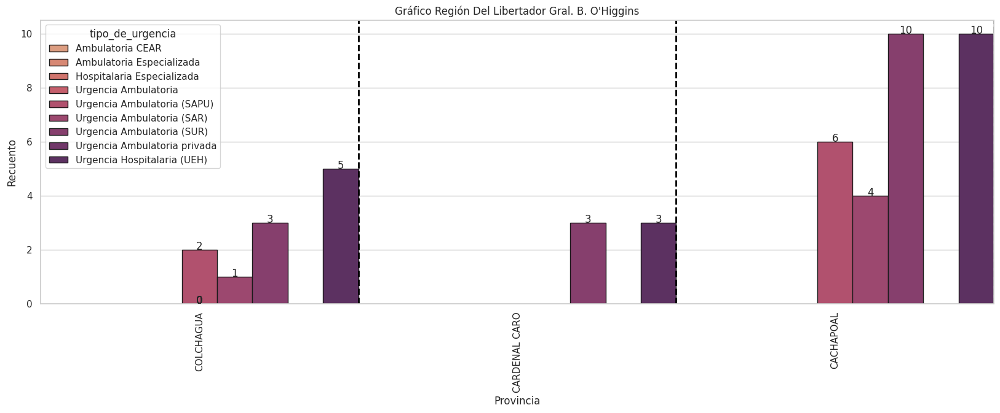

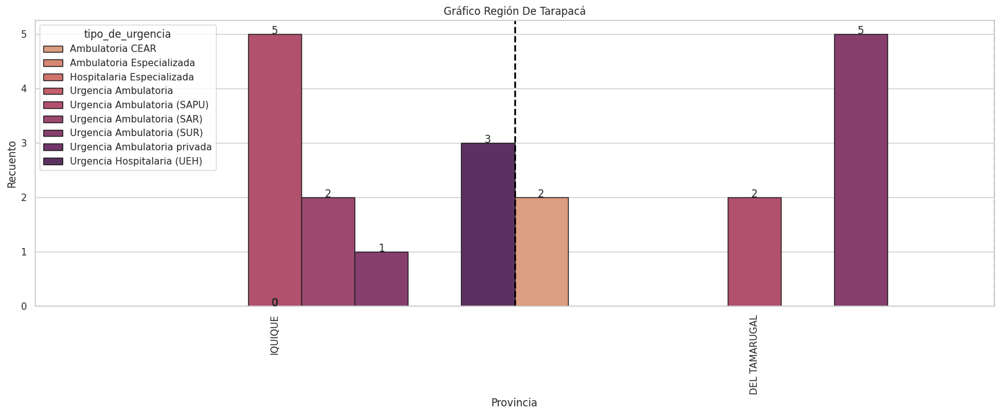

In [467]:

region_codes = df_hospitales["código_región"].unique() #Dataframe con las regiones únicas sin repetición

# Configura el estilo de seaborn y la grilla
sns.set(style="whitegrid")

# Itera sobre cada código de región 
for i in region_codes:
    # Filtra el DataFrame para el código de región actual y crea un dataframe 
    frame = df_hospitales[df_hospitales["código_región"] == i]
    
    # Crea un gráfico de barras
    plt.figure(figsize=(20, 6))
    ax = sns.countplot(x="nombre_provincia", data=frame, hue="tipo_de_urgencia", edgecolor="k", palette="flare", width=1)

    # Añade etiquetas a las barras individualmente 
    # Se utilizó chatgpt en la iteración del annotate (se repite este código en múltiples plots a lo largo del desarrollo, con distintas variables)
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')

    plt.title(f'Gráfico {frame["nombre_región"].unique()[0]}')
    plt.xlabel('Provincia')
    plt.ylabel('Recuento')
    plt.xticks(rotation=90, ha="center")

    for x in range(len(frame['nombre_provincia'].unique())): #Separa con líneas las comunas #Se utilizó chatgpt para esta iteración
        plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)

    plt.show()


<Figure size 2100x600 with 0 Axes>

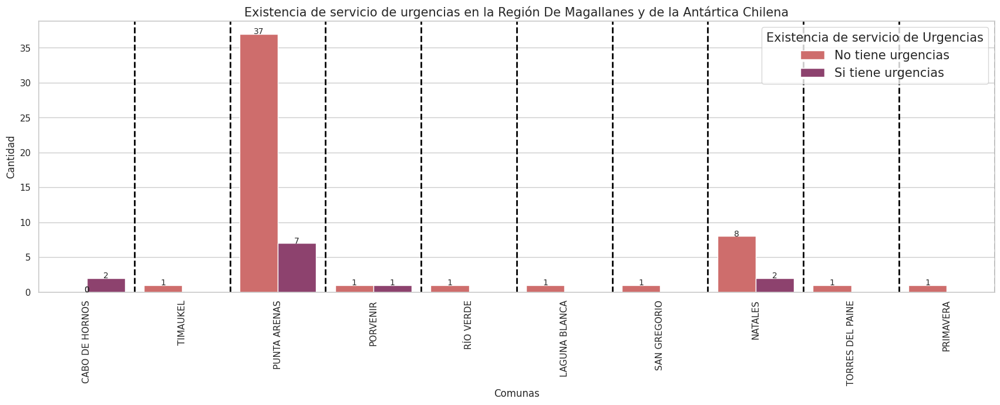

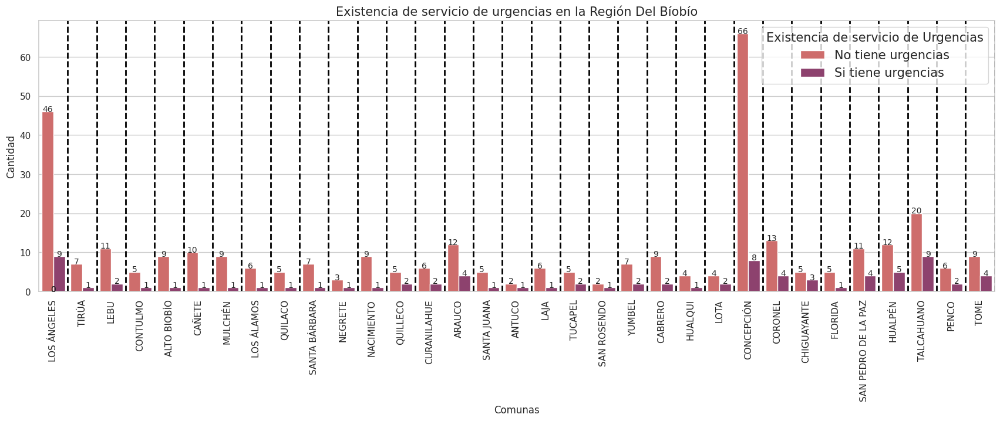

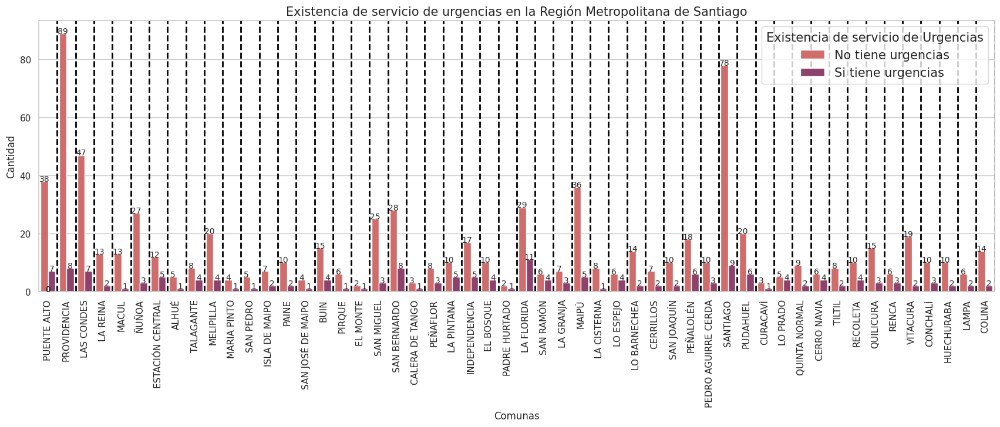

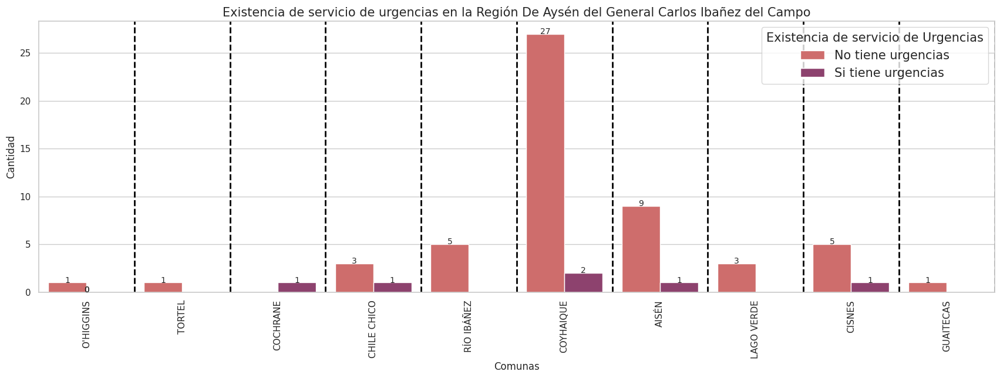

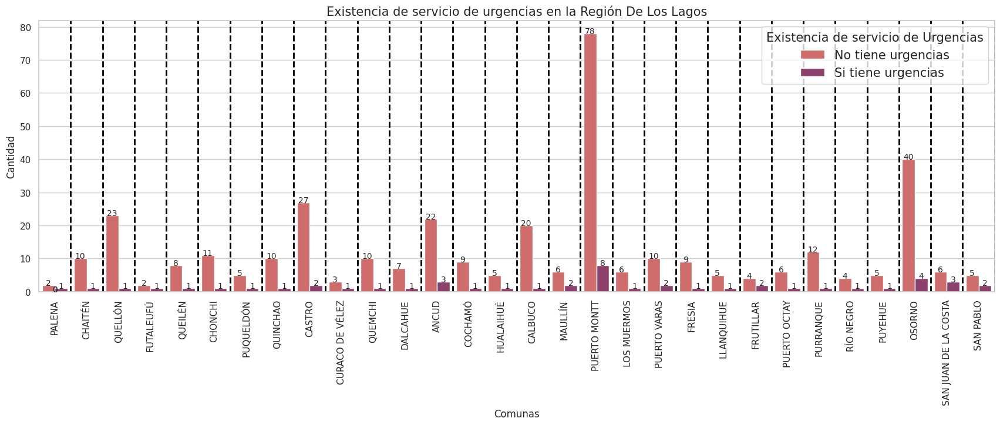

...

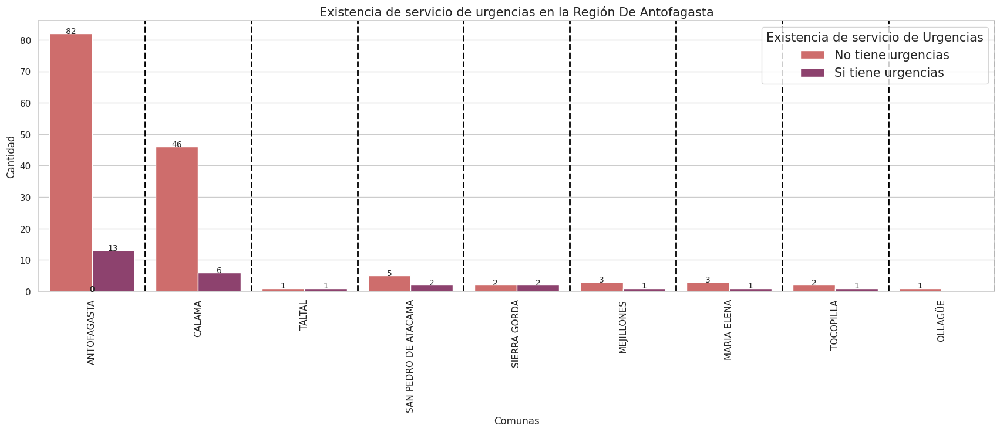

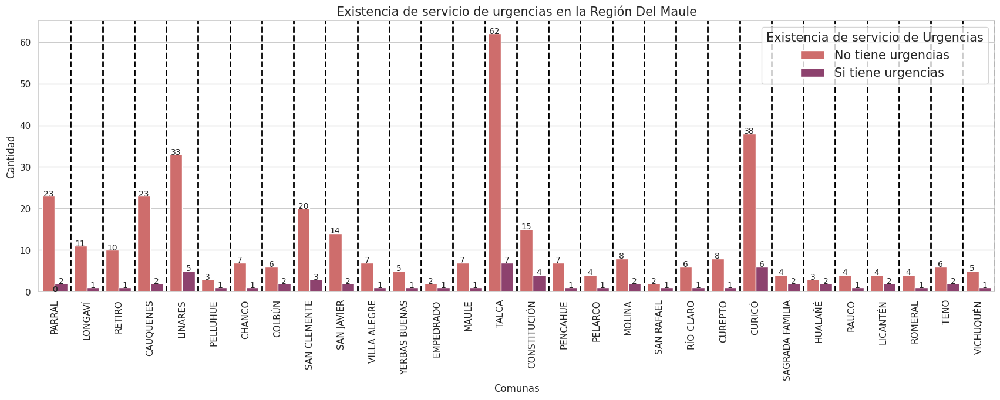

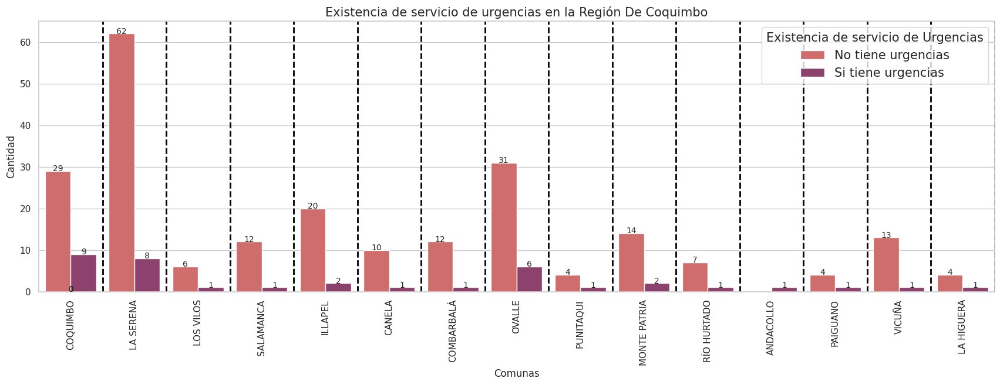

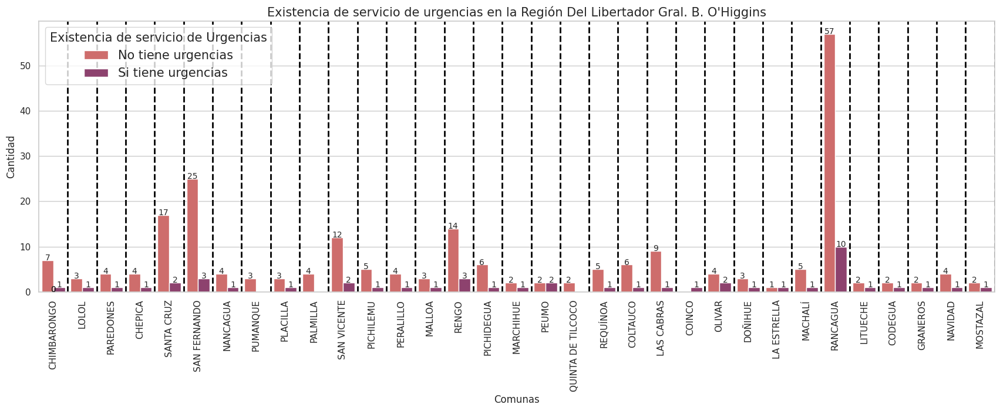

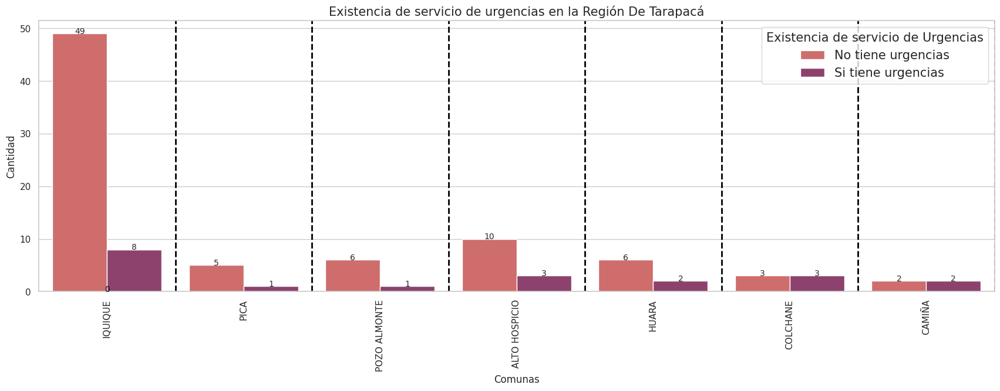

In [99]:
regiones_unicas = df_hospitales['nombre_región'].unique()  #Dataframe que permite tener la información por región sin repetición entre estas

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las regiones y crea un gráfico para cada una
for region in regiones_unicas:
    plt.figure(figsize=(21, 6))
     #Se realiza un countplot por la existencia de categorías existencia de algún tipo de urgencia por región
    ax = sns.countplot(x="nombre_comuna", data=df_hospitales[df_hospitales['nombre_región'] == region], hue="tiene_servicio_de_urgencia", palette="flare")
    for p in ax.patches: # Iteración que permite hacer las anotaciones con los valores sobre cada barra
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10") 
    plt.title(f'Existencia de servicio de urgencias en la {region}',fontsize = "15") #Se escoge el título del gráfico
    plt.ylabel('Cantidad') #Se nombre el eje y
    plt.xlabel('Comunas') #Se nombra el eje x 
    legend = plt.legend(["No tiene urgencias", "Si tiene urgencias"], fontsize = "15") #Se configura el cuadro resumen de los valores 
    legend.set_title("Existencia de servicio de Urgencias", prop={"size": "15"})
    for x in range(len(df_hospitales[df_hospitales['nombre_región'] == region]["nombre_comuna"].unique())):
        plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)
    plt.xticks(rotation=90) #Se rotan la forma en que se presentan las barras del eje x 
    plt.show()
# información para las legendas : https://www.delftstack.com/es/howto/matplotlib/matplotlib-legend-title/

<Figure size 2100x600 with 0 Axes>

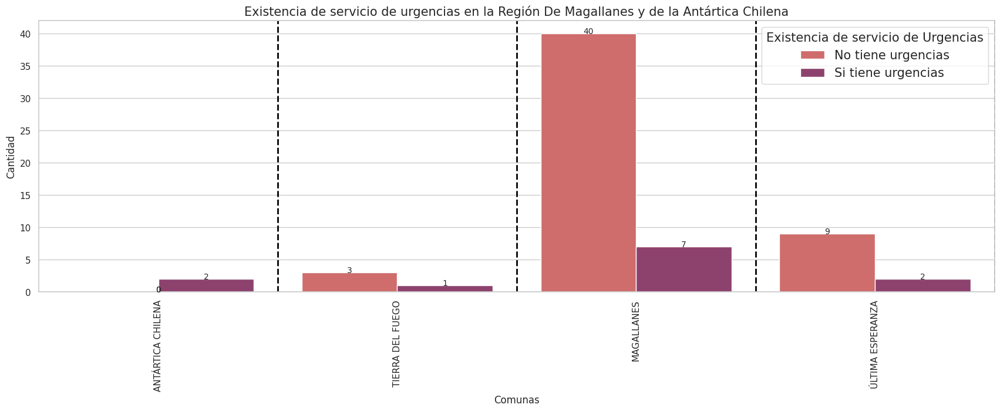

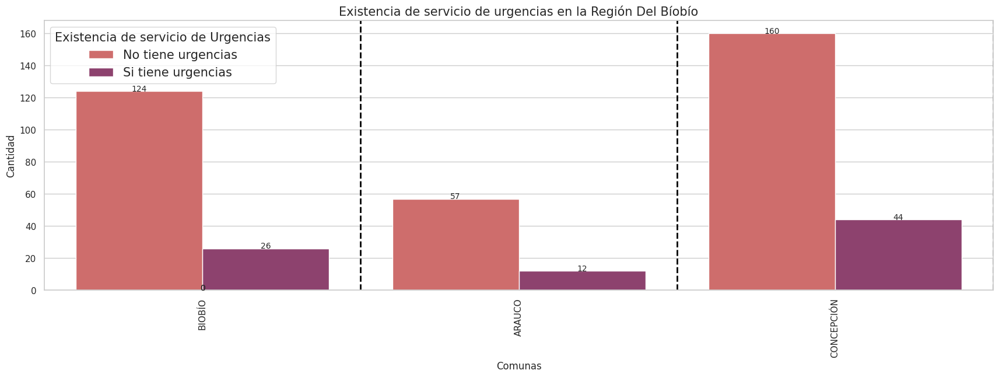

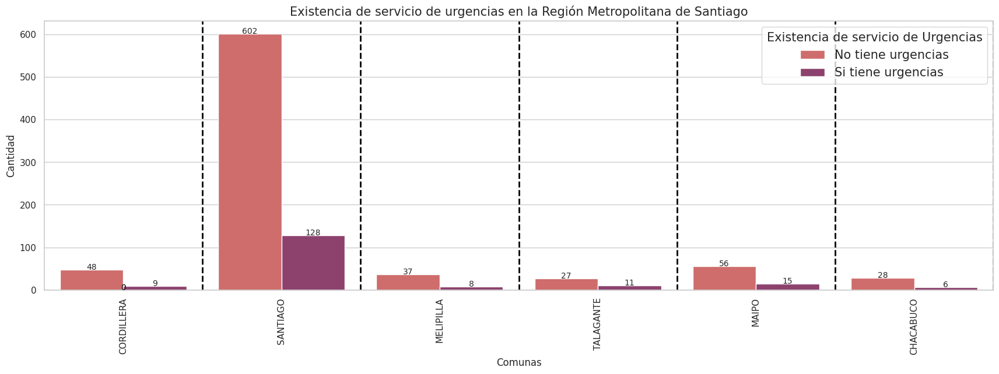

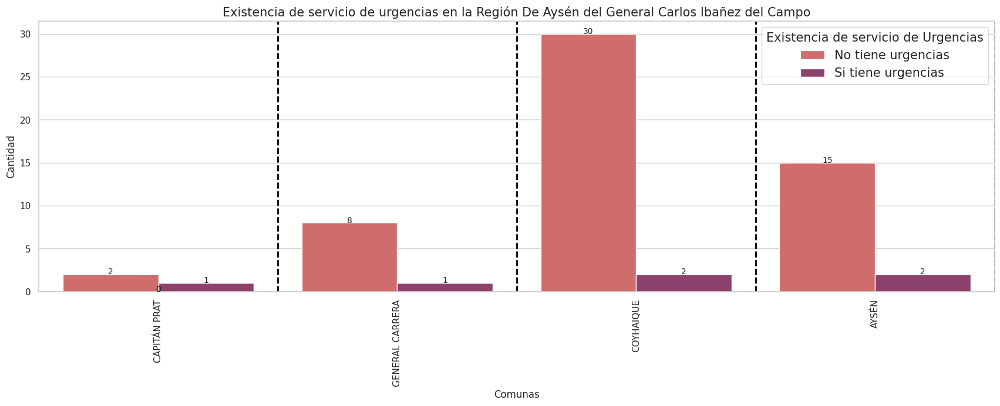

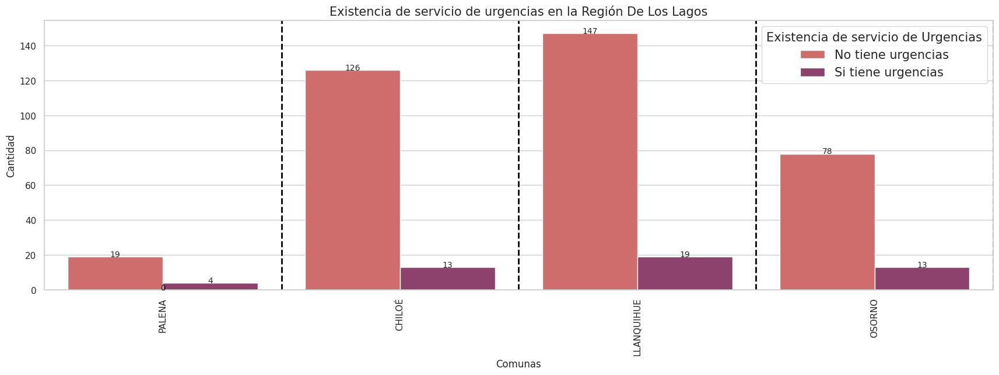

...

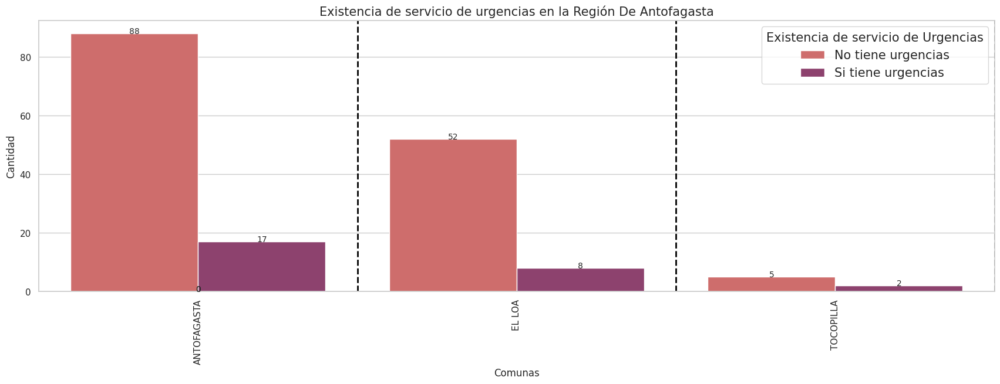

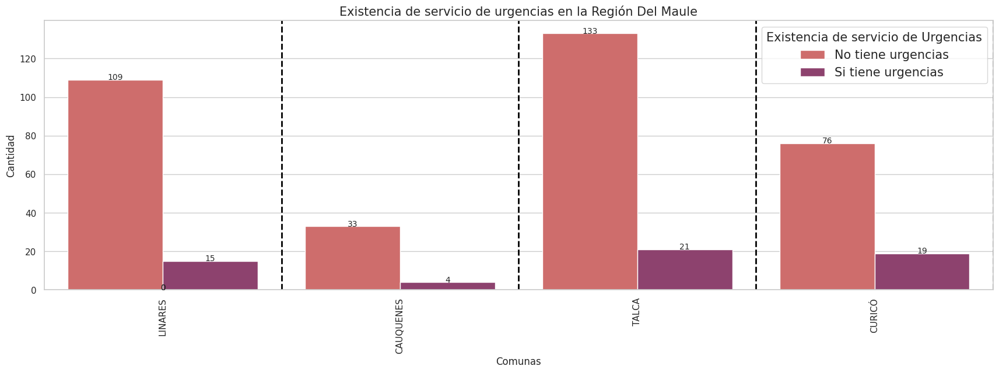

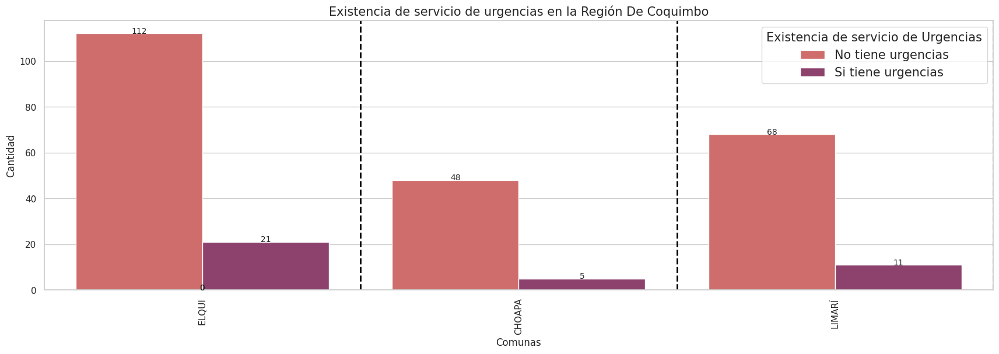

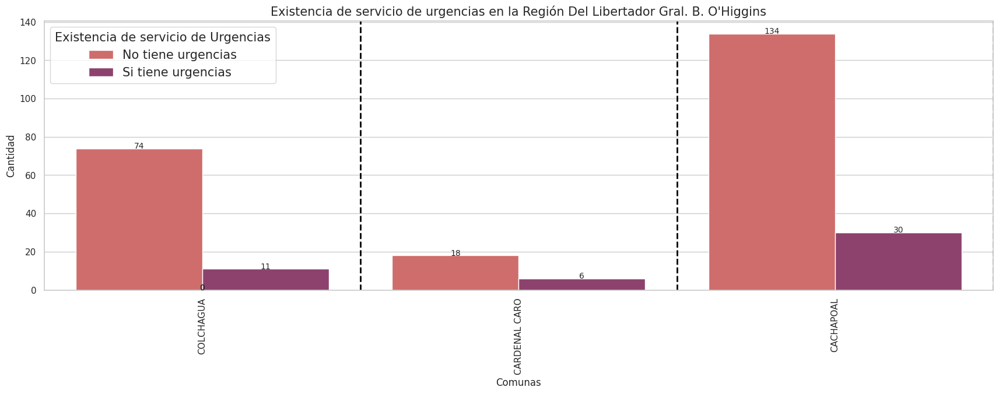

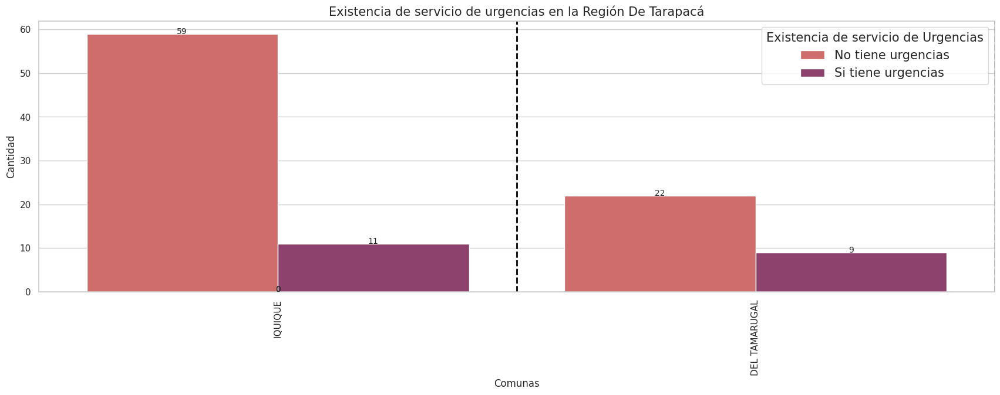

In [101]:
regiones_unicas = df_hospitales['nombre_región'].unique()  #Dataframe que permite tener la información por región sin repetición entre estas

# Establece el tamaño de la figura
plt.figure(figsize=(21, 6))

# Itera a través de las regiones y crea un gráfico para cada una
for region in regiones_unicas:
    plt.figure(figsize=(21, 6))
     #Se realiza un countplot por la existencia de categorías existencia de algún tipo de urgencia por región
    ax = sns.countplot(x="nombre_provincia", data=df_hospitales[df_hospitales['nombre_región'] == region], hue="tiene_servicio_de_urgencia", palette="flare")
    for p in ax.patches: # Iteración que permite hacer las anotaciones con los valores sobre cada barra
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline',fontsize = "10") 
    plt.title(f'Existencia de servicio de urgencias en la {region}',fontsize = "15") #Se escoge el título del gráfico
    plt.ylabel('Cantidad') #Se nombre el eje y
    plt.xlabel('Comunas') #Se nombra el eje x 
    legend = plt.legend(["No tiene urgencias", "Si tiene urgencias"], fontsize = "15") #Se configura el cuadro resumen de los valores 
    legend.set_title("Existencia de servicio de Urgencias", prop={"size": "15"})
    for x in range(len(df_hospitales[df_hospitales['nombre_región'] == region]["nombre_provincia"].unique())):
        plt.axvline(x + 0.5, color='black', linestyle='--', linewidth=2)
    plt.xticks(rotation=90) #Se rotan la forma en que se presentan las barras del eje x 
    plt.show()

En la exploración de los datos se realizan variadas operaciones sobre los dataframes de los centro de salud a lo largo del país. 
Primeramente se trabaja en torno a la variable de exitencia de urgencias, donde el valor binario de True, False declaraba; la existencia y la no existencia de estos en una localidad específica, respectivamente. 
Por posibilidades de que hubieran zonas iguales escritas de forma diferente es que se hace con los códigos actuales únicos establecidos, sobretodo considerando que las comunas son muchas para su revisión detallada. 
Luego aquello que se extrae de este trabajo sobre los datos es lo siguiente: 

Existencia de servicio de urgencia : 
    En la contabilización global sin separación por ninguna división geográfica, la mayoría de centros médicos (todos sin separación por tipo) no tienen servicio de urgencias, predominando el valor False con 3784 entradas. Por lo tanto, solo 741 si cuentan con urgencias de cualquier tipo.  
    Luego en la búsqueda específica por región se tiene que no hay ninguna región que no tenga al menos un servicio de médico sin urgencias (de cualquier tipo).
1. Analizando los valores de todas las regiones en conjunto, la que tiene más servicios con urgencias es la Metropolitana con 177. Que a fecha de 2017 es también la con más población, 7.122.808.
1. La que tiene menos servicios de urgencia analizando todos los valores regionales en conjunto es la de Arica y Parinacota con 5. Su población a 2017 era de 226.068
1. En el porcentaje que equivale al total de centros con urgencia sobre el total de centros por cada región individual, la región con el más alto sobre las otras regiones fue Valparaíso con un 21,09%. Que tiene a 2017 una población de 1.815.902.
1. En el cálculo de porcentajes anteriores, en la región Metropolitana los centros con urgencia médica sobre su total de centros, equivale a 18,15%
1. La región con número más bajo de centros con urgencia sobre el total de centros de la región sola, comparado con las otras regiones es la región de Arica y Parinacota con 6,9%. Por lo que, al ser menos de la mitad respecto al porcentaje mayor debería analizarse una mayor implementación de servicios con urgencias.

Por provincia (dividida internamente por comuna) se observó según los gráficos que las comunas sin servicio de urgencia son : 
   1. Las Torres del Paine, en la provincia de Última Esperanza (22.686 habitantes)
   2. Timaukel y Primavera, en la provincia de Tierra del Fuego (8364 habitantes)
   3. San Gregorio, Río Verde y Laguna Blanca , en la provincia de Magallanes (133.282 habitantes)
   4. Río Ibañez, provincia de General Carrera (7531 habitantes)
   5. O´higgins y Tortel, en la provincia de Capitán Prat (4638 habitantes)
   6. Lago Verde, en la provincia de Coyhaique (58.670 habitantes)
   7. Lumaco, Ercilla, Los Sauces y Renaico, en la provincia de Malleco (205.124 habitantes)
   8. Palmilla y Pumanque, en la provincia de Colchagua (22.556 habitantes)
   9. Quinta de Tilcoco, provincia de Cachapoal (646.133 habitantes)
   10. Panquehue, provincia de San Felipe de Aconcagua (154.718 habitantes)
   11. La Cruz, provincia de Quillota (203.277 habitantes)
   12. San Esteban y Rinconada , provincia de Los Andes (110.602 habitantes)
   13. Ollague , provincia de El Loa (177.048 habitantes)
   14. General lagos, provincia de Parinacota (3449 habitantes)
   15. Camarones, provincia de Arica (22.619 habitantes)
   16. Guaitecas, provincia de Aysén (32.319 habitantes)
Hay 25 comunas que no tienen centros médicos con servicio de urgencia de cualquier tipo.


Tipos de urgencia:
1. No hay ninguna región que tenga todos los tipos de urgencia 
2. Las cateogrías con cantidades más bajas son Ambulatoria Especializada (1 en Región Metropolitanan) y Urgencia Ambulatoria (1 en Región de los Lagos)
3. En total tipo de urgencia más recurrente es Urgencia Hospitalaria (UEH) con 248 recintos, le sigue Urgencia Ambulatoria (SAPU) con 234 y Urgencia Ambulatoria (SUR) con 159.
4. Las Comunas sin ningún tipo de servicio de urgencia son las mismas que no tienen urgencias.

Existencia de servicios por complejidad:
1. Todas las regiones tienen al menos un centro de salud de alta , mediana o baja complejidad
2. Existen 290 comunas de 346 que no tienen hospitales de alta complejidad
3. Existen 206 comunas de 346 que no tiene hospitales de mediana complejidad
4. No hay comunas que no tengan hospitales de baja complejidad

### ¿Cuál es la distribución numérica y territorial de las farmacias actualmente a lo largo de Chile?

Para realizar un análisis de la distribución de farmacias es que se crean dataframes desde el original por comuna, región y provincia. Renombrándose columnas para una mayor claridad. Finalmente se juntarán los dataframes para saber la cantidad de farmacias por cada comuna, región y provincia. 

In [39]:

df_farmacias_por_comuna = df_farmacias["código_comuna"].value_counts().reset_index()
df_farmacias_por_comuna.rename(columns={"count": "cantidad_farmacias_comuna",}, inplace=True)

df_farmacias_por_prov = df_farmacias["código_provincia"].value_counts().reset_index()
df_farmacias_por_prov.rename(columns={"count": "cantidad_farmacias_prov",}, inplace=True)

df_farmacias_por_reg = df_farmacias["código_región"].value_counts().reset_index()
df_farmacias_por_reg.rename(columns={"count": "cantidad_farmacias_reg",}, inplace=True)


df_farmacias_cantidad = pd.merge(left=df_farmacias_por_comuna, right=df_poblacion_por_comuna, on="código_comuna", how="right")
df_farmacias_cantidad["cantidad_farmacias_comuna"].fillna(0, inplace=True)

df_farmacias_cantidad = pd.merge(left=df_farmacias_cantidad, right=df_farmacias_por_prov, on="código_provincia", how="left")
df_farmacias_cantidad["cantidad_farmacias_prov"].fillna(0, inplace=True)

df_farmacias_cantidad = pd.merge(left=df_farmacias_cantidad, right=df_farmacias_por_reg, on="código_región", how="left")
df_farmacias_cantidad["cantidad_farmacias_reg"].fillna(0, inplace=True)




### Existencia de farmacias por comuna, región y provincia

Para la visualización de la cantidad de farmacias, se utilizan múltiples gráficos de barra, generados por medio de una iteración. Aquello con el fin de observar de manera individual por localidad como se distribuyen los totales de farmacias. La separación permite una contabilización más rápida y simple.

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


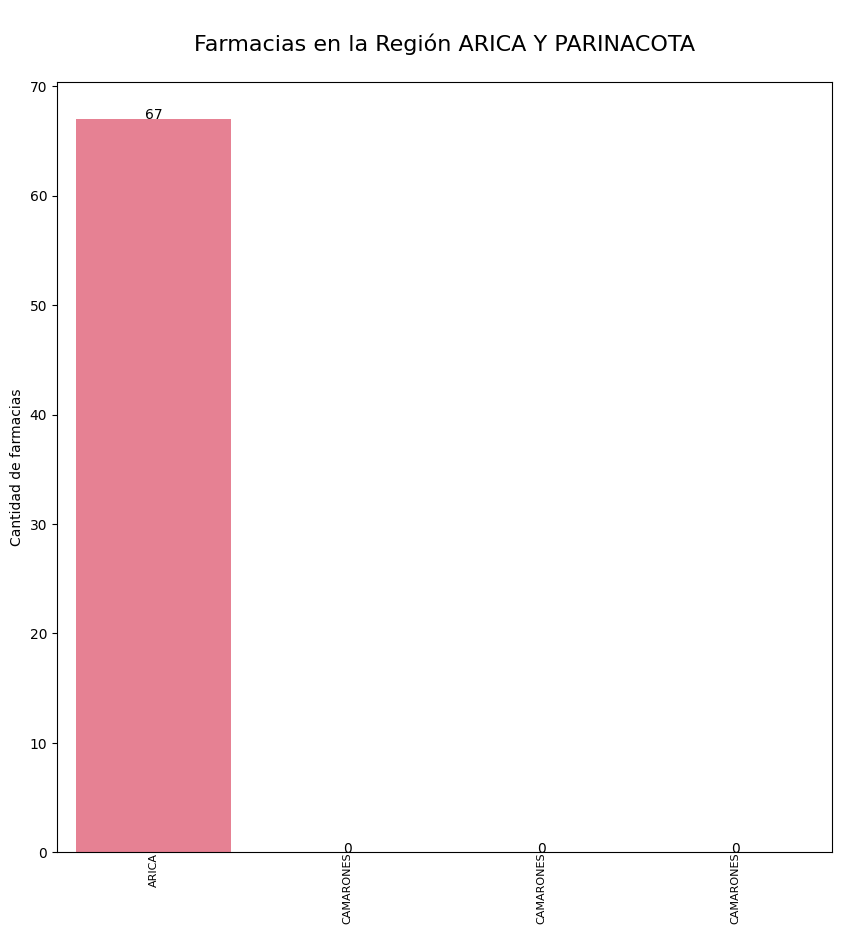

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


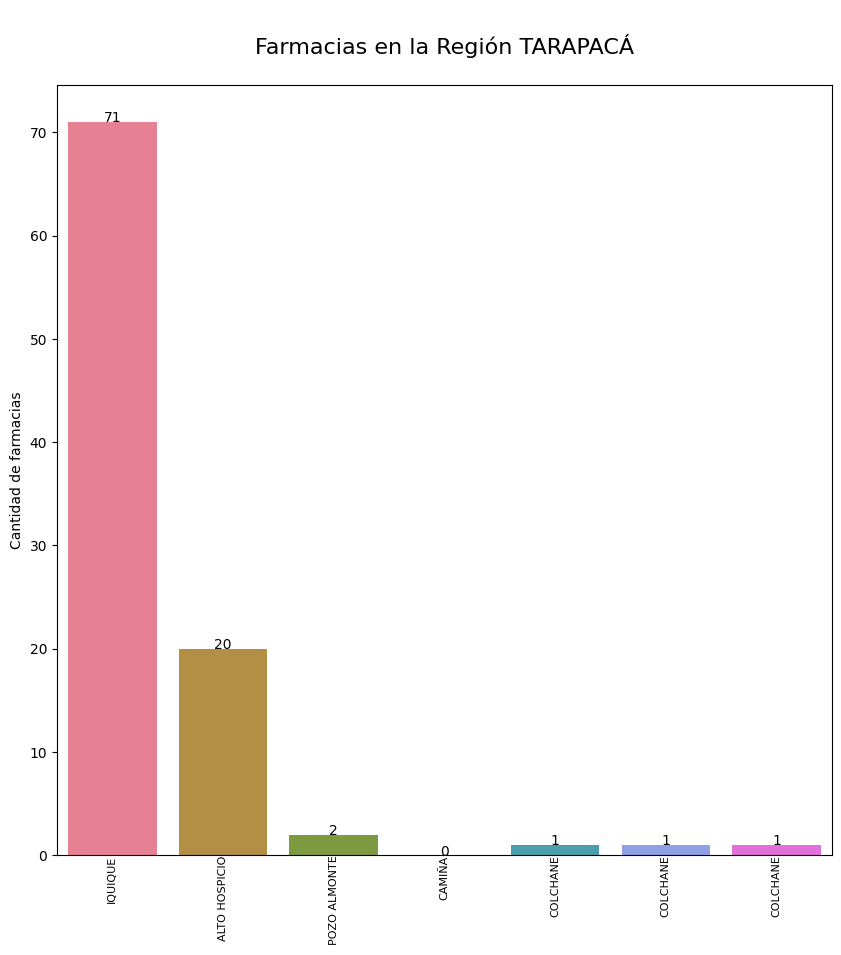

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


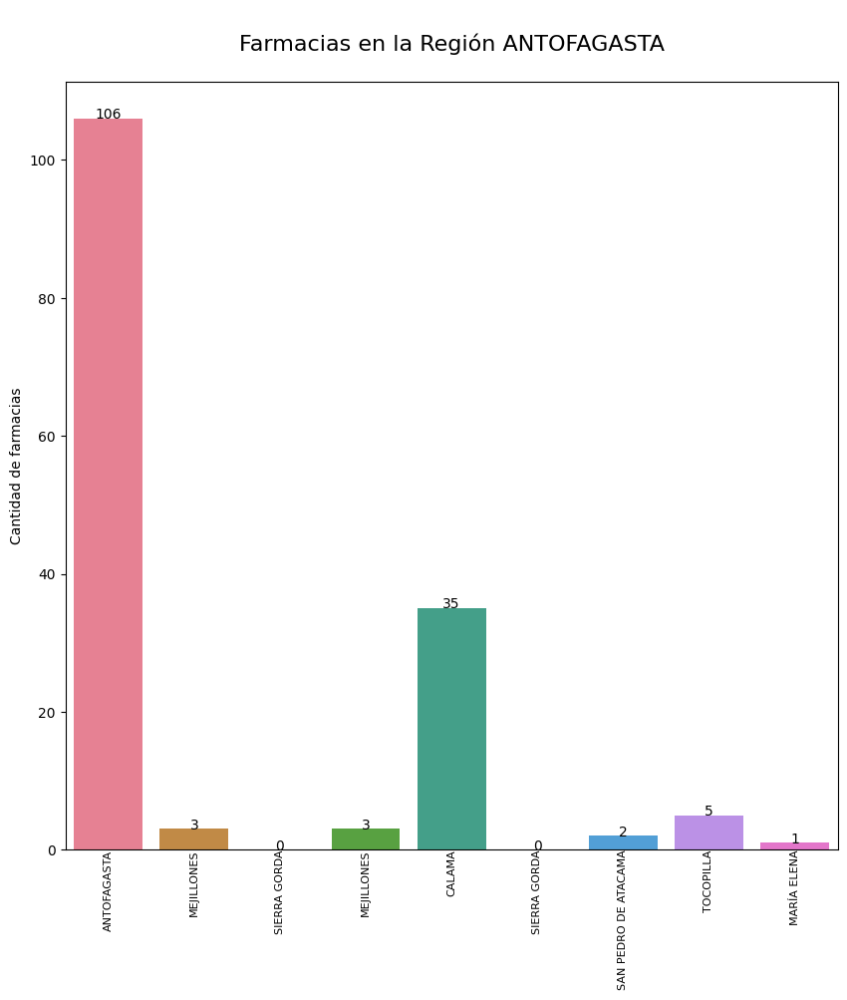

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


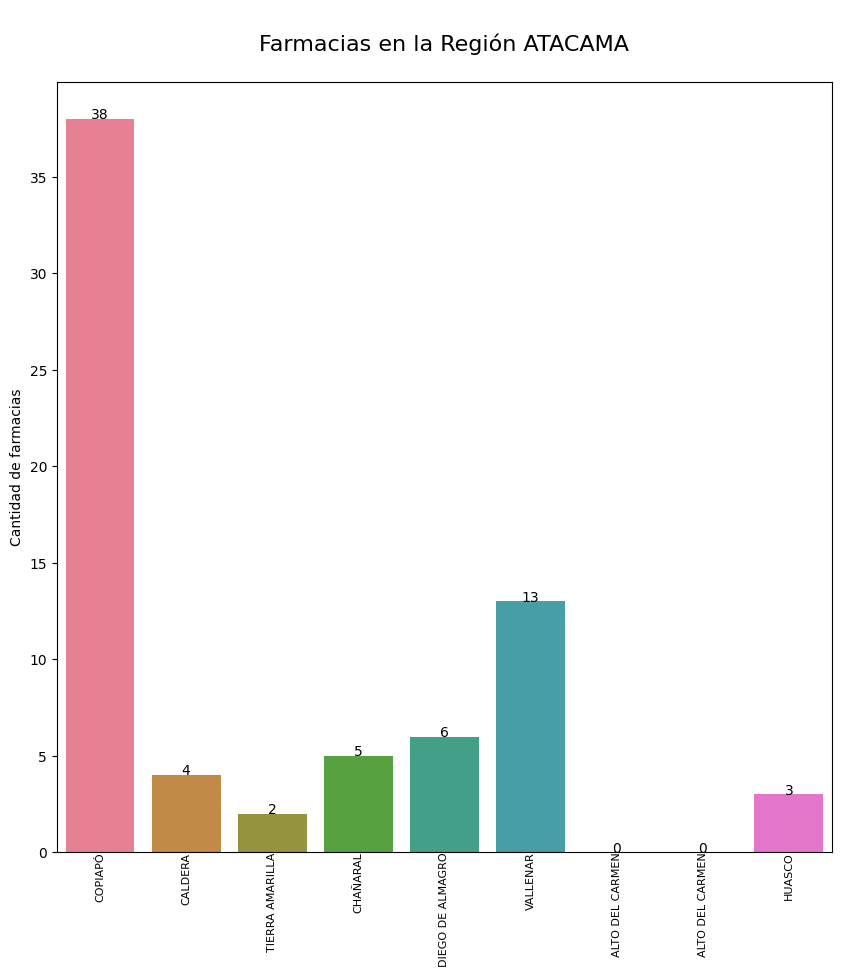

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


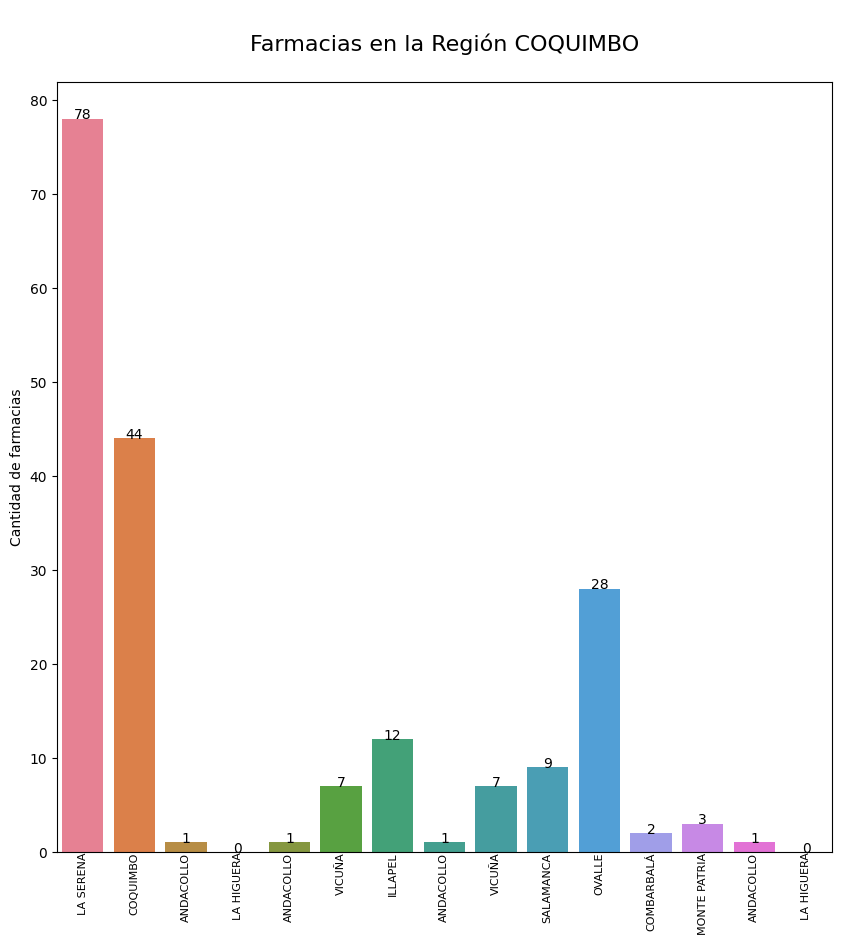

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


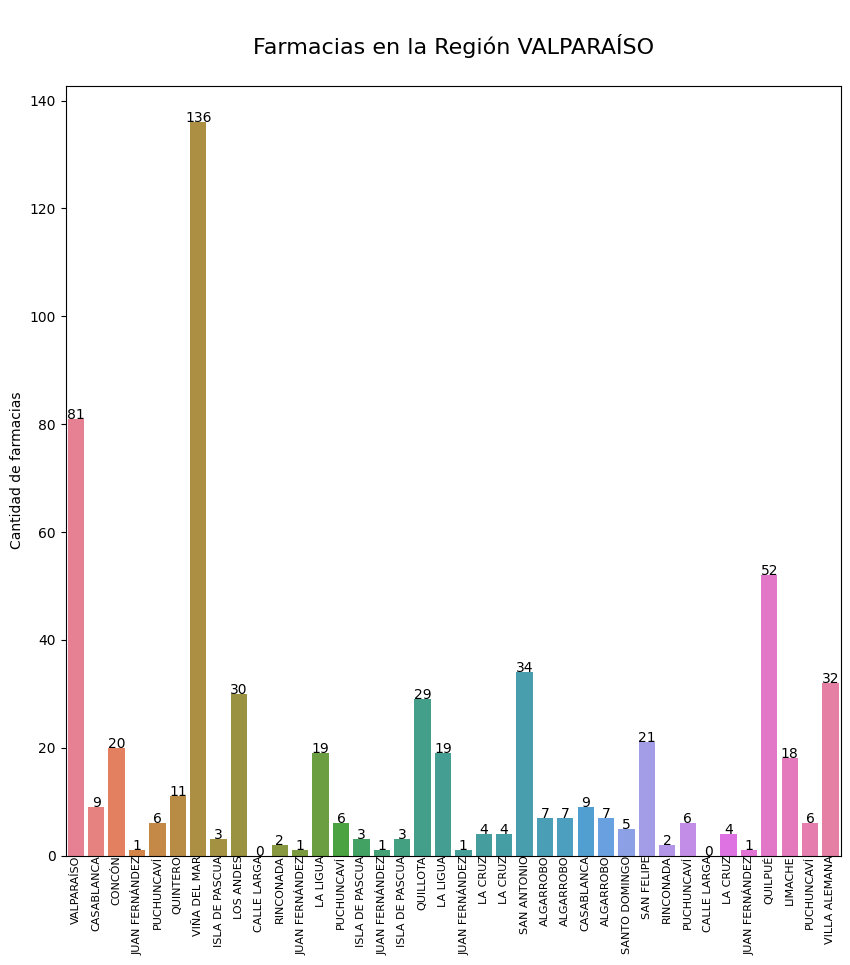

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


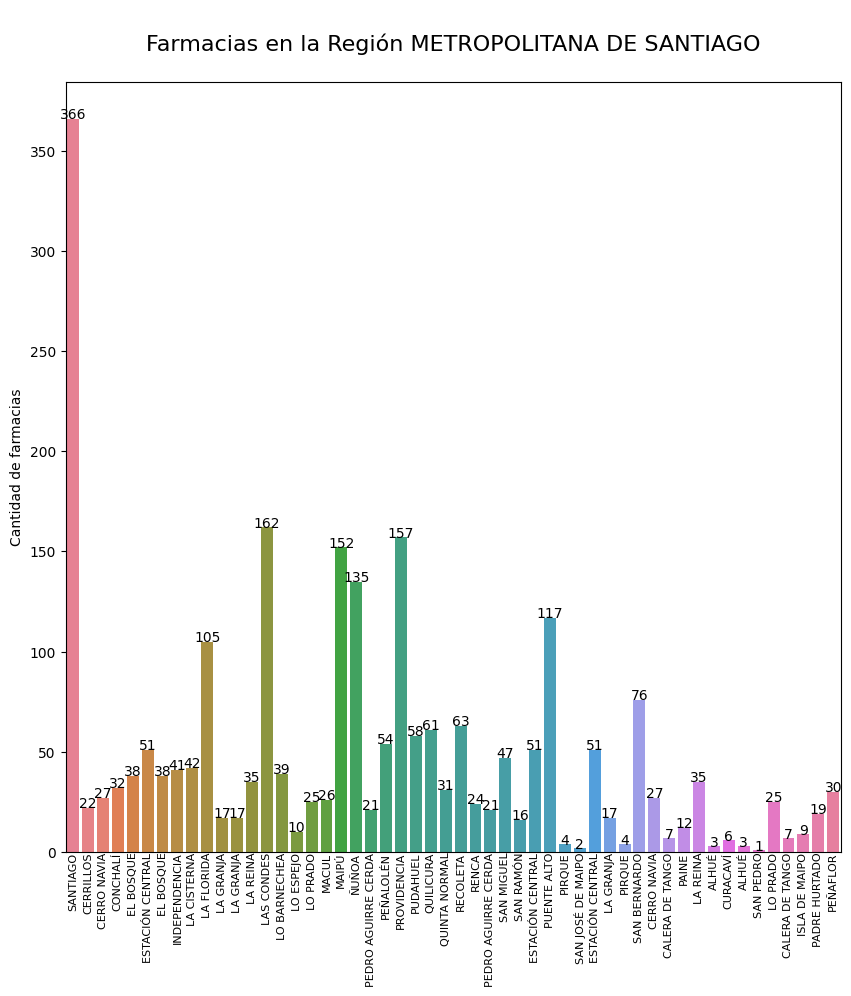

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


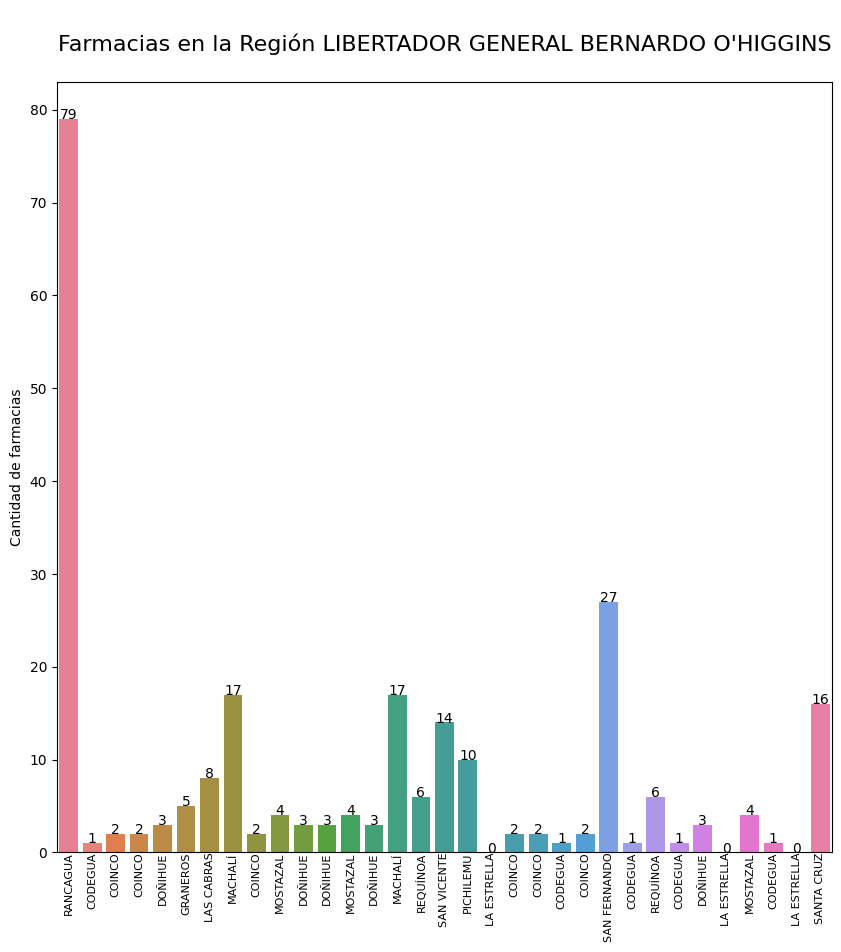

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


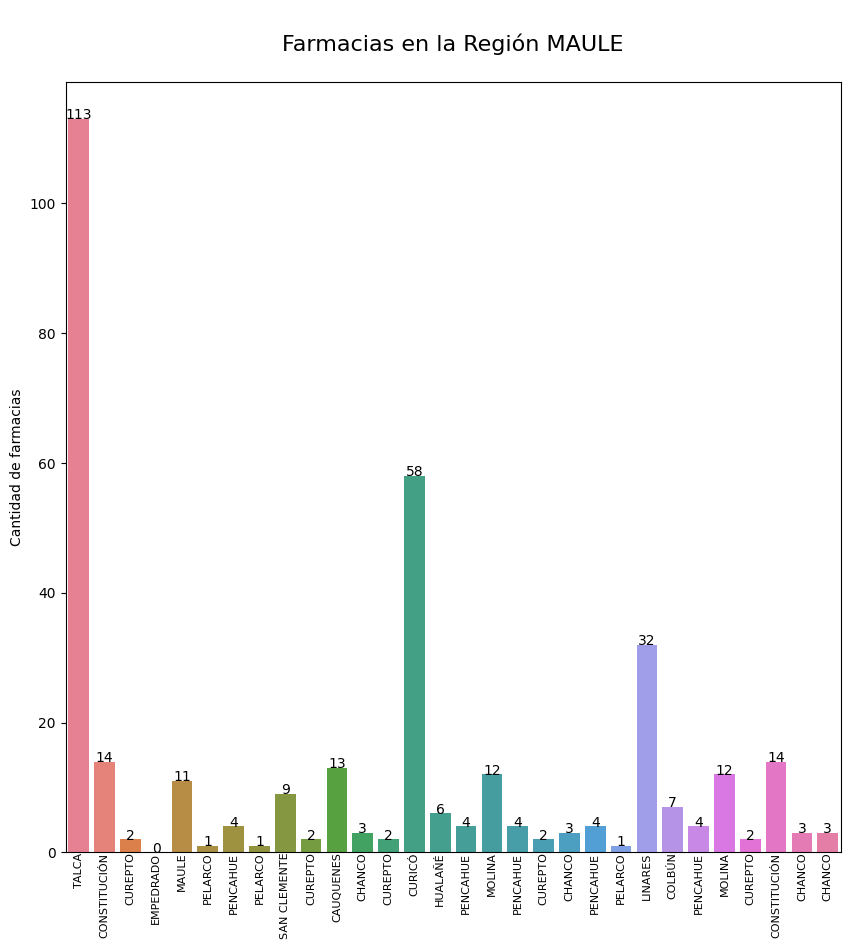

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


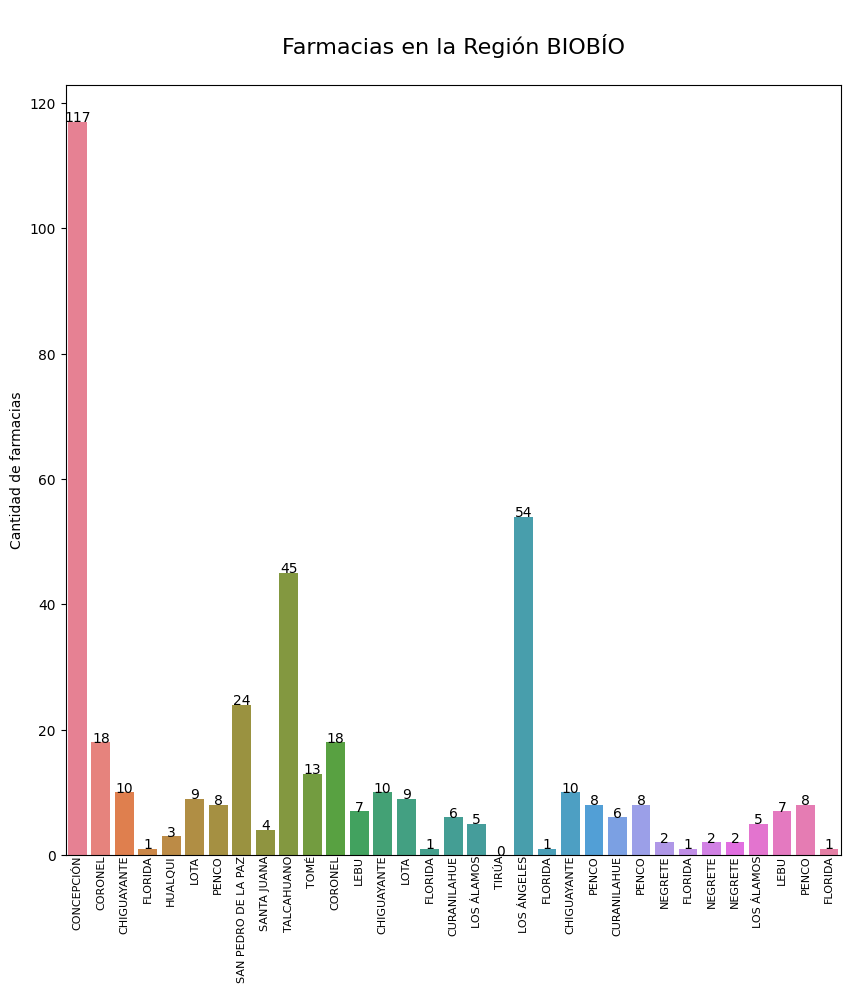

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


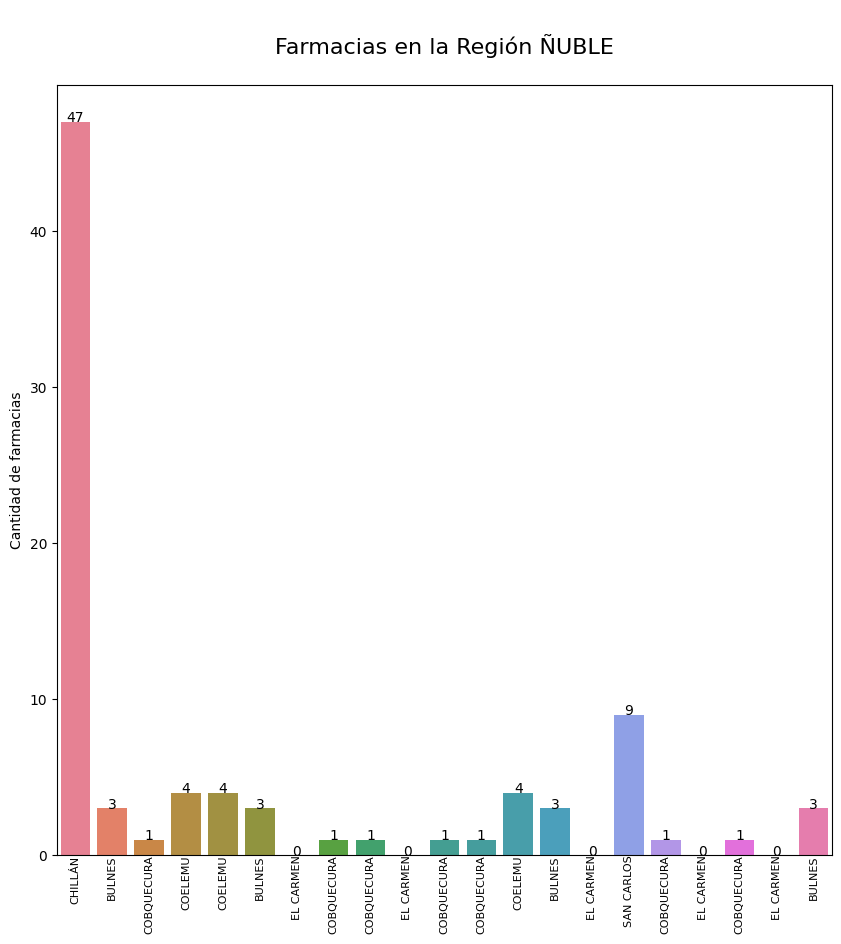

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


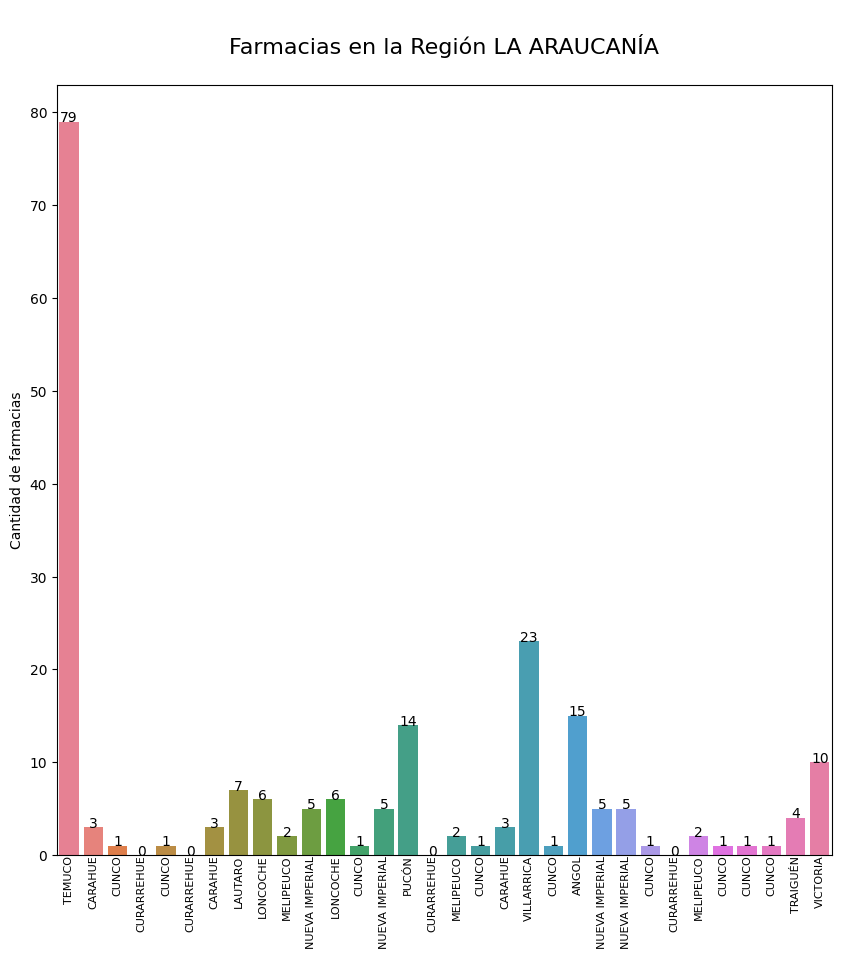

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


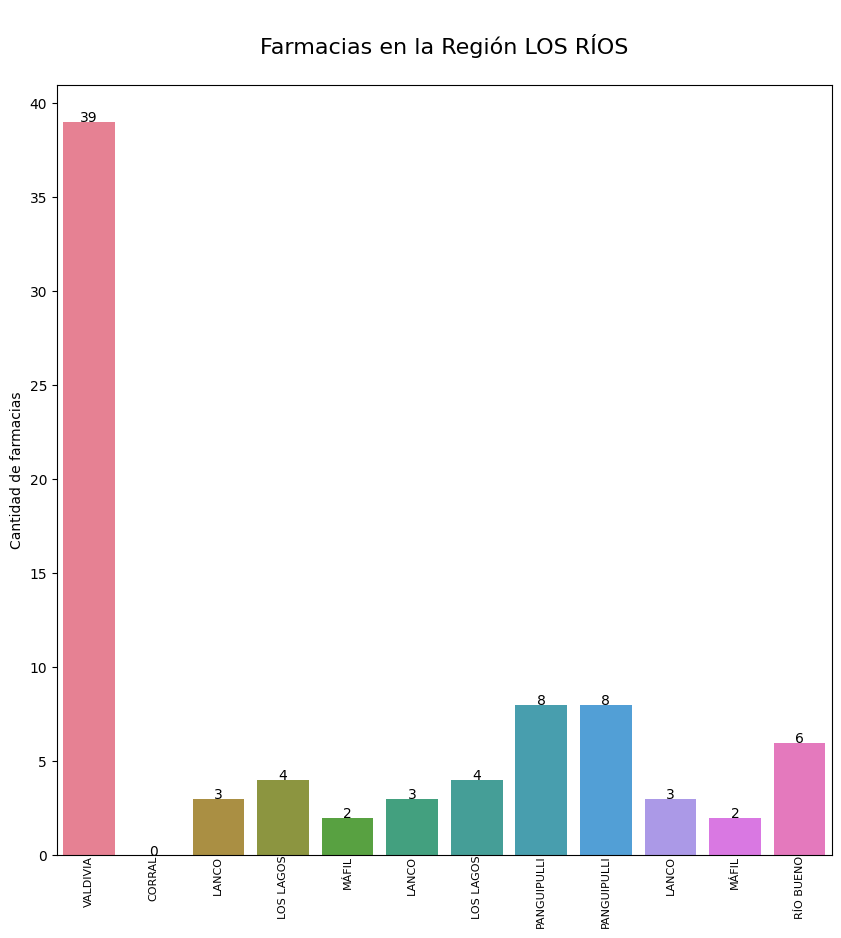

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


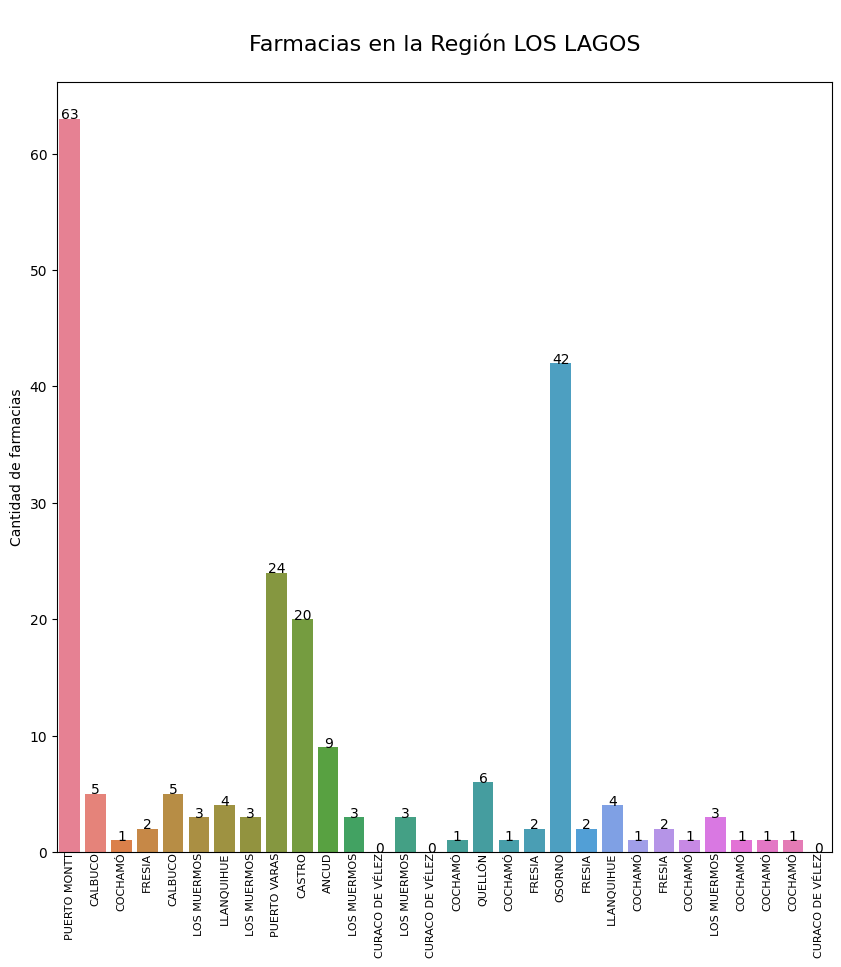

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


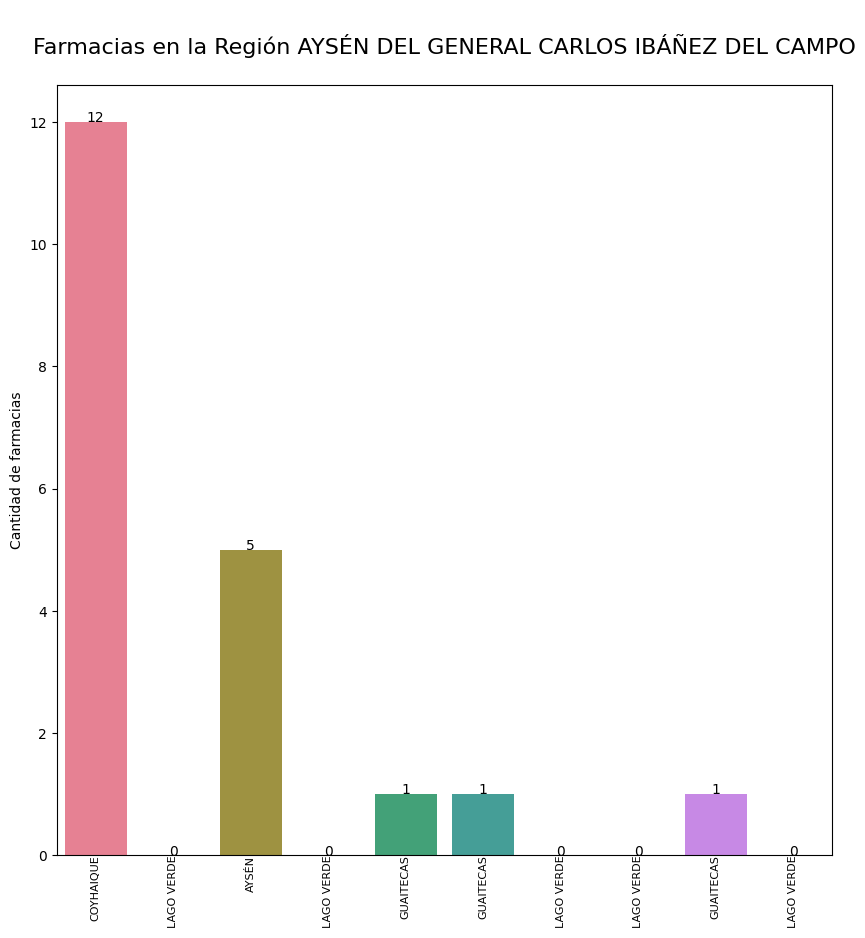

/tmp/ipykernel_37152/326295511.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")


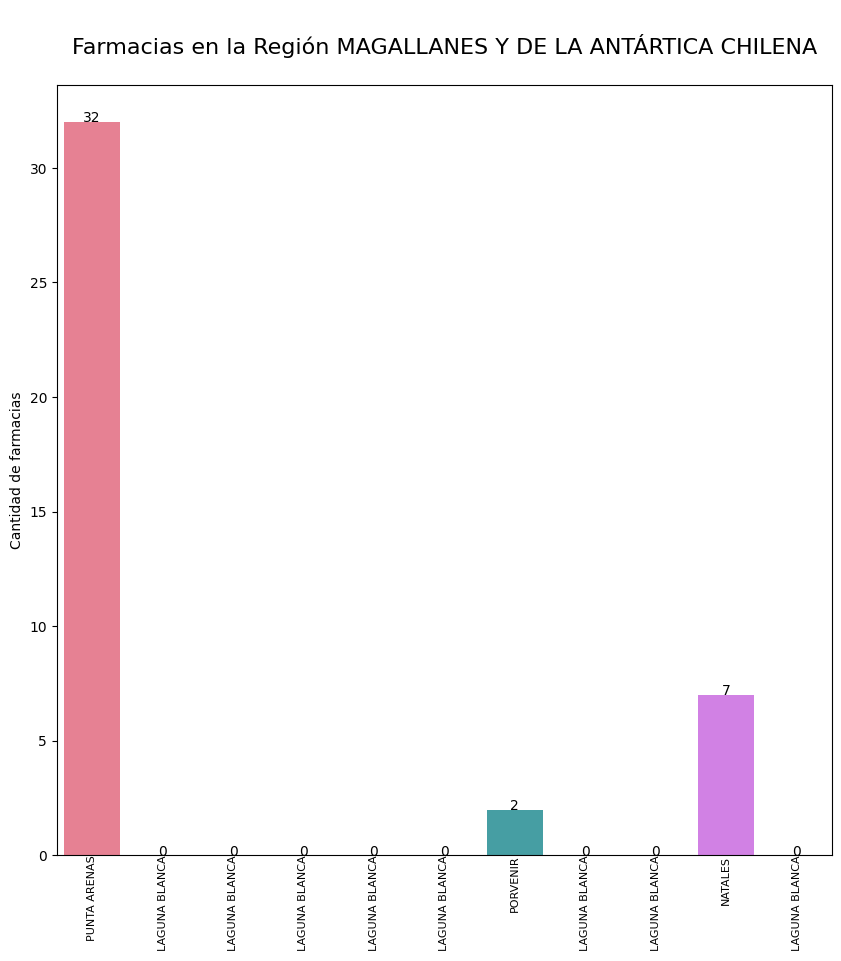

In [42]:
regiones_unicas = df_farmacias_cantidad['nombre_región'].unique() #Un dataframe con regiones sin repeteción 

for region in regiones_unicas:
    plt.figure(figsize=(10, 10))
    
    df_region = df_farmacias_cantidad[df_farmacias_cantidad['nombre_región'] == region]

    ax = sns.barplot(data=df_region, y="cantidad_farmacias_comuna", x="nombre_comuna", palette = "husl")

    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), #Valor en la barra por comuna
                    ha='center', va='baseline')
        ax.annotate(df_region[df_region['cantidad_farmacias_comuna'] == p.get_height()]['nombre_comuna'].values[0], #Nombre por comunas
                    (p.get_x() + p.get_width() / 2., 0),
                    ha='center', va='top', rotation=90, color='black', fontsize=8)

    plt.title(f'\nFarmacias en la Región {region}\n', fontsize=16)
    plt.xlabel("Nombre comuna")
    plt.ylabel("Cantidad de farmacias")
    ax.xaxis.set_visible(False)
    plt.show()


Para filtrar aquellas provincias que no tienen farmacias es que se buscan en específico en la columna "cantidad_farmacias_prov" aquellos valores iguales a 0. Permitiendo una contabilización mucho más expedita del total

In [43]:
df_farmacias_cantidad[df_farmacias_cantidad["cantidad_farmacias_prov"] == 0] 

,código_comuna,cantidad_farmacias_comuna,orden,nombre_región,código_región,nombre_provincia,código_provincia,nombre_comuna,edad,hombres,mujeres,total,cantidad_farmacias_prov,cantidad_farmacias_reg
2,15201.0,0.0,66,ARICA Y PARINACOTA,15.0,PARINACOTA,152.0,PUTRE,Total Comunal,2054,711,2765,0.0,67
3,15202.0,0.0,88,ARICA Y PARINACOTA,15.0,PARINACOTA,152.0,GENERAL LAGOS,Total Comunal,412,272,684,0.0,67
339,12201.0,0.0,7480,MAGALLANES Y DE LA ANTÁRTICA CHILENA,12.0,ANTÁRTICA CHILENA,122.0,CABO DE HORNOS,Total Comunal,1195,868,2063,0.0,41
340,12202.0,0.0,7502,MAGALLANES Y DE LA ANTÁRTICA CHILENA,12.0,ANTÁRTICA CHILENA,122.0,ANTÁRTICA,Total Comunal,126,12,138,0.0,41


Por ende hay 4 provincias con todas sus comunas asociadas sin farmacias ; Parinacota y la Antártica Chilena

Luego para filtrar aquellas comunas que no tienen farmacias es que se buscan en específico en la columna "cantidad_farmacias_comuna" aquellos valores iguales a 0. 

In [47]:
len(df_farmacias_cantidad[df_farmacias_cantidad["cantidad_farmacias_comuna"] == 0])

43

Hay 43 comunas sin farmacias a lo largo de Chile

Para la visualización de la cantidad de farmacias por provincia , se utiliza un gráficos de barra que contiene todas simultáneamente. Aquello con el fin de observar de manera individual por localidad como se distribuyen los totales de farmacias.

/tmp/ipykernel_37152/21091670.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x="nombre_provincia", y = "cantidad_farmacias_prov", data=df_farmacias_cantidad, palette = "husl")


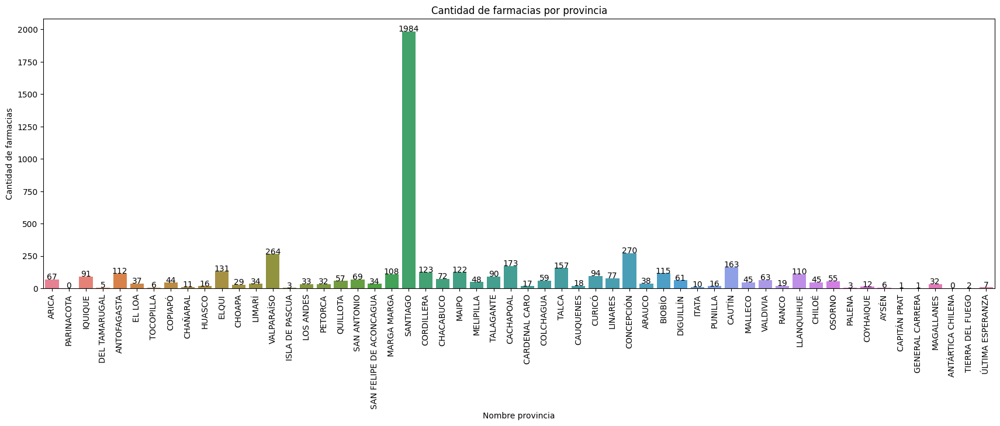

In [49]:
plt.figure(figsize=(21, 6))
ax = sns.barplot(x="nombre_provincia", y = "cantidad_farmacias_prov", data=df_farmacias_cantidad, palette = "husl")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.title("Cantidad de farmacias por provincia")
plt.xlabel("Nombre provincia")
plt.ylabel("Cantidad de farmacias")
plt.show()

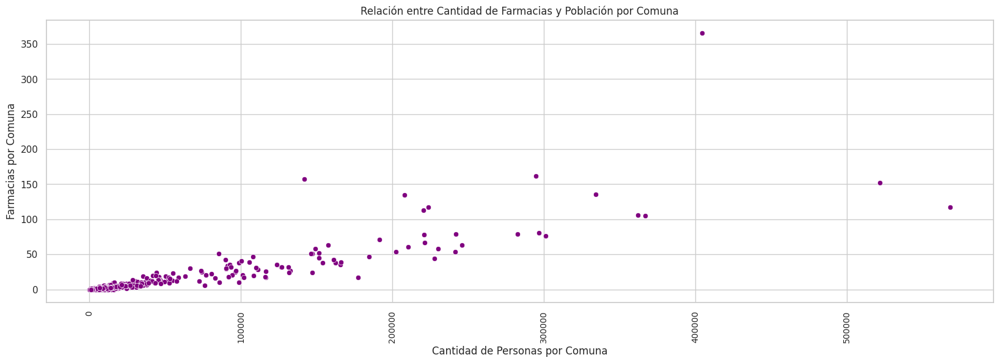

In [50]:
from matplotlib.ticker import FuncFormatter

sns.set_theme(style="whitegrid")
f, ax = plt.subplots(1, 1, figsize=(20, 6))

sns.scatterplot(data=df_farmacias_cantidad, y="cantidad_farmacias_comuna", x="total",color = "purple")

ax.set_ylabel("Farmacias por Comuna")
ax.set_xlabel("Cantidad de Personas por Comuna")
ax.set_title("Relación entre Cantidad de Farmacias y Población por Comuna")

def format_x_ticks(value, _):
    return f'{value:.0f}'

ax.xaxis.set_major_formatter(FuncFormatter(format_x_ticks))

ax.tick_params(axis='x',rotation=90, labelsize=10)

plt.show()


Para conocer la relación entre la variable de cantidad total de personas por comuna y las farmacias por comuna, es que se utiliza el gráfico de scatterplot. Ello debido a que por medio de la simbolización de datos en puntos permite ver si existe alguna correlación a simple vista entre ambas.

In [ ]:
df_farmacias_cantidad[["cantidad_farmacias_comuna", "total"]].corr(numeric_only=True)

Luego por medio de la función .corr es que se obtiene numéricamente el valor de correlación entre ambas variables. Es un valor bastante alto de 0.849 aproximadamente. Indicando que existe una relación importante entre mayor cantidad de farmacias a mayor cantidad de población en una comuna y lo mismo en caso de un menor valor. Esto en la generalidad de los casos


- En la mayoría de las regiones, las farmacias tienden a concentrarse en una o dos comunas, con la notable excepción de la Región Metropolitana, donde la mayoría de las comunas cuentan con una gran cantidad de farmacias. 

- La distribución numérica sugiere que, en general, la cantidad de farmacias en una comuna se correlaciona con la población de esa comuna.

- Hay 43 comunas en Chile que actualmente no cuentan con farmacias, como se muestra en el último DataFrame

Generando una relación con las comunas con falta de farmacias es que hay repetición de algunas de estas en aquellas que tenían falta de cualquier tipo de urgencia. Siendo las siguientes : Primavera, Ollague, Camarones, Gral lagos, O´higgins, Río Ibañez, Tortel, Lago verde, Palmilla,Pumanque, Panquehue, Torres del paine, Laguna blanca, San gregorio y Río verde. Por lo que, existiría una carencía en ambos ámbitos dentro de estas localidades. Debíendo considerarse un plan de implementación de estos servicios según necesidades específicas de la población. El riesgo de la población que no tiene urgencias y farmacias en su alrededor es importante, respecto a las garantías que el Estado tendría que proveer.

## ¿Cuál es la distribución de los servicios médicos privados y públicos a lo largo de Chile?

Dentro del estudio de los datos, también se busca conocer como es que funciona la distribución de centros médicos según su clasificación en público o privado.

Por lo tanto, se realiza un gráfico para conocer la distribución de los tipos de urgencia en las regiones de Chile. Se selecciona el gráfico de barra con división por región, para ver claramente cuál el la cantidad por cada uno. Además esta herramienta permite con el hue ver cada categoría con un color separado.

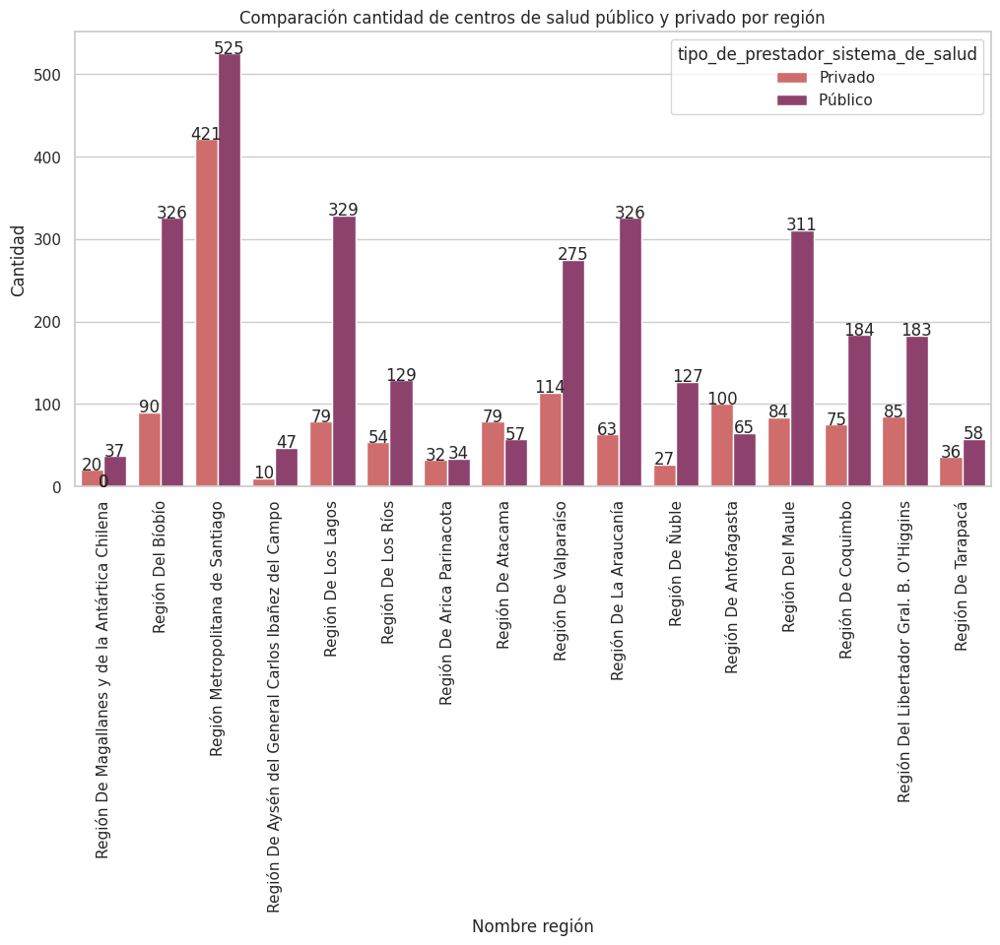

In [54]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(x="nombre_región", data=df_hospitales_1, hue="tipo_de_prestador_sistema_de_salud", palette="flare")
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
plt.xticks(rotation=90)
plt.xlabel("Nombre región")
plt.ylabel("Cantidad")
plt.title("Comparación cantidad de centros de salud público y privado por región")
plt.show()

In [55]:
df_hospitales_1.columns

Index(['código_vigente', 'código_región', 'nombre_región',
       'código_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'nombre_dependencia_jerárquica_(seremi_/_servicio_de_salud)',
       'pertenencia_al_snss', 'tipo_establecimiento_(unidad)',
       'ámbito_de_funcionamiento', 'nombre_oficial', 'nivel_de_atención',
       'código_comuna', 'nombre_comuna', 'tiene_servicio_de_urgencia',
       'tipo_de_urgencia', 'latitud', 'longitud',
       'tipo_de_prestador_sistema_de_salud', 'nivel_de_complejidad',
       'tipo_de_atención', 'código_provincia', 'nombre_provincia'],
      dtype='object', name=0)

Para conocer de forma sintética y clara solo la cantidad de servicios públicos y privados por comuna , se realiza una pivot table.

In [57]:
cantidad_publicos_privados_comuna = pd.pivot_table(df_hospitales_1, 
                                 index='código_comuna', 
                                 columns='tipo_de_prestador_sistema_de_salud', 
                                 aggfunc='size', )  #Función size para conocer la cantidad 
#Agrupar cantidad de servicios público/privado en cada comuna
df_hospitales_poblacion_comuna_publico_privado = pd.merge(df_hospitales_poblacion_comuna, cantidad_publicos_privados_comuna, on="código_comuna") 
#Nueva columna para saber la diferencia en cantidad de público y privado 
df_hospitales_poblacion_comuna_publico_privado["diferencia_publico_menos_privado"] = df_hospitales_poblacion_comuna_publico_privado["Público "] - df_hospitales_poblacion_comuna_publico_privado["Privado"]
df_hospitales_poblacion_comuna_publico_privado.sort_values(by="diferencia_publico_menos_privado", ascending=True, inplace=True)
df_hospitales_poblacion_comuna_publico_privado["nombre_comuna"]

104     PROVIDENCIA
95       LAS CONDES
11      ANTOFAGASTA
82         SANTIAGO
20          COPIAPÓ
           ...     
258         LAUTARO
252         CARAHUE
175    SAN CLEMENTE
296         CALBUCO
216     LOS ÁNGELES
Name: nombre_comuna, Length: 345, dtype: object

Se calcula con la función len la longitud en las columnas "Privado " y "Público" del dataframe df_hospitales_poblacion_comuna_publico_privado, pero filtrando para valores iguales a cero (no existencia en esa comuna).

In [463]:
len(df_hospitales_poblacion_comuna_publico_privado[df_hospitales_poblacion_comuna_publico_privado["Privado"] == 0])

204

In [466]:
len(df_hospitales_poblacion_comuna_publico_privado[df_hospitales_poblacion_comuna_publico_privado["Público "] == 0]) #Solo hay una la antartica

0

Para conocer la relación entre la variable de cantidad total de prestador por comuna y los tipos de prestadores por comuna, es que se utiliza el gráfico de scatterplot. Ello debido a que por medio de la simbolización dividida de datos en puntos y triángulos es que se permite ver si existe alguna correlación a simple vista entre ambas.

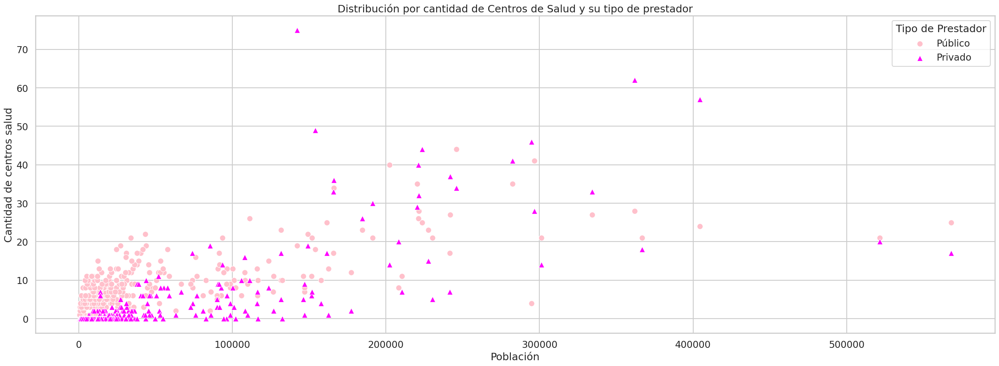

In [62]:
plt.figure(figsize=(30, 10))

sns.set(style="whitegrid")
sns.set_context("talk")

scatter_plot = sns.scatterplot(data=df_hospitales_poblacion_comuna_publico_privado, x="total", color = "purple")
#Ajustes individuales de cada plot por tipo de prestador
scatter_plot = sns.scatterplot(data=df_hospitales_poblacion_comuna_publico_privado, y="Público ", x="total", marker='o', s=100, label='Público', color = "pink")
scatter_plot = sns.scatterplot(data=df_hospitales_poblacion_comuna_publico_privado, y="Privado", x="total",marker='^', s=100, label='Privado', color = "magenta")

plt.legend(title='Tipo de Prestador')
plt.ylabel("Cantidad de centros salud")
plt.xlabel("Población")
plt.title("Distribución por cantidad de Centros de Salud y su tipo de prestador")
plt.show()


Se utiliza un mapa de calor para conocer la correlación numérica entre las siguientes variables : "hospitales_x_comuna", "Privado","Público ", "total". Esto con el propósito de establecer algunas conclusiones preliminares de la relación  entre los datos.

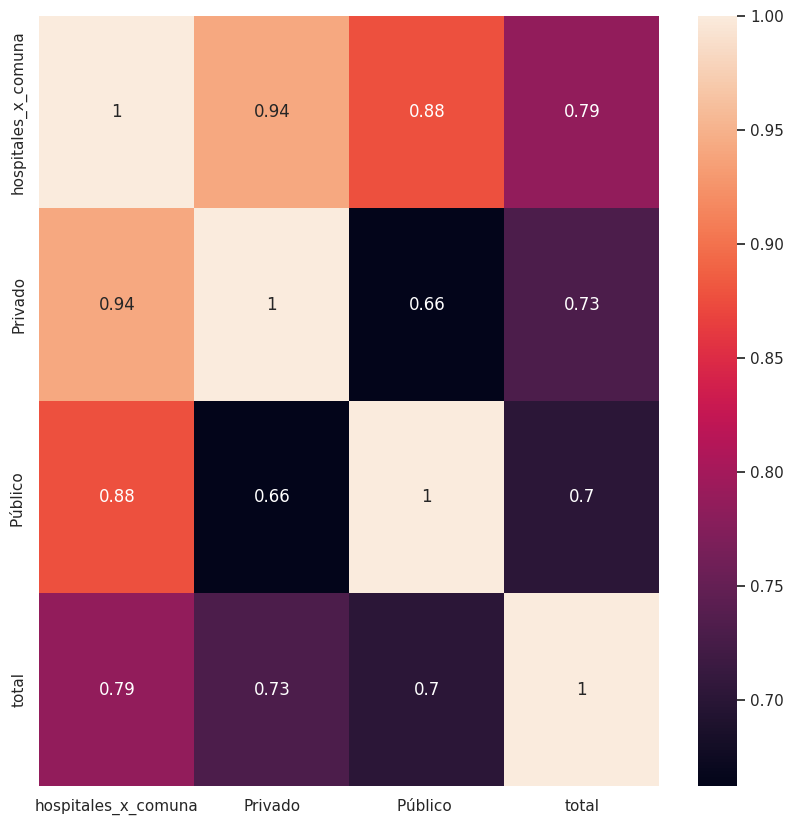

In [481]:
plt.figure(figsize=(10, 10))

sns.heatmap(df_hospitales_poblacion_comuna_publico_privado[["hospitales_x_comuna", "Privado","Público ", "total"]].corr(), annot=True) 

plt.show()


 
- En cuanto a la variedad regional existe una mayor variedad de establecimientos de acceso publico que privado exceptuando por la 1era y tercera región; donde la mayor variedad de establecimientos publicos que se encuentre en la region de la Araucanía, mientras que la mayor variedad de establecimientos privados es en la region de Antofagasta.

- En la variedad comunal existe una mayor variedad de establecimientos privados en 26 regiones donde la comuna con mayor variedad es la comuna de Providencia, con mayor variedad de establecimientos privados, mientras que la comuna de Los Ángeles posee la mayor variedad de establecimientos publicos.


 ### Al agrupar los hospitales por coordenadas ¿Todos estos grupos tienen cada tipo de servicio según complejidad? 

Para focalizarse en el análisis por coordenadas y tipo de servicio por complejidad se debe hacer una limpieza previa.

Primero se eliminaran las filas que no tengan datos en latitud o longitud, ya que sin las coordenadas no se podra responder la pregunta.

In [63]:
df_hospitales_P4 = df_hospitales.dropna(subset=['latitud', 'longitud', 'nivel_de_complejidad'])
#se pasa el dataframe de hospitales a un geodaframe para poder hacer uso de los métodos que se incluyen en geopandas
gdf_hospitales = gpd.GeoDataFrame(
    df_hospitales_P4, geometry=gpd.points_from_xy(df_hospitales_P4.longitud, df_hospitales_P4.latitud), crs="EPSG:5360"
)

Se renombran algunas columnas para una lectura más simplificada y además se establece que el sistema de coordenadas de los valores en la columna "geometry" será crs 5360

In [66]:
comunas = gpd.read_file('./maps/Comunas.zip') # se lee el archivo
comunas.rename(columns={'codregion': 'código_región', 'Region': 'nombre_región', 'Comuna': 'comuna'}, inplace=True)
comunas['geometry'] = comunas['geometry'].to_crs(5360) #Sistema de representación de coordenas de seleccionado

Para un acercamiento más correcto al análisis por coordenada es que se realiza el modelo de clustering "DBSCAN".

Se seleccionan : los valores a utilizar (latitud y longitud), el epsilon (representando el grado de distancia ) y la cantidad mínima de clusters que pueden existir.

In [69]:
from sklearn.cluster import DBSCAN

hospitals_data = gdf_hospitales[['latitud', 'longitud']].values

eps = 0.1 #valor del epsilon
min_samples = 3 #valor mínimo de clusters
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
gdf_hospitales['Cluster'] = dbscan.fit_predict(hospitals_data) #Entrenamiento del modelo

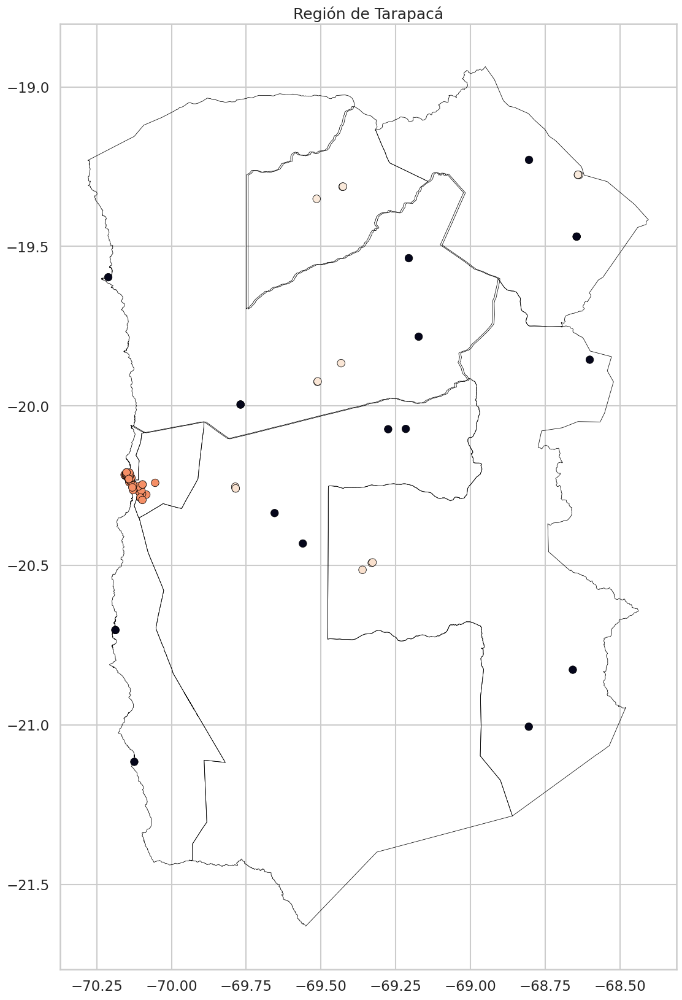

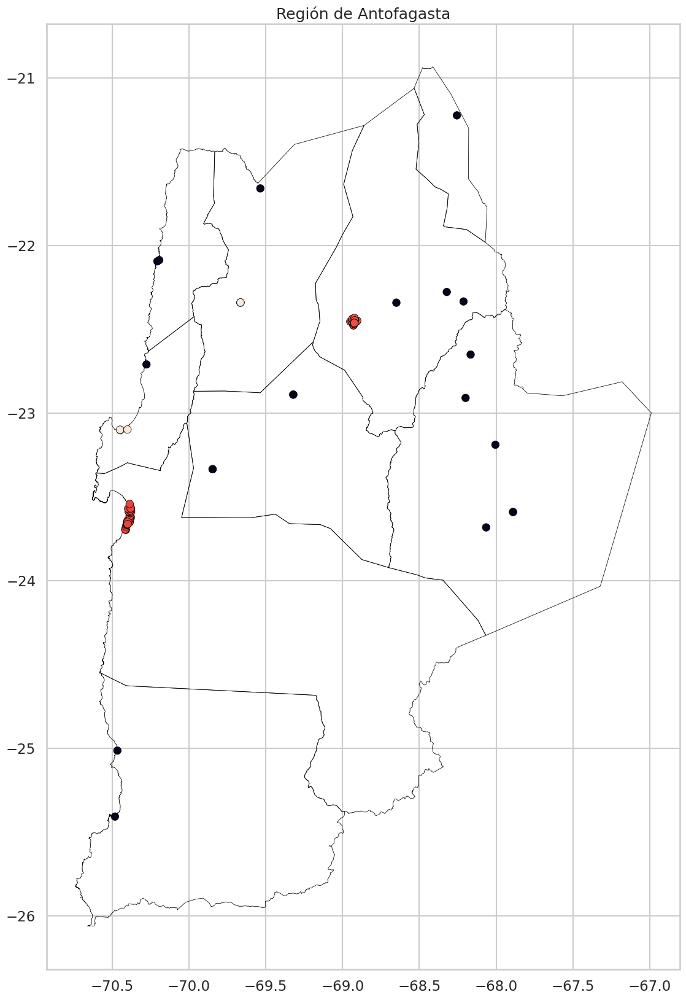

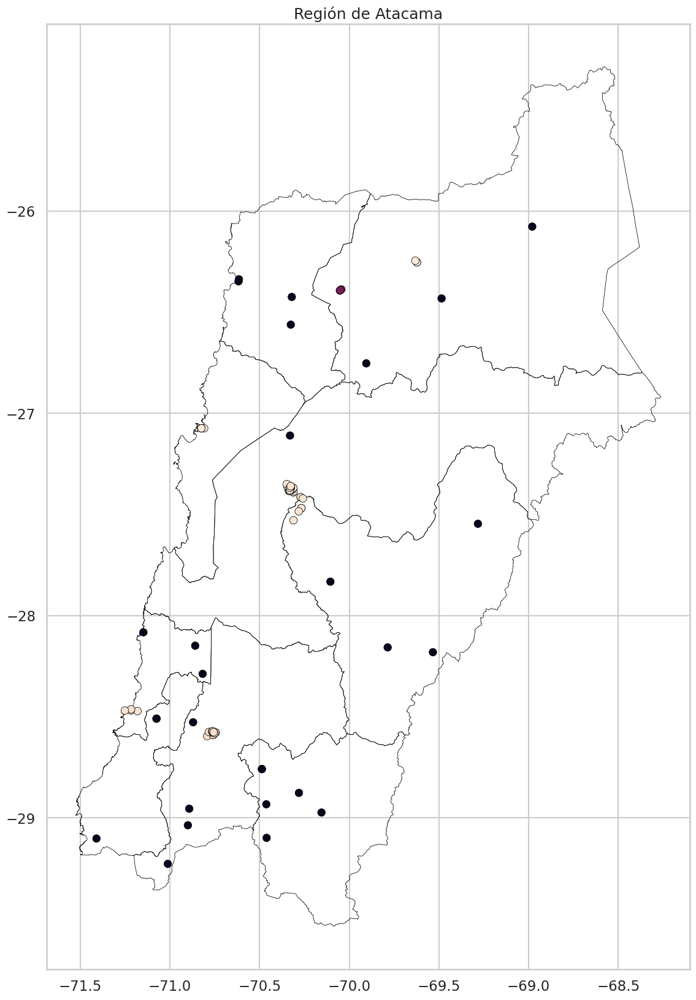

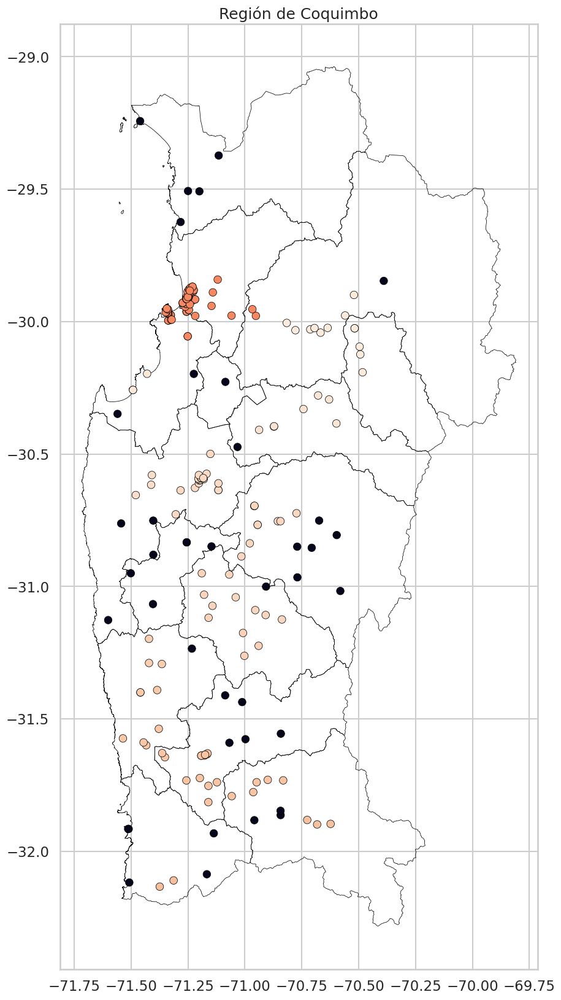

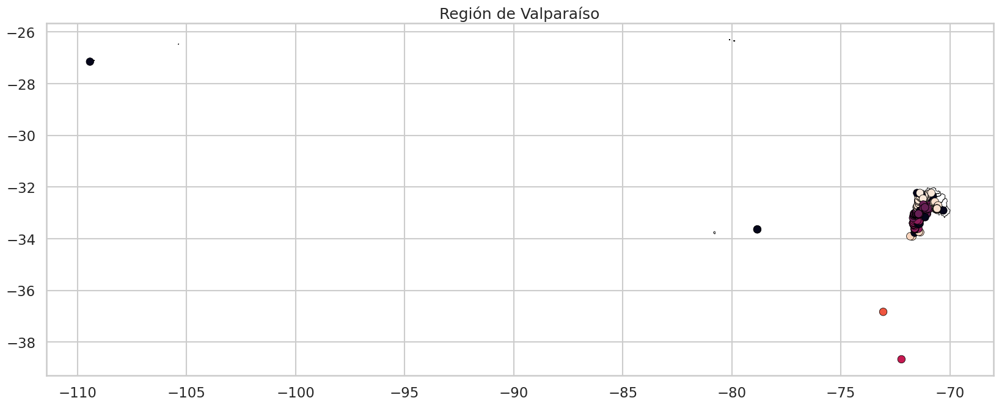

...

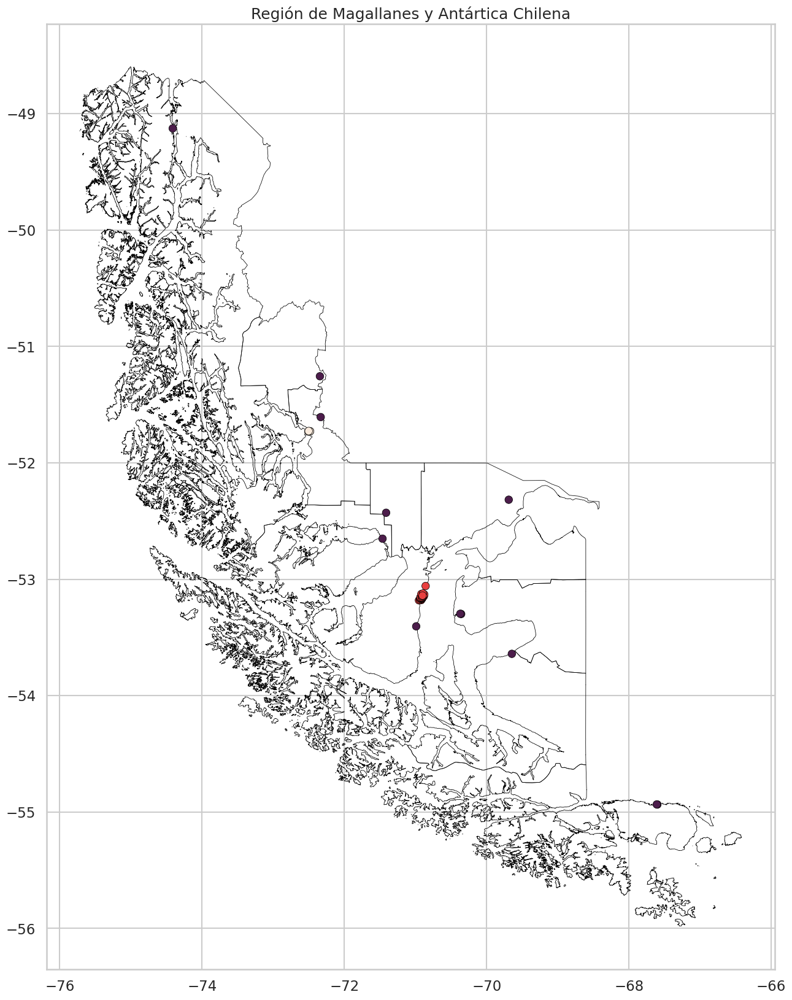

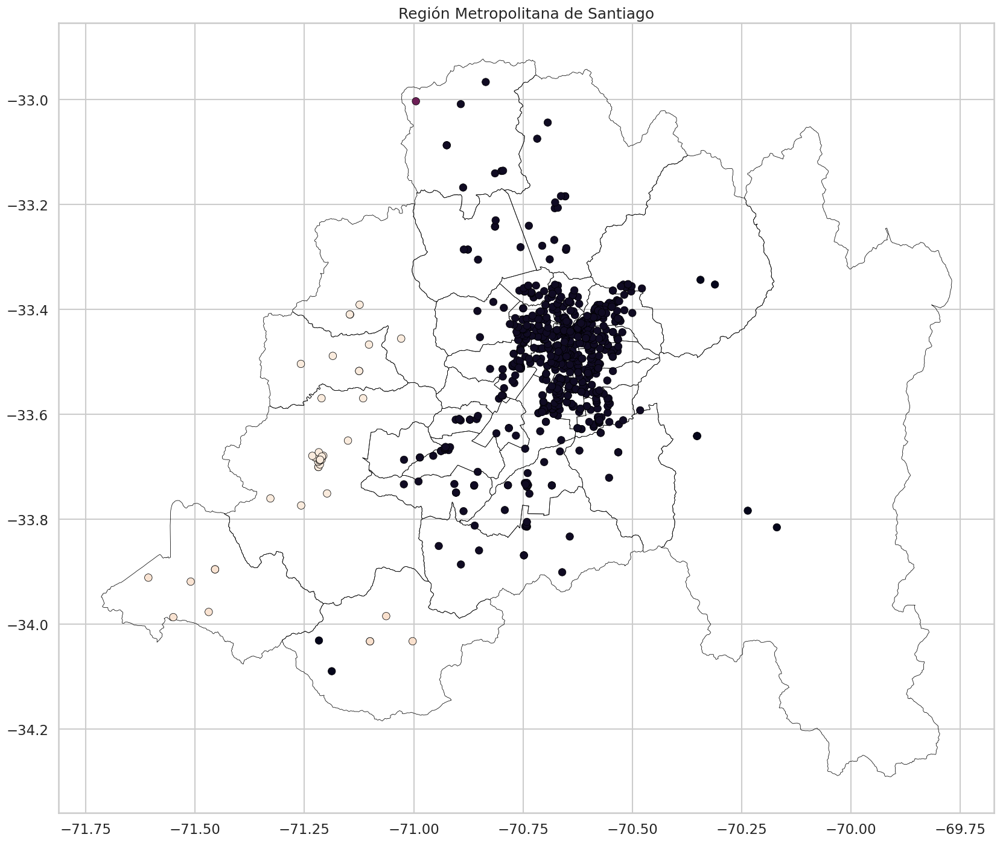

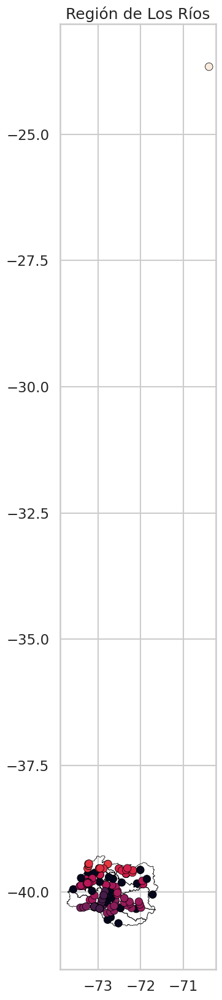

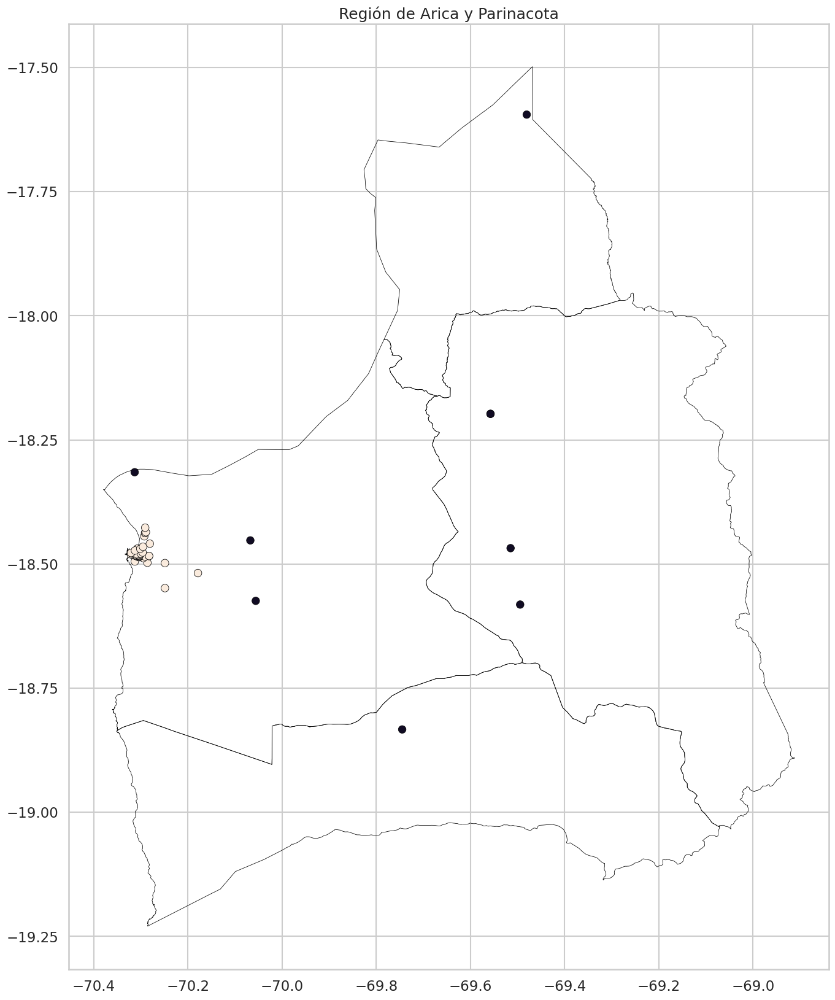

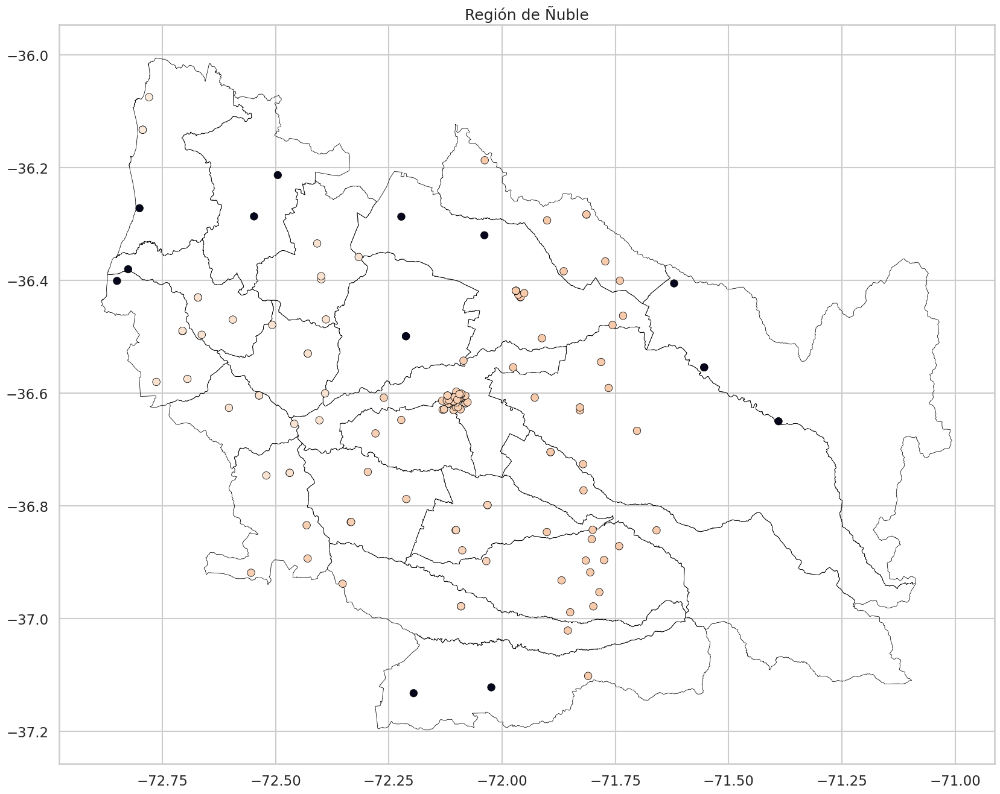

In [68]:
for i in range(1, 17): 
    gdf_selected_region = comunas[comunas['código_región'] == i] 
    gdf_selected_region_hospitals = gdf_hospitales[gdf_hospitales['código_región'] == i]
    
    overlay = gdf_selected_region.overlay(gdf_selected_region_hospitals, how="union", keep_geom_type=False)

    overlay['Cluster'] = overlay['Cluster'].fillna(-2)

    fig, ax = plt.subplots(figsize=[20, 20])

    # Establecer el color de fondo del eje
    ax.set_facecolor("white")

    ax.set_title(gdf_selected_region["nombre_región"].unique()[0])

    # Establecer el color de fondo de la superposición
    overlay.plot(column="Cluster", ax=ax, edgecolor="black", linewidth=0.55, facecolor="none", legend=False)

    plt.show()


In [72]:
clusters_sin_todas = set()
for i in gdf_hospitales['Cluster'].unique(): #Recorre cada cluster e imprime la información de cada uno 
    cluster = gdf_hospitales[gdf_hospitales['Cluster'] == i]
    print(f"El cluster {i} tiene centros de salud de complejidades {cluster['nivel_de_complejidad'].unique()}")
    print()
    if len(cluster['nivel_de_complejidad'].unique()) < 3: #Si no tiene todos los niveles de complejida lo agrega al set que contiene este tipo de clusters 
        clusters_sin_todas.add(i)

El cluster -1 tiene centros de salud de complejidades ['Baja Complejidad', 'Mediana Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 0 tiene centros de salud de complejidades ['Mediana Complejidad', 'Baja Complejidad', 'Alta Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 1 tiene centros de salud de complejidades ['Baja Complejidad', 'Mediana Complejidad', 'Alta Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 2 tiene centros de salud de complejidades ['Mediana Complejidad', 'Baja Complejidad', 'Alta Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 3 tiene centros de salud de complejidades ['Mediana Complejidad', 'Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluste

In [73]:
len(clusters_sin_todas) #Cantidad de clusters que no tienen todos los niveles de complejidad 

105

In [70]:
clusters_sin_dos = set()
for i in gdf_hospitales['Cluster'].unique():
    cluster = gdf_hospitales[gdf_hospitales['Cluster'] == i]#Recorre cada cluster e imprime la información de cada uno 
    print(f"El cluster {i} tiene centros de salud de complejidades {cluster['nivel_de_complejidad'].unique()}")
    print()
    if len(cluster['nivel_de_complejidad'].unique()) < 2:#Si tiene solo un nivel de complejida lo agrega al set que contiene este tipo de clusters
        clusters_sin_dos.add(i)

El cluster -1 tiene centros de salud de complejidades ['Baja Complejidad', 'Mediana Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 0 tiene centros de salud de complejidades ['Mediana Complejidad', 'Baja Complejidad', 'Alta Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 1 tiene centros de salud de complejidades ['Baja Complejidad', 'Mediana Complejidad', 'Alta Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 2 tiene centros de salud de complejidades ['Mediana Complejidad', 'Baja Complejidad', 'Alta Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 3 tiene centros de salud de complejidades ['Mediana Complejidad', 'Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluste

In [74]:
len(clusters_sin_dos) #Cantidad de clusters que tienen solo un nivel de complejidad 

84

In [75]:
for i in clusters_sin_dos:
    cluster = gdf_hospitales[gdf_hospitales['Cluster'] == i]
    print(f"El cluster {i} abarca las comunas {cluster['nombre_comuna'].unique()} y {cluster['nivel_de_complejidad'].unique()}")
    print()
#Se hace un print de aquellos que tienen solo un tipo de nivel de complejidad siendo todos de baja complejidad

El cluster 7 abarca las comunas ['QUINCHAO'] y ['Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 10 abarca las comunas ['MAULLÍN' 'LOS MUERMOS'] y ['Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 11 abarca las comunas ['PUERTO MONTT' 'MAULLÍN'] y ['Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 13 abarca las comunas ['COCHAMÓ' 'PUERTO VARAS'] y ['Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 14 abarca las comunas ['LOS MUERMOS' 'FRESIA'] y ['Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Complejidad']

El cluster 15 abarca las comunas ['LOS MUERMOS' 'FRESIA'] y ['Baja Complejidad']
Categories (3, object): ['Alta Complejidad', 'Baja Complejidad', 'Mediana Com

### Justificacion del Modelo


- Se escoge el modelo de DBSCAN, o llamado agrupación/clustering por densidad, el cuál es un algoritmo de aprendizaje no supervisado de Machine Learning. Pues se necesita conocer qué centros de salud forman una red por ubicación geográfica. Para saber si es posible el traslado entre centros de salud y ver si todas estas redes contienen los 3 tipos de complejidad. Con el fin de averiguar si las personas podrían tener problemas en buscar atención adecuada.

- Para hacer el modelo se hace uso de las variables de : latitud y longitud del dataframe de los hospitales(gdf_hospitales).Con estas variables se calcula la distancia cartesiana entre centros de salud.
- Se seleciona un ε de 0.1, ya que este radio nos entrega una cobertura óptima de redes que contienen centros de todas las complejidades, mientras que al mismo tiempo separa redes más pequeñas que son las que nos interesa analizar con mayor profundidad.
- Destacar en este caso no se considera como necesario normalizar los datos puesto que son coordenadas y no valores valores numericos que representen una cantidad.
- Al ser un modelo de aprendizaje no supervizado, no hay validaciones a realizar. Debido a que es el modelo el que encuentra la solución y no hay etiquetas para saber si el modelo está correcto.

#### Explicación del modelo

Cada punto representa un centro de salud y el color representa a que red de centros de centros de salud pertenece, de los 100 grupos que encontramos que son redes de centros de salud hay 83 grupos de hospitales que solo tienen baja complejidad



## ¿Qué podría salir mal?

En el modelo de clasificaciones, podrían existir problemas en tanto al hacer la agrupación no se tiene en consideración la conformación geográfica de cada zona. Debido a que el traslado a un cluster o  dentro de un cluster es diferente dentro de cada zona, ya que puede existir o no una carretera, cerros, canales de agua, transporte público (metro/micros), etc. Factores no conocidos ahora que  determinan la accecibilidad al centro. Ello no siendo considerado en el análisis. 
Por lo tanto, para hacer un futuro análisis sobre necesidad de contrucción de servicios para clusters ya existentes o zonas fuera de estos, es que hay que tener en cuenta cuán facil es llegar a estos lugares. Además un factor importante es la cantidad de recursos económicos que hay en diferentes localidades para instalar y mantener los centros. Ya que, no porque haya más cantidad de poblaciones o más necesidad de un centro implica que existe la posibilidad de construir sin mayor aporte exteerno al existente por division territorial.

En segundo lugar los resultados encontrados respecto a cómo se ve la correlación de cantidad de población y existencia de servicios médicos/farmacias (siendo positiva), es que estos deben ser una referencia. Sin embargo, no tienen una actualización respecto a la cantidad de personas, lo que con datos actuales podría mover los gráficos y las conclusiones. Teniendo en cuenta que son datos desde hace casi 6 años y han ocurrido múltiples hechos médicos/sociales que quedan fuera en los datos utilizados.

Por otro lado, en los resultados de que hay comunas que si tienen farmacias,no se podría descartar inmediatamente que estas tengan toda la demanda de la población en esa localidad y por ende no considerar la construcción de más.

En el modelo de clustering:

Por razones de dificultad nos restringimos a definir el epsilon del radio en medida del angulo, es decir nuestro epsilon de 0.1 representa una distancia de 0.1 grados de latitud y longitud, esto significa que la distancia geografica que representa el radio varia segun la longitud donde estamos parados ya que al alejarse de el ecuador la distancia real representada por un cambio arbitrario de grados de latitud es cada vez menor. Por esto el clustering que utiliza la distancia euclideana siempre calcula como si las coordenadas estuvieran en un mundo plano, resultando en que la presicion de la distancia real va disminuyendo al llegar a puntos que estan mas al sur.


## Conclusión final

Con los análisis realizados a lo largo del presente trabajo, es que las autoridades y figuras encargadas de permitir/gestionar/proponer la construcción de servicios de salud y farmacias. Deben gestionar un estudio respecto a la necesidad que podrían estar viviendo aquellas comunas que no poseen farmacias y/o algún tipo de urgencia. Debido al riesgo de dejar zonas sin acceso cercano a establecimientos que proveen asistencia en temas médicos. Por otro lado, en un posible uso de los resultados, es siempre necesario que se tome en consideración cómo funciona cada localidad, los recursos, la geografía y las necesidades actuales de su población. 
Es importante también considerar otras posibles herramientas o variantes de los métodos de Machine Learning para un ajuste que ayude lo mayor posible a conocer donde hay falencias en la distribución. 